Receptor Density Maps

In [1]:
# Import all necessary libraries
#requires the python ennv neuroenv
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import nilearn
import nibabel as nib
import sklearn
import scipy
import scipy.stats as stats
from scipy.stats import norm
from scipy.stats import shapiro
from scipy.stats import percentileofscore
#from nilearn import datasets
#from nilearn.image import resample_to_img

In [2]:
import neuromaps 
from neuromaps.datasets import fetch_atlas
from neuromaps.datasets import available_annotations
from neuromaps.datasets import available_tags
from neuromaps.datasets import fetch_annotation
from netneurotools import datasets as nntdata
from netneurotools import datasets
from neuromaps.parcellate import Parcellater
from neuromaps.images import dlabel_to_gifti
from neuromaps import transforms

In [3]:
mni152 = fetch_atlas('MNI152', '2mm')

In [4]:
#All possible PET annotations
for annotation in available_annotations(tags=['PET'],space='MNI152'):
    print(annotation)

('aghourian2017', 'feobv', 'MNI152', '1mm')
('alarkurtti2015', 'raclopride', 'MNI152', '3mm')
('bedard2019', 'feobv', 'MNI152', '1mm')
('beliveau2017', 'az10419369', 'MNI152', '1mm')
('beliveau2017', 'cimbi36', 'MNI152', '1mm')
('beliveau2017', 'cumi101', 'MNI152', '1mm')
('beliveau2017', 'dasb', 'MNI152', '1mm')
('beliveau2017', 'sb207145', 'MNI152', '1mm')
('ding2010', 'mrb', 'MNI152', '1mm')
('dubois2015', 'abp688', 'MNI152', '1mm')
('dukart2018', 'flumazenil', 'MNI152', '3mm')
('dukart2018', 'fpcit', 'MNI152', '3mm')
('fazio2016', 'madam', 'MNI152', '3mm')
('finnema2016', 'ucbj', 'MNI152', '1mm')
('gallezot2010', 'p943', 'MNI152', '1mm')
('gallezot2017', 'gsk189254', 'MNI152', '1mm')
('hesse2017', 'methylreboxetine', 'MNI152', '3mm')
('hillmer2016', 'flubatine', 'MNI152', '1mm')
('jaworska2020', 'fallypride', 'MNI152', '1mm')
('kaller2017', 'sch23390', 'MNI152', '3mm')
('kantonen2020', 'carfentanil', 'MNI152', '3mm')
('laurikainen2018', 'fmpepd2', 'MNI152', '1mm')
('naganawa2020', 

In [4]:
#load in schaefer MNI space
from nilearn.datasets import fetch_atlas_schaefer_2018
atlas_schaef_400 = fetch_atlas_schaefer_2018(n_rois=400)
print(atlas_schaef_400)


[get_dataset_dir] Dataset found in /Users/ntaylor/nilearn_data/schaefer_2018

{'maps': '/Users/ntaylor/nilearn_data/schaefer_2018/Schaefer2018_400Parcels_7Networks_order_FSLMNI152_1mm.nii.gz', 'labels': array([b'7Networks_LH_Vis_1', b'7Networks_LH_Vis_2',
       b'7Networks_LH_Vis_3', b'7Networks_LH_Vis_4',
       b'7Networks_LH_Vis_5', b'7Networks_LH_Vis_6',
       b'7Networks_LH_Vis_7', b'7Networks_LH_Vis_8',
       b'7Networks_LH_Vis_9', b'7Networks_LH_Vis_10',
       b'7Networks_LH_Vis_11', b'7Networks_LH_Vis_12',
       b'7Networks_LH_Vis_13', b'7Networks_LH_Vis_14',
       b'7Networks_LH_Vis_15', b'7Networks_LH_Vis_16',
       b'7Networks_LH_Vis_17', b'7Networks_LH_Vis_18',
       b'7Networks_LH_Vis_19', b'7Networks_LH_Vis_20',
       b'7Networks_LH_Vis_21', b'7Networks_LH_Vis_22',
       b'7Networks_LH_Vis_23', b'7Networks_LH_Vis_24',
       b'7Networks_LH_Vis_25', b'7Networks_LH_Vis_26',
       b'7Networks_LH_Vis_27', b'7Networks_LH_Vis_28',
       b'7Networks_LH_Vis_29', b'7Networks_LH_Vis_30',
       b'7Networks_LH_Vis_31', b'7Networks_LH_SomMot_1',
  

Load in the pre-parcellated data from Justine Hansen - https://github.com/netneurolab/hansen_receptors/tree/main/data/PET_parcellated/scale400

https://www.nature.com/articles/s41593-022-01186-3

In [5]:
import numpy as np
from netneurotools import datasets as nntdata
#from netneurotools import plotting
from matplotlib.colors import ListedColormap
from scipy.stats import zscore
from nilearn.datasets import fetch_atlas_schaefer_2018

path = '/Users/ntaylor/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/PhD/Code/neuromaps'

scale = 'scale400'

schaefer = fetch_atlas_schaefer_2018(n_rois=400)
nnodes = len(schaefer['labels'])

# concatenate the receptors

receptors_csv = [path+'/PET_parcellated/'+scale+'/5HT1a_way_hc36_savli.csv',
                 path+'/PET_parcellated/'+scale+'/5HT1b_p943_hc22_savli.csv',
                 path+'/PET_parcellated/'+scale+'/5HT1b_p943_hc65_gallezot.csv',
                 path+'/PET_parcellated/'+scale+'/5HT2a_cimbi_hc29_beliveau.csv',
                 path+'/PET_parcellated/'+scale+'/5HT4_sb20_hc59_beliveau.csv',
                 path+'/PET_parcellated/'+scale+'/5HT6_gsk_hc30_radhakrishnan.csv',
                 path+'/PET_parcellated/'+scale+'/5HTT_dasb_hc100_beliveau.csv',
                 path+'/PET_parcellated/'+scale+'/A4B2_flubatine_hc30_hillmer.csv',
                 path+'/PET_parcellated/'+scale+'/CB1_omar_hc77_normandin.csv',
                 path+'/PET_parcellated/'+scale+'/D1_SCH23390_hc13_kaller.csv',
                 path+'/PET_parcellated/'+scale+'/D2_flb457_hc37_smith.csv',
                 path+'/PET_parcellated/'+scale+'/D2_fallypride_hc49_jaworska.csv',
                 path+'/PET_parcellated/'+scale+'/DAT_fpcit_hc174_dukart_spect.csv',
                 path+'/PET_parcellated/'+scale+'/GABAa-bz_flumazenil_hc16_norgaard.csv',
                 path+'/PET_parcellated/'+scale+'/H3_cban_hc8_gallezot.csv', 
                 path+'/PET_parcellated/'+scale+'/M1_lsn_hc24_naganawa.csv',
                 path+'/PET_parcellated/'+scale+'/mGluR5_abp_hc22_rosaneto.csv',
                 path+'/PET_parcellated/'+scale+'/mGluR5_abp_hc28_dubois.csv',
                 path+'/PET_parcellated/'+scale+'/mGluR5_abp_hc73_smart.csv',
                 path+'/PET_parcellated/'+scale+'/MU_carfentanil_hc204_kantonen.csv',
                 path+'/PET_parcellated/'+scale+'/NAT_MRB_hc77_ding.csv',
                 path+'/PET_parcellated/'+scale+'/NMDA_ge179_hc29_galovic.csv',
                 path+'/PET_parcellated/'+scale+'/VAChT_feobv_hc3_spreng.csv',
                 path+'/PET_parcellated/'+scale+'/VAChT_feobv_hc4_tuominen.csv',
                 path+'/PET_parcellated/'+scale+'/VAChT_feobv_hc5_bedard_sum.csv',
                 path+'/PET_parcellated/'+scale+'/VAChT_feobv_hc18_aghourian_sum.csv']

# combine all the receptors (including repeats)
r = np.zeros([nnodes, len(receptors_csv)])
for i in range(len(receptors_csv)):
    r[:, i] = np.genfromtxt(receptors_csv[i], delimiter=',')

receptor_names = np.array(["5HT1a", "5HT1b", "5HT2a", "5HT4", "5HT6", "5HTT", "A4B2",
                           "CB1", "D1", "D2", "DAT", "GABAa", "H3", "M1", "mGluR5",
                           "MOR", "NET", "NMDA", "VAChT"])
#np.save(path+'/receptor_names_pet.npy', receptor_names)


[get_dataset_dir] Dataset found in /Users/ntaylor/nilearn_data/schaefer_2018

In [6]:
# make final region x receptor matrix
receptor_data = np.zeros([nnodes, len(receptor_names)])
receptor_data[:, 0] = r[:, 0]
receptor_data[:, 2:9] = r[:, 3:10]
receptor_data[:, 10:14] = r[:, 12:16]
receptor_data[:, 15:18] = r[:, 19:22]

In [7]:
## receptor_data will be defined by the 19 different names of receptor_names
# weighted average of 5HT1B p943
receptor_data[:, 1] = (zscore(r[:, 1])*22 + zscore(r[:, 2])*65) / (22+65)

# weighted average of D2 flb457
receptor_data[:, 9] = (zscore(r[:, 10])*37 + zscore(r[:, 11])*55) / (37+55)

# weighted average of mGluR5 ABP688
receptor_data[:, 14] = (zscore(r[:, 16])*22 + zscore(r[:, 17])*28 + zscore(r[:, 18])*73) / (22+28+73)

# weighted average of VAChT FEOBV
receptor_data[:, 18] = (zscore(r[:, 22])*3 + zscore(r[:, 23])*4 + zscore(r[:, 24])+ zscore(r[:, 25])) / \
                       (3+4+5+18)

Plot of the receptors onto the schaefer cortex

In [8]:
# Plot receptor Data onto brain
from netneurotools.plotting import plot_fsaverage
from netneurotools.datasets import fetch_schaefer2018
import numpy as np
from matplotlib.colors import ListedColormap

Look at Receptor Distributions vs Regions that are significantly different in PC values

In [9]:
#load in the avg PC for each grp

#directory of load in data
path ='/Users/ntaylor/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/Postdoc_Rob/Analysis/Graph_Theory/schaef_400/csf_regress_redo'

#load in the avg PC for each grp
avg_pc_del = np.genfromtxt(path + '/avg_pc_del.csv', delimiter=',')
avg_pc_nondel = np.genfromtxt(path + '/avg_pc_nondel.csv', delimiter=',')
sig_avg_pc = np.genfromtxt(path + '/significant_rois_avg_pc.csv', delimiter=',')
#create only pc values for the 400 schaef regions
avg_pc_del_400 = avg_pc_del[:,0:400]
avg_pc_nondel_400 = avg_pc_nondel[:,0:400]

In [10]:
mean_pc_del = np.mean(avg_pc_del_400, axis=0)
mean_pc_nondel = np.mean(avg_pc_nondel_400, axis=0)

In [ ]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

# Calculate the correlation between avg_pc_del and receptor_data
correlations = np.corrcoef(receptor_data.T, mean_pc_del.T)
#correlations = np.corrcoef(receptor_data.T, avg_pc_del_400.T)
# Extract the relevant part of the correlation matrix
correlations = correlations[:-1, -1]

# Create a DataFrame for easier plotting
correlation_df = pd.DataFrame(correlations, index=receptor_names, columns=['Correlation'])

# Plot the linear relationship for each receptor
# Plot the correlation matrix
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_df.T, annot=True, cmap='coolwarm', center=0)
plt.title('Correlation between Avg. PC Delirium and Receptor Data')
plt.show()

# Plot the linear relationship for each receptor
for i in range(len(receptor_names)):
    plt.figure(figsize=(8, 6))
    sns.regplot(x=mean_pc_del.flatten(), y=receptor_data[:, i])
    plt.xlabel('avg_pc_del')
    plt.ylabel(receptor_names[i])  # Access receptor name using indexing
    plt.title(f'Linear Relationship between avg_pc_del and {receptor_names[i]}')
    plt.show()

In [12]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import netneurotools.stats as stats
# Assuming receptor_data, avg_pc_del, avg_pc_nondel, and receptor_names are already loaded

# Calculate the correlation between avg_pc_del and receptor_data
[correlations_del,pvalue_del]=stats.permtest_pearsonr(receptor_data,mean_pc_del, n_perm=1000)

# Calculate the correlation between avg_pc_nondel and receptor_data
[correlations_nondel,pvalue_nondel]=stats.permtest_pearsonr(receptor_data,mean_pc_nondel, n_perm=1000)

# Create DataFrames for easier plotting
# Create DataFrames for easier plotting
correlation_df_del = pd.DataFrame({
    'Receptor': receptor_names,
    'Correlation': correlations_del,
    'P-Value Permuted': pvalue_del
})

correlation_df_nondel = pd.DataFrame({
    'Receptor': receptor_names,
    'Correlation': correlations_nondel,
    'P-Value Permuted': pvalue_nondel
})

# Define the significance threshold
significance_threshold = 0.05

# Filter the DataFrame for significant results
significant_results_del = correlation_df_del[correlation_df_del['P-Value Permuted'] < significance_threshold]
significant_results_nondel = correlation_df_nondel[correlation_df_nondel['P-Value Permuted'] < significance_threshold]

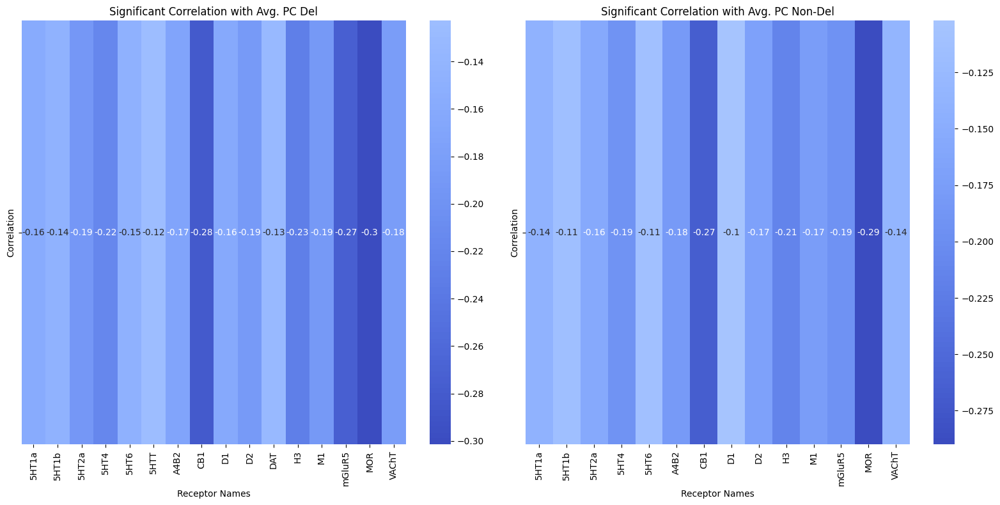

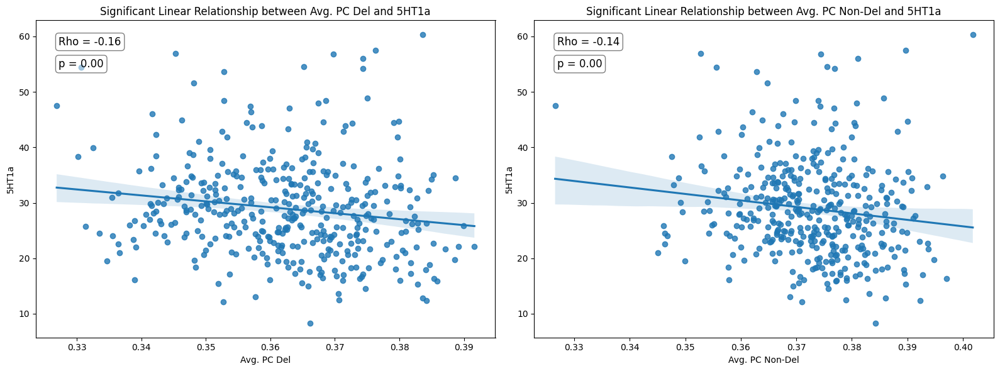

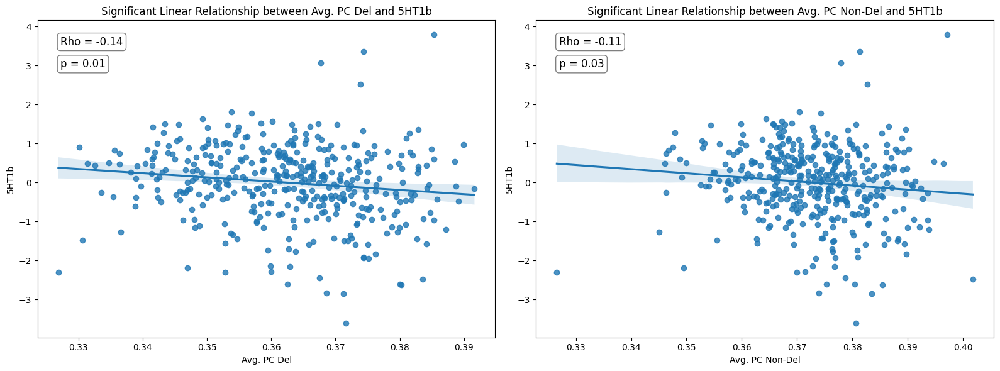

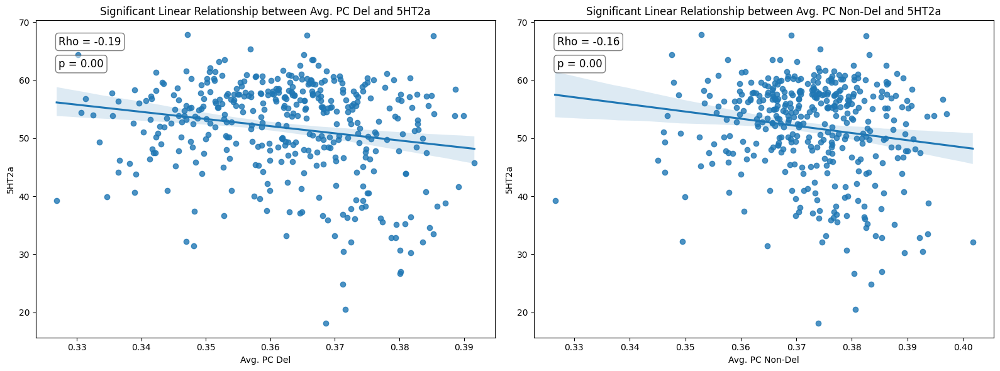

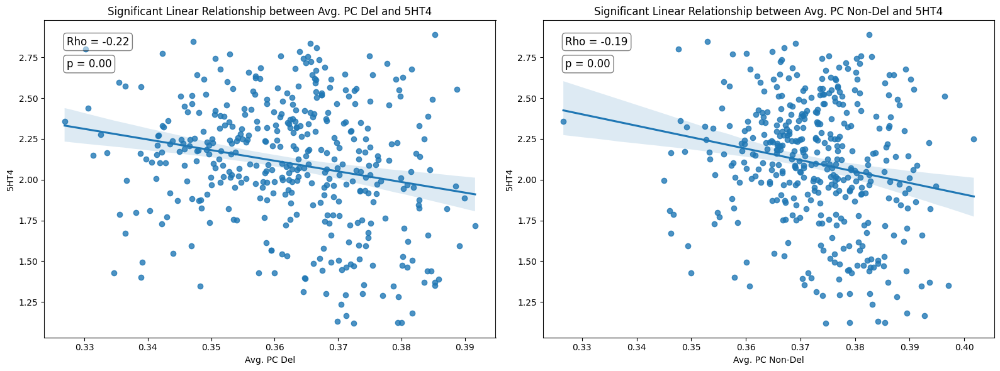

...

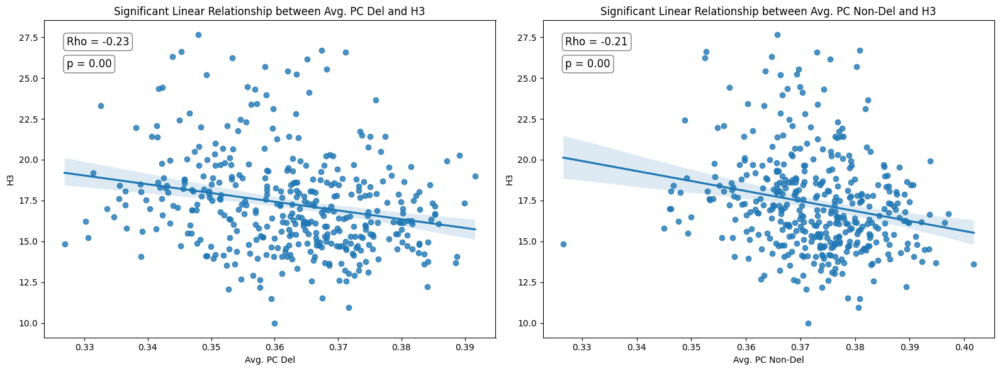

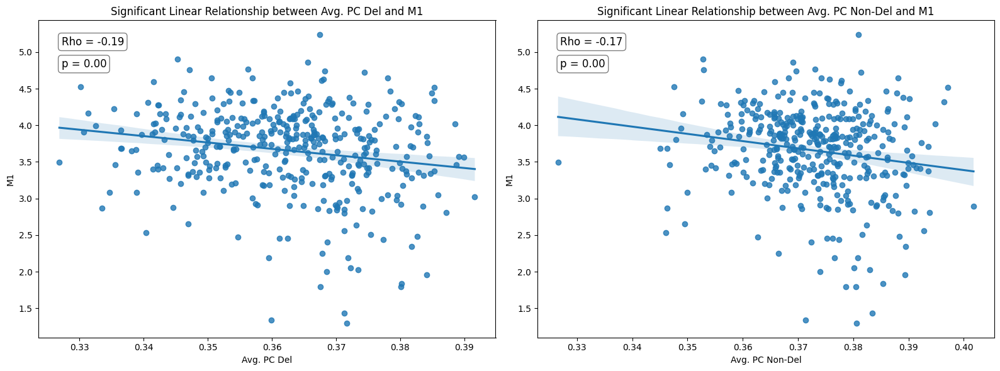

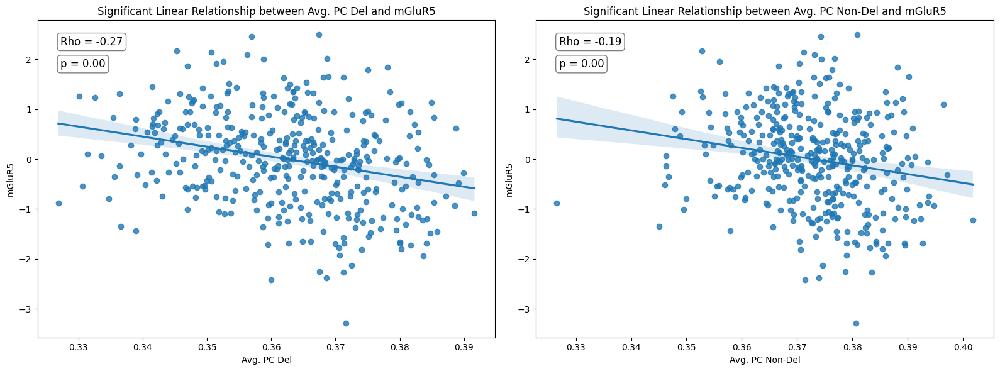

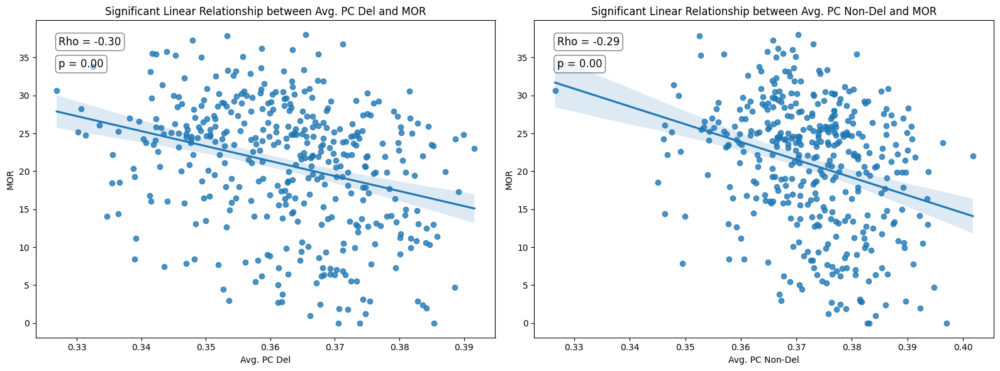

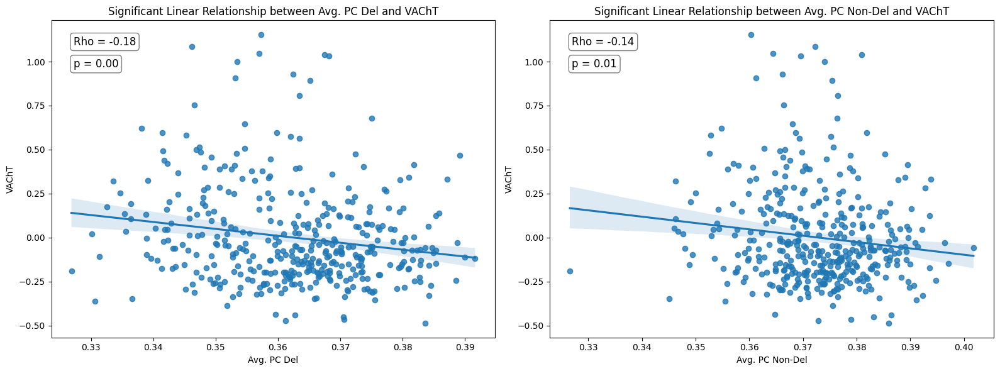

In [13]:
# Ensure significant_results_del and significant_results_nondel contain numeric data for plotting
if 'Correlation' in significant_results_del.columns and 'Correlation' in significant_results_nondel.columns:
    correlation_values_del = significant_results_del[['Correlation']].astype(float)
    correlation_values_nondel = significant_results_nondel[['Correlation']].astype(float)
else:
    raise ValueError("One of the significant_results DataFrames does not contain a 'Correlation' column.")

# Plot the correlation matrices side by side
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Heatmap for significant_results_del
sns.heatmap(correlation_values_del.T, annot=True, cmap='coolwarm', center=0, 
            xticklabels=significant_results_del['Receptor'], ax=axes[0])
axes[0].set_title('Significant Correlation with Avg. PC Del')
axes[0].set_xlabel('Receptor Names')

# Heatmap for significant_results_nondel
sns.heatmap(correlation_values_nondel.T, annot=True, cmap='coolwarm', center=0, 
            xticklabels=significant_results_nondel['Receptor'], ax=axes[1])
axes[1].set_title('Significant Correlation with Avg. PC Non-Del')
axes[1].set_xlabel('Receptor Names')

plt.tight_layout()
plt.show()

# Iterate over significant receptors for both del and nondel
for receptor in significant_results_nondel['Receptor']:
    i = np.where(receptor_names == receptor)[0][0]  # Find the corresponding index in receptor_names
    
    # Create side-by-side plots
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    
    # Plot for Avg. PC Del
    sns.regplot(x=mean_pc_del.flatten(), y=receptor_data[:, i], ax=axes[0])
    axes[0].set_xlabel('Avg. PC Del')
    axes[0].set_ylabel(receptor)
    axes[0].set_title(f'Significant Linear Relationship between Avg. PC Del and {receptor}')
    
    # Calculate correlation for Avg. PC Del
    rho_del = np.corrcoef(mean_pc_del.flatten(), receptor_data[:, i])[0, 1]
    pval_del = significant_results_del[significant_results_del['Receptor'] == receptor]['P-Value Permuted'].values[0]
    
    # Add correlation and p-value text for Avg. PC Del
    axes[0].text(0.05, 0.95, f'Rho = {rho_del:.2f}', transform=axes[0].transAxes, 
                 fontsize=12, verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
    axes[0].text(0.05, 0.88, f'p = {pval_del:.2f}', transform=axes[0].transAxes, 
                 fontsize=12, verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
    
    # Plot for Avg. PC Non-Del
    sns.regplot(x=mean_pc_nondel.flatten(), y=receptor_data[:, i], ax=axes[1])
    axes[1].set_xlabel('Avg. PC Non-Del')
    axes[1].set_ylabel(receptor)
    axes[1].set_title(f'Significant Linear Relationship between Avg. PC Non-Del and {receptor}')
    
    # Calculate correlation for Avg. PC Non-Del
    rho_nondel = np.corrcoef(mean_pc_nondel.flatten(), receptor_data[:, i])[0, 1]
    pval_nondel = significant_results_nondel[significant_results_nondel['Receptor'] == receptor]['P-Value Permuted'].values[0]
    
    # Add correlation and p-value text for Avg. PC Non-Del
    axes[1].text(0.05, 0.95, f'Rho = {rho_nondel:.2f}', transform=axes[1].transAxes, 
                 fontsize=12, verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
    axes[1].text(0.05, 0.88, f'p = {pval_nondel:.2f}', transform=axes[1].transAxes, 
                 fontsize=12, verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
    
    plt.tight_layout()
    plt.show()

In [15]:
# diff between del and non del
diff_mean_pc_400 = mean_pc_del - mean_pc_nondel

In [16]:
# spin permutation
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr
from netneurotools import stats

# Calculate the observed correlation
#observed_correlations = [pearsonr(analyse_data, receptor_data[:, i])[0] for i in range(receptor_data.shape[1])]

analyse_data = diff_mean_pc_400
[corr,pvalue]=stats.permtest_pearsonr(analyse_data,receptor_data, n_perm=1000)

# Create a DataFrame for easier plotting
correlation_permuted = pd.DataFrame({
    'Receptor': receptor_names,
    'Correlation': corr,
    'P-Value Permuted': pvalue
})

# Define the significance threshold
significance_threshold = 0.05

# Filter the DataFrame for significant results
significant_results = correlation_permuted[correlation_permuted['P-Value Permuted'] < significance_threshold]

# Print the filtered DataFrame
print(correlation_permuted)

   Receptor  Correlation  P-Value Permuted
0     5HT1a    -0.075409          0.131868
1     5HT1b    -0.086034          0.088911
2     5HT2a    -0.109717          0.037962
3      5HT4    -0.105846          0.030969
4      5HT6    -0.095647          0.056943
5      5HTT    -0.106042          0.032967
6      A4B2    -0.041059          0.413586
7       CB1    -0.107108          0.026973
8        D1    -0.130651          0.006993
9        D2    -0.086588          0.101898
10      DAT    -0.130836          0.007992
11    GABAa    -0.118844          0.014985
12       H3    -0.094494          0.059940
13       M1    -0.080271          0.102897
14   mGluR5    -0.196075          0.000999
15      MOR    -0.110754          0.025974
16      NET    -0.026764          0.582418
17     NMDA    -0.085256          0.082917
18    VAChT    -0.120892          0.015984


Spin Permutation Test - for significance

In [17]:
# spin permutation
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr
from netneurotools import stats

# Calculate the observed correlation
#observed_correlations = [pearsonr(analyse_data, receptor_data[:, i])[0] for i in range(receptor_data.shape[1])]

analyse_data = diff_mean_pc_400
[corr,pvalue]=stats.permtest_pearsonr(analyse_data,receptor_data, n_perm=1000)

# Create a DataFrame for easier plotting
correlation_permuted = pd.DataFrame({
    'Receptor': receptor_names,
    'Correlation': corr,
    'P-Value Permuted': pvalue
})

# Define the significance threshold
significance_threshold = 0.05

# Filter the DataFrame for significant results
significant_results = correlation_permuted[correlation_permuted['P-Value Permuted'] < significance_threshold]

# Print the filtered DataFrame
print(correlation_permuted)
#print(significant_results)

   Receptor  Correlation  P-Value Permuted
0     5HT1a    -0.075409          0.131868
1     5HT1b    -0.086034          0.088911
2     5HT2a    -0.109717          0.037962
3      5HT4    -0.105846          0.030969
4      5HT6    -0.095647          0.056943
5      5HTT    -0.106042          0.032967
6      A4B2    -0.041059          0.413586
7       CB1    -0.107108          0.026973
8        D1    -0.130651          0.006993
9        D2    -0.086588          0.101898
10      DAT    -0.130836          0.007992
11    GABAa    -0.118844          0.014985
12       H3    -0.094494          0.059940
13       M1    -0.080271          0.102897
14   mGluR5    -0.196075          0.000999
15      MOR    -0.110754          0.025974
16      NET    -0.026764          0.582418
17     NMDA    -0.085256          0.082917
18    VAChT    -0.120892          0.015984


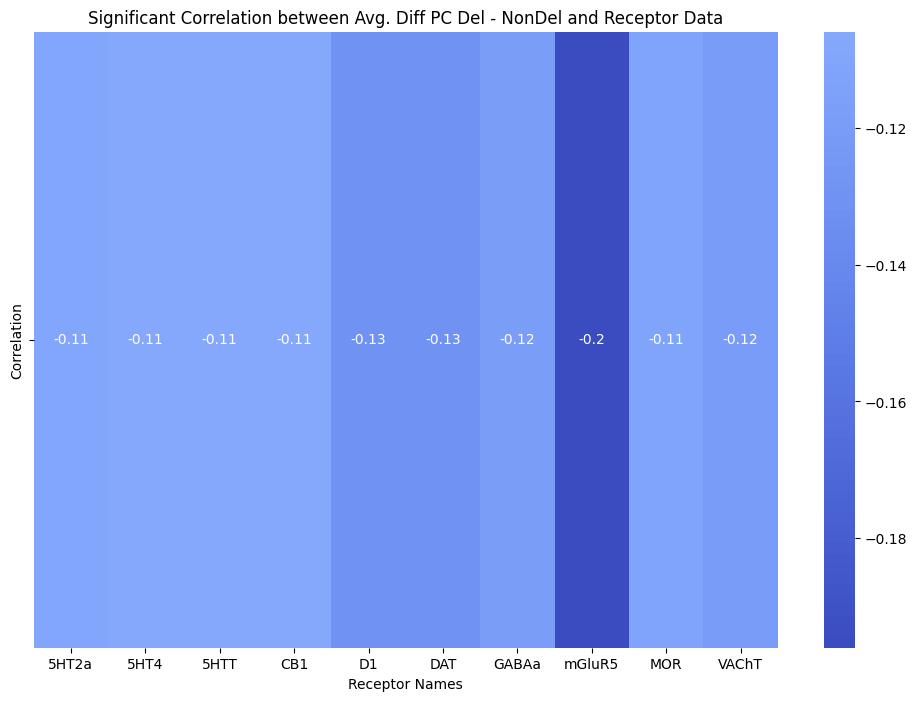

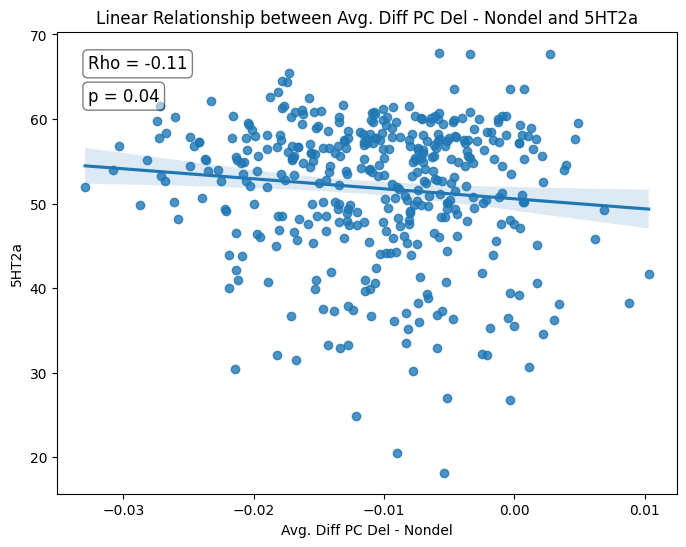

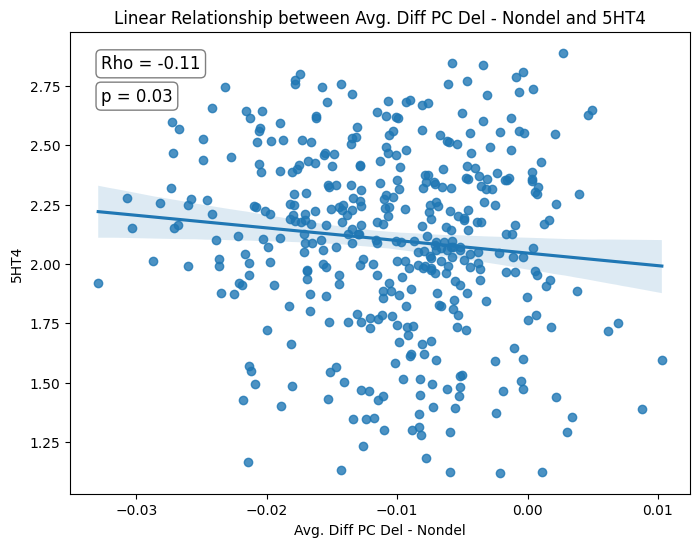

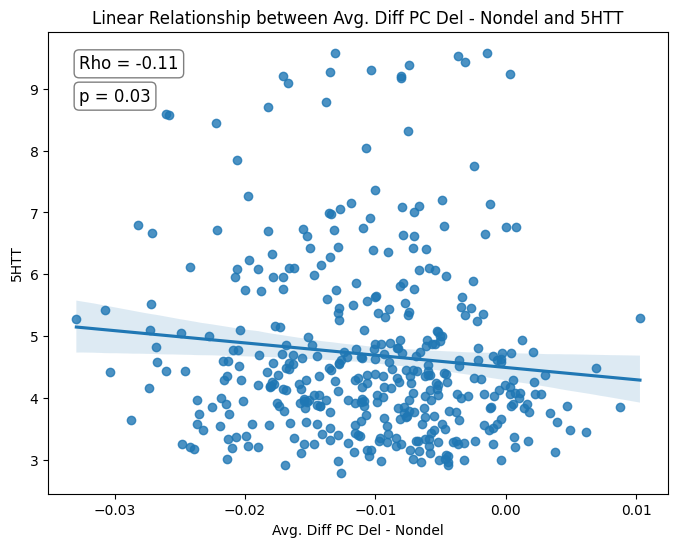

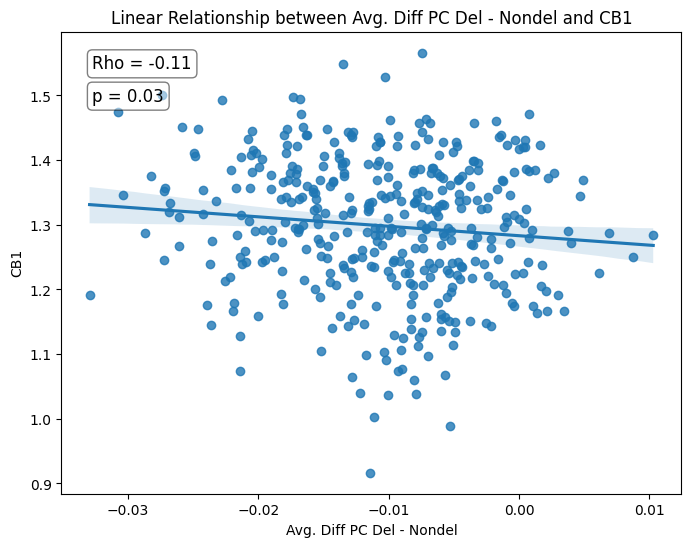

...

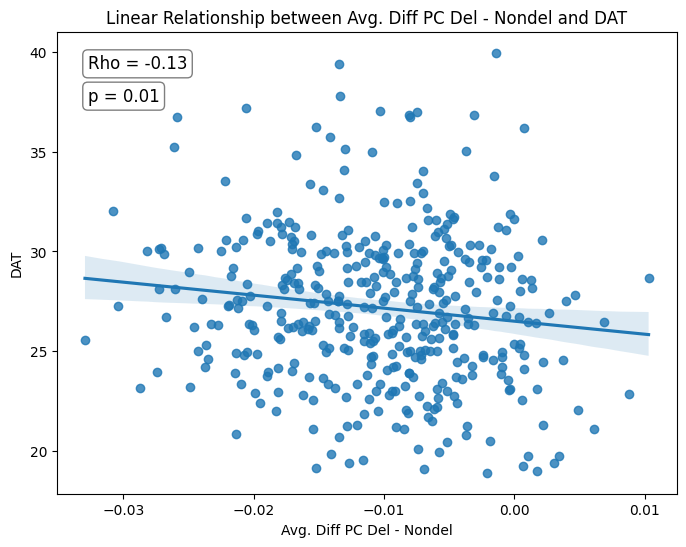

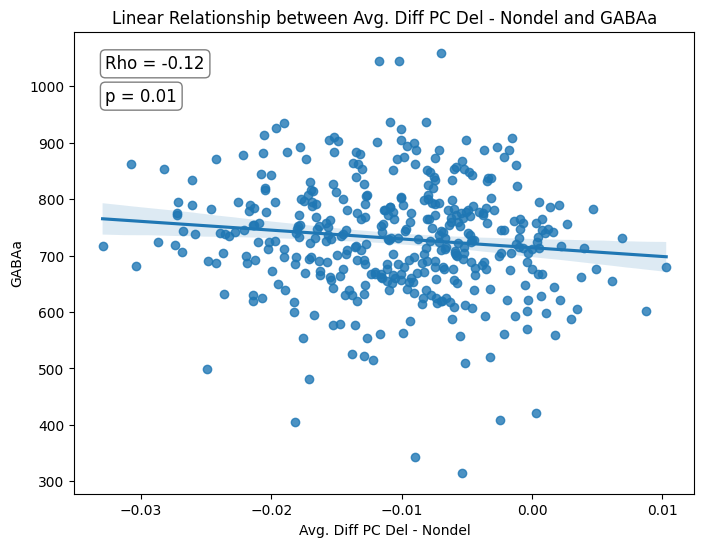

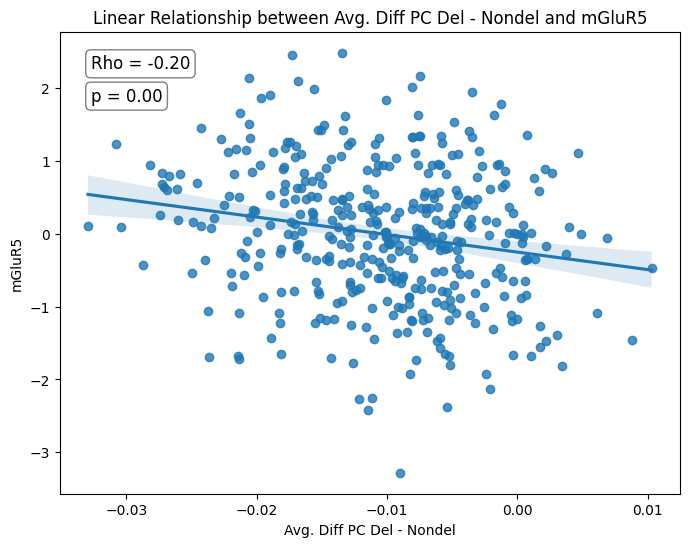

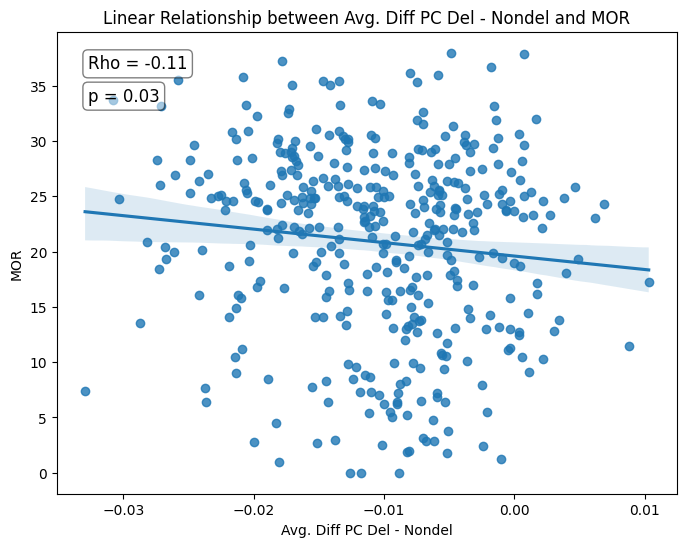

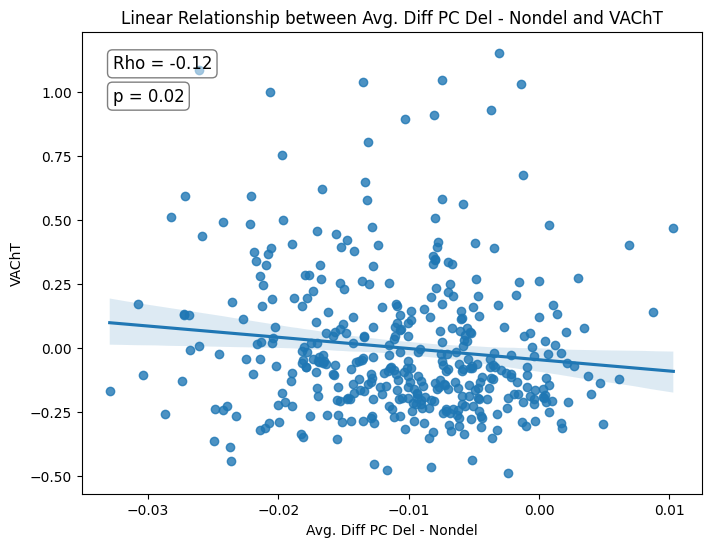

In [18]:
# Ensure significant_results contains numeric data for plotting
if 'Correlation' in significant_results.columns:
    correlation_values = significant_results[['Correlation']].astype(float)
else:
    raise ValueError("significant_results does not contain a 'Correlation' column.")

# Plot the correlation matrix
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_values.T, annot=True, cmap='coolwarm', center=0, xticklabels=significant_results['Receptor'])
plt.title('Significant Correlation between Avg. Diff PC Del - NonDel and Receptor Data')
plt.xlabel('Receptor Names')  # Add x-axis label
plt.show()

# Iterate over significant receptors
for receptor in significant_results.Receptor:  # Use the index of significant_results (receptor names)
    i = np.where(receptor_names == receptor)[0][0]  # Find the corresponding index in receptor_names
    
    plt.figure(figsize=(8, 6))
    sns.regplot(x=diff_mean_pc_400.flatten(), y=receptor_data[:, i])
    plt.xlabel('Avg. Diff PC Del - Nondel')
    plt.ylabel(receptor)
    plt.title(f'Linear Relationship between Avg. Diff PC Del - Nondel and {receptor}')
    
    # Calculate correlation
    rho = np.corrcoef(diff_mean_pc_400.flatten(), receptor_data[:, i])[0, 1]
    pval = significant_results[significant_results['Receptor'] == receptor]['P-Value Permuted'].values[0]
    
    plt.text(0.05, 0.95, f'Rho = {rho:.2f}', transform=plt.gca().transAxes, 
             fontsize=12, verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
    plt.text(0.05, 0.88, f'p = {pval:.2f}', transform=plt.gca().transAxes, 
             fontsize=12, verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
    
    plt.show()

## Look at the relationship when we loop through each region (across subjects)




In [22]:
#select data
analyse_data = avg_pc_del_400
subjects = analyse_data.shape[0]  # select subjects based on rows length

selected_receptors = ['NET','VAChT', 'M1','A4B2']
selected_indices = [np.where(receptor_names == receptor)[0][0] for receptor in selected_receptors]

# Perform permutation test for each subject
for s in range(subjects):
    corr, pvalue = stats.permtest_pearsonr(analyse_data[s, :], receptor_data[:, selected_indices], n_perm=1000)

# Create a DataFrame for easier plotting
correlation_permuted_ROIs = pd.DataFrame({
    'Receptor': selected_receptors,
    'Correlation': corr,
    'P-Value Permuted': pvalue
})

# Define the significance threshold
significance_threshold = 0.05

# Filter the DataFrame for significant results
significant_results = correlation_permuted_ROIs[correlation_permuted_ROIs['P-Value Permuted'] < significance_threshold]

# Print the filtered DataFrame
print(significant_results)

# Iterate over significant receptors


  Receptor  Correlation  P-Value Permuted
1    VAChT    -0.124796          0.014985
2       M1    -0.111112          0.023976


Plot the receptor distributions for specific regions - 
- see whether there are differences in receptor distribution for specific regions that are significantly different in PC for delirium vs non-del

In [5]:
#load in fc for the brain regions
path = '/Users/ntaylor/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/Postdoc_Rob/Analysis/Graph_Theory/schaef_400'

sig_pc_overtime_diff = np.genfromtxt(path + '/mean_diff_del_health_pc_avg_time.csv', delimiter=',')

selected_receptors = ['NET','VAChT', 'M1','A4B2']
selected_indices = [np.where(receptor_names == receptor)[0][0] for receptor in selected_receptors]


analyse_data = diff_mean_pc_400
[corr,pvalue]=stats.permtest_pearsonr(analyse_data,receptor_data[:,selected_indices], n_perm=1000)

# Create a DataFrame for easier plotting
correlation_permuted = pd.DataFrame({
    'Receptor': selected_receptors,
    'Correlation': corr,
    'P-Value Permuted': pvalue
})

# Define the significance threshold
significance_threshold = 0.05

# Filter the DataFrame for significant results
significant_results = correlation_permuted[correlation_permuted['P-Value Permuted'] < significance_threshold]

# Print the filtered DataFrame
print(correlation_permuted)


# Plot the linear relationship for each significant receptor in selected_indices
for receptor in significant_results['Receptor']:
    i = np.where(receptor_names == receptor)[0][0]
    plt.figure(figsize=(8, 6))
    sns.regplot(x=diff_mean_pc_400.flatten(), y=receptor_data[:, i])
    plt.xlabel('Avg. Diff PC Del - Nondel')
    plt.ylabel(receptor)
    plt.title(f'Linear Relationship between Avg. Diff PC Del - Nondel and {receptor}')
    # Calculate correlation and p-value
    rho = significant_results[significant_results['Receptor'] == receptor]['Correlation'].values[0]
    pval = significant_results[significant_results['Receptor'] == receptor]['P-Value Permuted'].values[0]
    plt.text(0.05, 0.95, f'Rho = {rho:.2f}', transform=plt.gca().transAxes,
             fontsize=12, verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
    plt.text(0.05, 0.88, f'p = {pval:.3f}', transform=plt.gca().transAxes,
             fontsize=12, verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
    plt.show()


NameError: name 'receptor_names' is not defined

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from nilearn import plotting, datasets, surface
from nilearn.surface import vol_to_surf

# Load the Schaefer 400 atlas
schaefer_atlas = datasets.fetch_atlas_schaefer_2018(n_rois=400, resolution_mm=1, yeo_networks=7)
atlas_filename = schaefer_atlas['maps']
labels = schaefer_atlas['labels']

# Create a DataFrame for receptor data
receptor_df = pd.DataFrame(receptor_data, columns=receptor_names)

# Load the fsaverage surface mesh
fsaverage = datasets.fetch_surf_fsaverage()

# Plot the receptor data onto the Schaefer 400 atlas
for receptor in receptor_names:
    # Sample the receptor data to the surface
    texture = vol_to_surf(atlas_filename, fsaverage.pial_left)
    
    # Create a 3D plot for each receptor
    fig, ax = plt.subplots(1, 1, subplot_kw={'projection': '3d'}, figsize=(10, 8))
    plotting.plot_surf_stat_map(
        fsaverage.pial_left,
        stat_map=texture,
        hemi='left',
        view='lateral',
        colorbar=True,
        title=f'{receptor} Distribution on Schaefer 400 Atlas',
        axes=ax
    )
    plt.show()

In [ ]:
receptor_interest = ['VAChT', 'M1']  # Assuming these are the names of the receptors

# Load the Schaefer 400 atlas
schaefer_atlas = datasets.fetch_atlas_schaefer_2018(n_rois=400, resolution_mm=1, yeo_networks=7)
atlas_filename = schaefer_atlas['maps']
labels = schaefer_atlas['labels']

# Filter receptor data based on receptor_interest
receptor_df = pd.DataFrame(receptor_data, columns=receptor_names)
receptor_df = receptor_df[receptor_interest]

# Project receptor data onto the surface mesh
fsaverage = datasets.fetch_surf_fsaverage()
for receptor in receptor_interest:
    # Sample the receptor data to the surface
    texture = vol_to_surf(atlas_filename, fsaverage.pial_left)
    
    # Create a 3D plot for each receptor
    fig, ax = plt.subplots(1, 1, subplot_kw={'projection': '3d'}, figsize=(10, 8))
    plotting.plot_surf_stat_map(
        fsaverage.pial_left,
        stat_map=texture,
        hemi='left',
        view='lateral',
        colorbar=True,
        title=f'{receptor} Distribution on Schaefer 400 Atlas',
        axes=ax
    )
    plt.show()

In [ ]:
# just significantly different in PC between del and non del for receptor data
sig_pc_receptors_roi = sig_avg_pc[0:400, np.newaxis] * receptor_data

In [ ]:
receptor_df = pd.DataFrame(receptor_data, columns=receptor_names)

In [76]:
# Load the Schaefer 400 atlas
schaefer_atlas = datasets.fetch_atlas_schaefer_2018(n_rois=400, resolution_mm=2, yeo_networks=17)

#annot = fetch_schaefer2018('fsaverage', verbose=False)['400Parcels17Networks']
nnodes = len(schaefer['labels'])
#coords = np.genfromtxt(path+'data/schaefer/figures/scahefer400/Schaefer_400_centres.txt')[:, 1:]
atlas_filename = schaefer_atlas['maps']
labels = schaefer_atlas['labels']

# Plot the VAChT receptor data onto the Schaefer 400 atlas
receptor = 'VAChT'
texture = vol_to_surf(schaefer_atlas, fsaverage.pial_left)
fig, ax = plt.subplots(1, 1, subplot_kw={'projection': '3d'}, figsize=(10, 8))
plotting.plot_surf_stat_map(
    fsaverage.pial_left,
    stat_map=texture,
    hemi='left',
    view='lateral',
    colorbar=True,
    title=f'{receptor} Distribution on Schaefer 400 Atlas',
    axes=ax
)
plt.show()

AttributeError: module 'netneurotools.datasets' has no attribute 'fetch_atlas_schaefer_2018'

## Relationship between gradient of FC (across the cortex scahefer 400) to AAS Nuclei

In [6]:
#load in the avg PC for each grp

#directory of load in data - AAS Functional Connectivity
path ='/Users/ntaylor/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/Postdoc_Rob/Analysis/Functional_Connectivity/AAS_nuclei'

#load in the avg PC for each grp
avg_fc_lc_all = np.genfromtxt(path + '/avg_LC_fc_400_all_subs.csv', delimiter=',')
avg_fc_nbm_all = np.genfromtxt(path + '/avg_nbm_fc_400_all_subs.csv', delimiter=',')
avg_fc_ppn_all = np.genfromtxt(path + '/avg_ppn_fc_400_all_subs.csv', delimiter=',')
#create regions significantly different based on permutation test
sig_fc_nuclei = np.genfromtxt(path + '/sig_fc_lc_nbm_ppn.csv', delimiter=',') #LC, NBM, PPN

In [8]:
import numpy as np

# load in clinical data
subject_data = np.genfromtxt("/Users/ntaylor/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/Postdoc_Rob/Analysis/Demographic_Data/subject_data_IL810_mri.csv", delimiter=',', names=True, dtype=None, encoding='utf-8')

# Filter data for subjects with delirium
delirium_indices = np.where(subject_data['bin_delirium'] == 1)[0]
non_delirium_indices = np.where(subject_data['bin_delirium'] == 0)[0]

In [104]:
print(avg_fc_lc_all.shape)

(120, 400)


In [9]:
# sort avg fc into the delirium and non-delirium grps
avg_fc_lc_del = avg_fc_lc_all[delirium_indices, :]
avg_fc_lc_nondel = avg_fc_lc_all[non_delirium_indices, :]

avg_fc_nbm_del = avg_fc_nbm_all[delirium_indices, :]
avg_fc_nbm_nondel = avg_fc_nbm_all[non_delirium_indices, :]

avg_fc_ppn_del = avg_fc_ppn_all[delirium_indices, :]
avg_fc_ppn_nondel = avg_fc_ppn_all[non_delirium_indices, :]

In [106]:
print(avg_fc_lc_del.shape)

(31, 400)


In [172]:
#reshape avg_fc_lc_del to 400 schaef regions as rows and subjects as columns
avg_fc_lc_del_400 = avg_fc_lc_del.T
print(avg_fc_lc_del_400.shape)

aa = receptor_data.T
print(aa.shape)

(400, 31)
(19, 400)


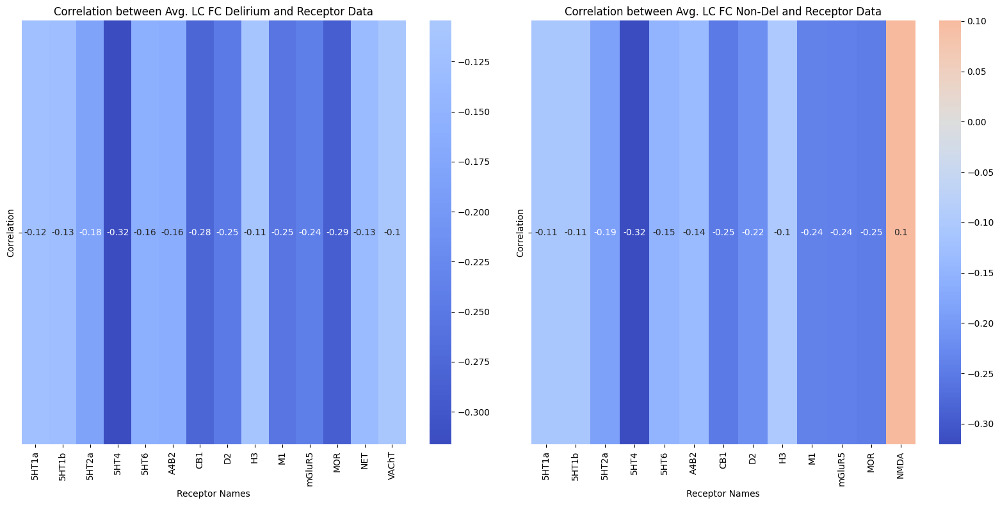

In [174]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
# Define the name suffix for the receptor data
name_suffix ='LC FC'
data1 = np.mean(avg_fc_lc_del, axis=0)
data2 = np.mean(avg_fc_lc_nondel, axis=0)

#data1 = avg_fc_lc_del
#data2 = avg_fc_lc_nondel

# Calculate the correlation between avg_pc_del and receptor_data
[correlations_del,pvalue_del]=stats.permtest_pearsonr(receptor_data,data1, n_perm=1000)

# Calculate the correlation between avg nondel LC FC and receptor_data
[correlations_nondel,pvalue_nondel]=stats.permtest_pearsonr(receptor_data,data2, n_perm=1000)

# Create DataFrames for easier plotting
# Create DataFrames for easier plotting
correlation_df_del_fc = pd.DataFrame({
    'Receptor': receptor_names,
    'Correlation': correlations_del,
    'P-Value Permuted': pvalue_del
})

correlation_df_nondel_fc = pd.DataFrame({
    'Receptor': receptor_names,
    'Correlation': correlations_nondel,
    'P-Value Permuted': pvalue_nondel
})

# Define the significance threshold
significance_threshold = 0.05

# Filter the DataFrame for significant results
significant_results_del = correlation_df_del_fc[correlation_df_del_fc['P-Value Permuted'] < significance_threshold]
significant_results_nondel = correlation_df_nondel_fc[correlation_df_nondel_fc['P-Value Permuted'] < significance_threshold]
# Plot the correlation matrices side by side
# Create dynamic titles
title_del = f'Correlation between Avg. {name_suffix} Delirium and Receptor Data'
title_nondel = f'Correlation between Avg. {name_suffix} Non-Del and Receptor Data'

# Ensure significant_results_del and significant_results_nondel contain numeric data for plotting
if 'Correlation' in significant_results_del.columns and 'Correlation' in significant_results_nondel.columns:
    correlation_values_del = significant_results_del[['Correlation']].astype(float).T  # Transpose for heatmap
    correlation_values_nondel = significant_results_nondel[['Correlation']].astype(float).T  # Transpose for heatmap
else:
    raise ValueError("One of the significant_results DataFrames does not contain a 'Correlation' column.")

# Create subplots for side-by-side heatmaps
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Heatmap for significant_results_del
sns.heatmap(correlation_values_del, annot=True, cmap='coolwarm', center=0,
            xticklabels=significant_results_del['Receptor'].values, ax=axes[0])
axes[0].set_title(title_del)
axes[0].set_xlabel('Receptor Names')


# Heatmap for significant_results_nondel
sns.heatmap(correlation_values_nondel, annot=True, cmap='coolwarm', center=0,
            xticklabels=significant_results_nondel['Receptor'].values, ax=axes[1])
axes[1].set_title(title_nondel)
axes[1].set_xlabel('Receptor Names')


plt.tight_layout()
plt.show()


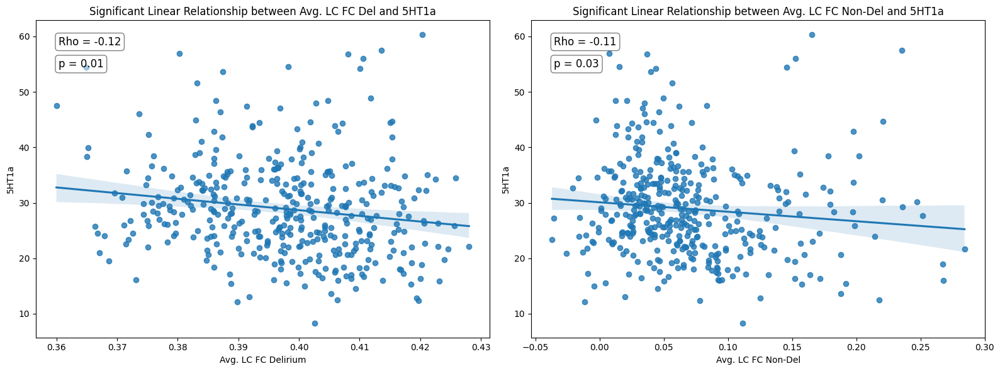

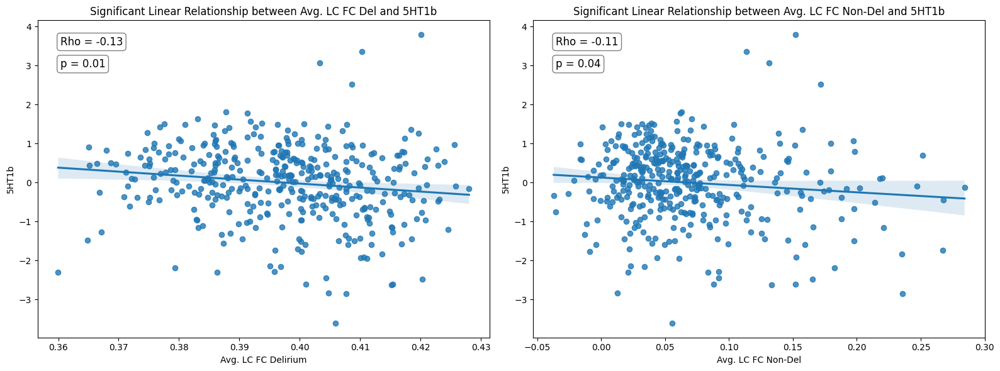

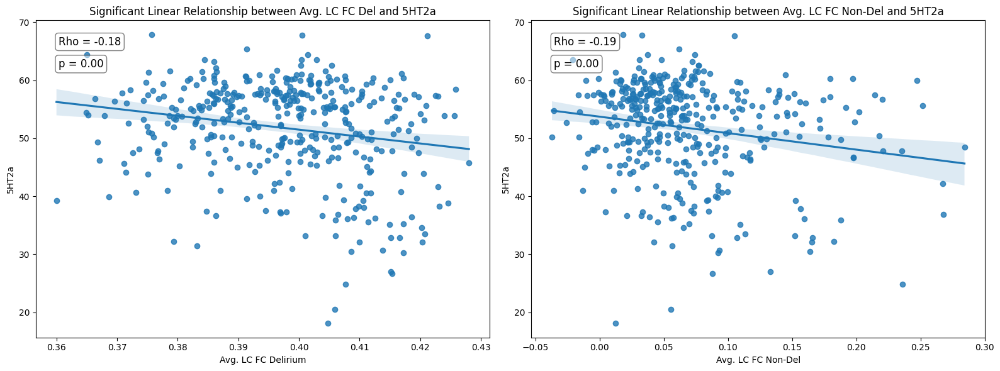

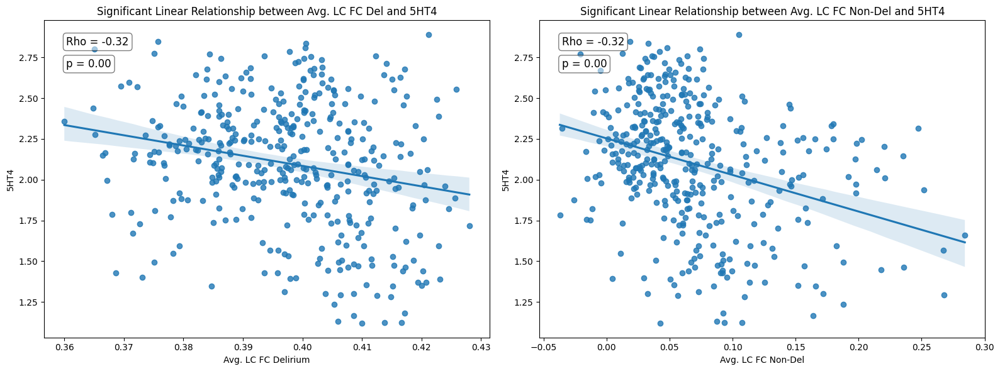

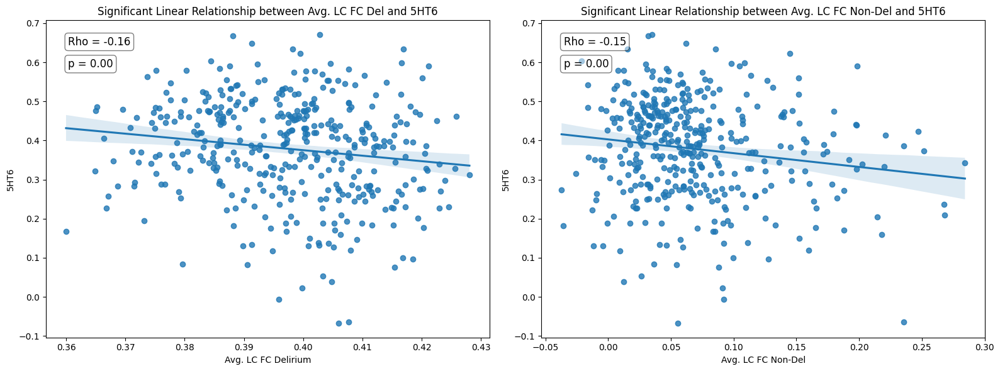

...

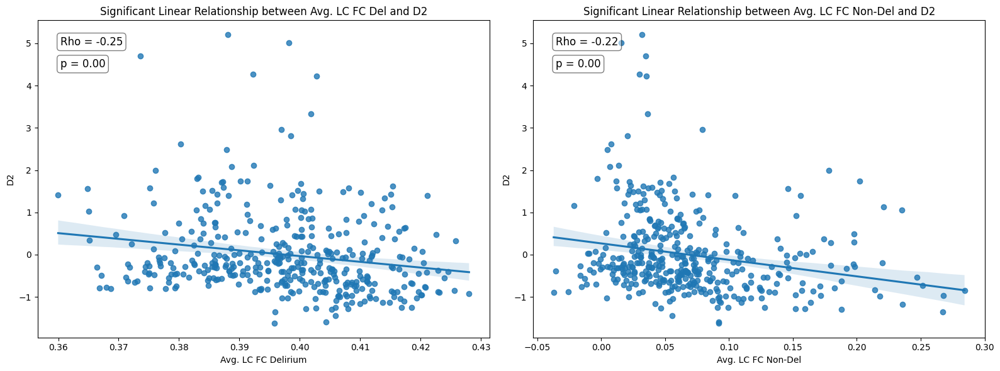

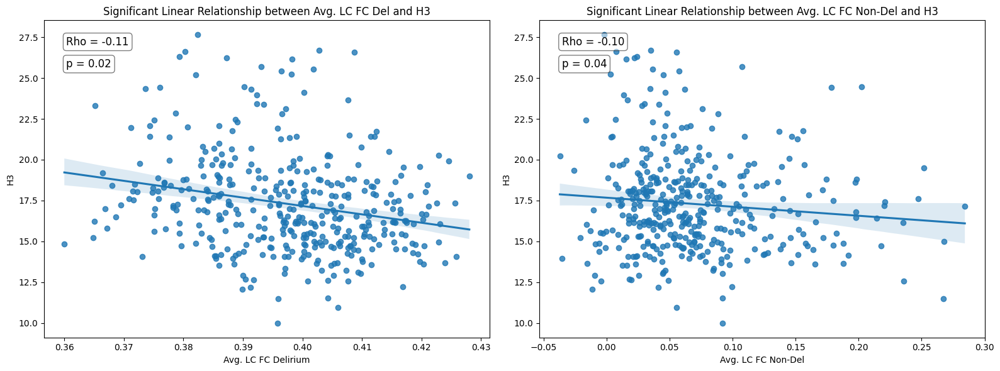

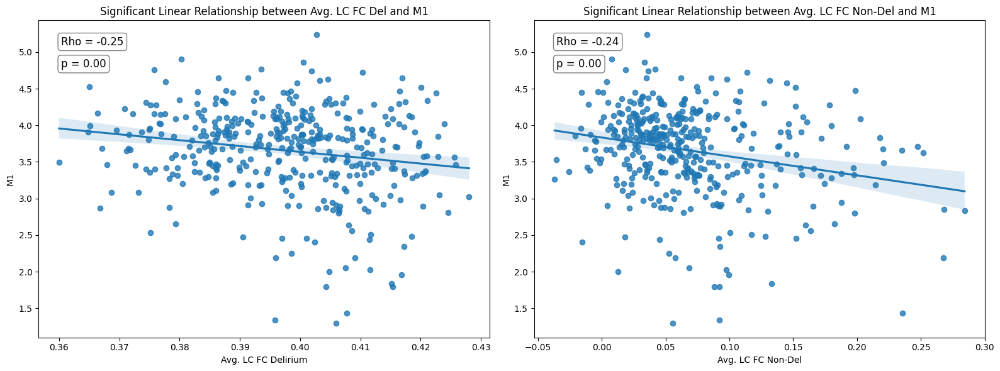

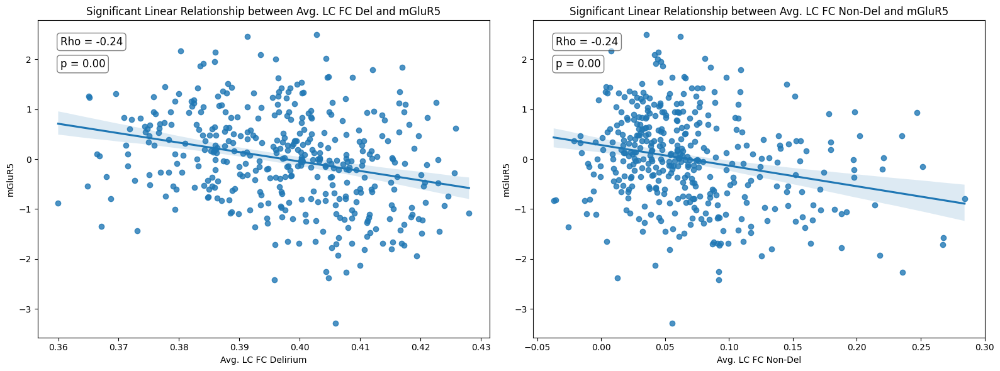

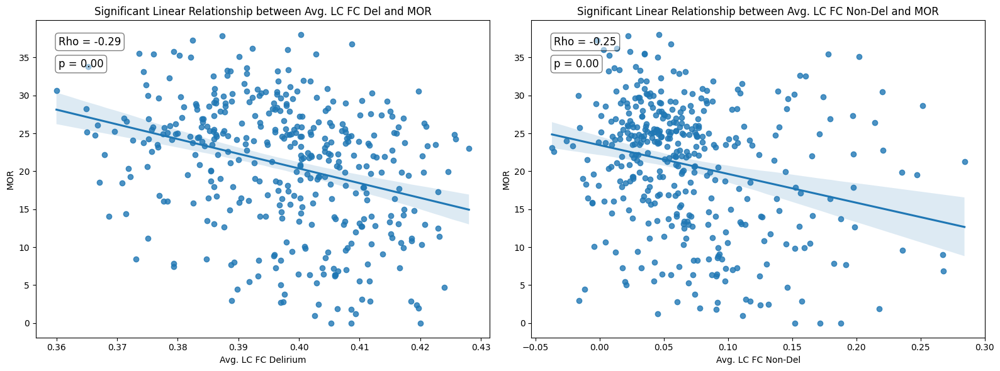

Skipping receptor NMDA for Avg. PC Del as it is not significant.


In [175]:
# Plot the linear relationships side by side for each receptor
# Iterate over significant receptors for both del and nondel
for receptor in significant_results_nondel['Receptor']:
    i = np.where(receptor_names == receptor)[0][0]  # Find the corresponding index in receptor_names
    
    # Check if receptor exists in significant_results_del
    if receptor not in significant_results_del['Receptor'].values:
        print(f"Skipping receptor {receptor} for Avg. PC Del as it is not significant.")
        continue
    
    # Create side-by-side plots
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    
    # Plot for Avg. PC Del
    sns.regplot(x=mean_pc_del.flatten(), y=receptor_data[:, i], ax=axes[0])
    axes[0].set_xlabel(f'Avg. {name_suffix} Delirium')
    axes[0].set_ylabel(receptor)
    axes[0].set_title(f'Significant Linear Relationship between Avg. {name_suffix} Del and {receptor}')
    
    # Calculate correlation for Avg. PC Del
    rho_del = significant_results_del[significant_results_del['Receptor'] == receptor]['Correlation'].values[0]
    pval_del = significant_results_del[significant_results_del['Receptor'] == receptor]['P-Value Permuted'].values[0]
    
    # Add correlation and p-value text for Avg. PC Del
    axes[0].text(0.05, 0.95, f'Rho = {rho_del:.2f}', transform=axes[0].transAxes, 
                 fontsize=12, verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
    axes[0].text(0.05, 0.88, f'p = {pval_del:.2f}', transform=axes[0].transAxes, 
                 fontsize=12, verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
    
    # Plot for Avg. PC Non-Del
    sns.regplot(x=data2.flatten(), y=receptor_data[:, i], ax=axes[1])
    axes[1].set_xlabel(f'Avg. {name_suffix} Non-Del')
    axes[1].set_ylabel(receptor)
    axes[1].set_title(f'Significant Linear Relationship between Avg. {name_suffix} Non-Del and {receptor}')
    
    # Calculate correlation for Avg. PC Non-Del
    rho_nondel = significant_results_nondel[significant_results_nondel['Receptor'] == receptor]['Correlation'].values[0]
    pval_nondel = significant_results_nondel[significant_results_nondel['Receptor'] == receptor]['P-Value Permuted'].values[0]
    
    # Add correlation and p-value text for Avg. PC Non-Del
    axes[1].text(0.05, 0.95, f'Rho = {rho_nondel:.2f}', transform=axes[1].transAxes, 
                 fontsize=12, verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
    axes[1].text(0.05, 0.88, f'p = {pval_nondel:.2f}', transform=axes[1].transAxes, 
                 fontsize=12, verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
    
    plt.tight_layout()
    plt.show()

In [ ]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# look at difference in FC for LC between del and non del
#diff_data = np.mean(avg_fc_lc_del, axis=0) - np.mean(avg_fc_lc_nondel, axis=0)
diff_data = np.mean(avg_fc_nbm_del, axis=0) - np.mean(avg_fc_nbm_nondel, axis=0)
name_suffix ='PPN FC'
# Calculate the correlation between diff in mean fc LC del - non-del and receptor_data
[correlations_diff_all,pvalue_diff_all]=stats.permtest_pearsonr(receptor_data,diff_data,n_perm=1000)
# Select specific receptors
selected_receptors = ['NET','VAChT', 'M1','A4B2']
selected_indices = [np.where(receptor_names == receptor)[0][0] for receptor in selected_receptors]
# Calculate the correlation for the selected receptors
[correlations_diff_select,pvalue_diff_select]=stats.permtest_pearsonr(receptor_data[:,selected_indices],diff_data,n_perm=1000)

# Create DataFrames for easier plotting
# Create DataFrames for easier plotting
correlation_df_diff_all = pd.DataFrame({
    'Receptor': receptor_names,
    'Correlation': correlations_diff_all,
    'P-Value Permuted': pvalue_diff_all})

correlation_df_diff_select = pd.DataFrame({
    'Receptor': selected_receptors,
    'Correlation': correlations_diff_select,
    'P-Value Permuted': pvalue_diff_select
})

# Define the significance threshold
significance_threshold = 0.05

# Filter the DataFrame for significant results
significant_results_select = correlation_df_diff_select[correlation_df_diff_select['P-Value Permuted'] < significance_threshold]


# Plot the correlation matrix
sns.heatmap(correlation_df_diff_select.set_index('Receptor').T, annot=True, cmap='coolwarm', center=0)
plt.title(f'Correlation between Avg. Diff FC {name_suffix} Del - NonDel and Selected Receptor Data')
plt.show()

# Plot the linear relationship for each selected receptor
for i, receptor in enumerate(selected_receptors):
    plt.figure(figsize=(8, 6))
    sns.regplot(x=diff_data.flatten(), y=receptor_data[:, selected_indices[i]])
    plt.xlabel('Avg. Diff FC Del - Nondel')
    plt.title(f'Linear Relationship between Avg. Diff FC {name_suffix} Del - Nondel and {receptor}')
    
        # Calculate correlation
    rho = correlation_df_diff_select[correlation_df_diff_select['Receptor'] == receptor]['Correlation'].values[0]
    pval= correlation_df_diff_select[correlation_df_diff_select['Receptor'] == receptor]['P-Value Permuted'].values[0]
    plt.text(0.05, 0.95, f'$Rho$ = {rho:.2f}', transform=plt.gca().transAxes, 
             fontsize=12, verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
    plt.text(0.05, 0.87, f'$P$ = {pval:.2f}', transform=plt.gca().transAxes, 
             fontsize=12, verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))

    plt.show()

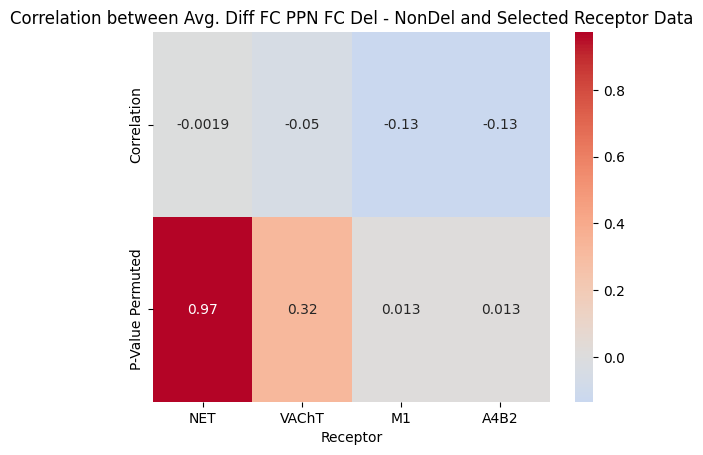

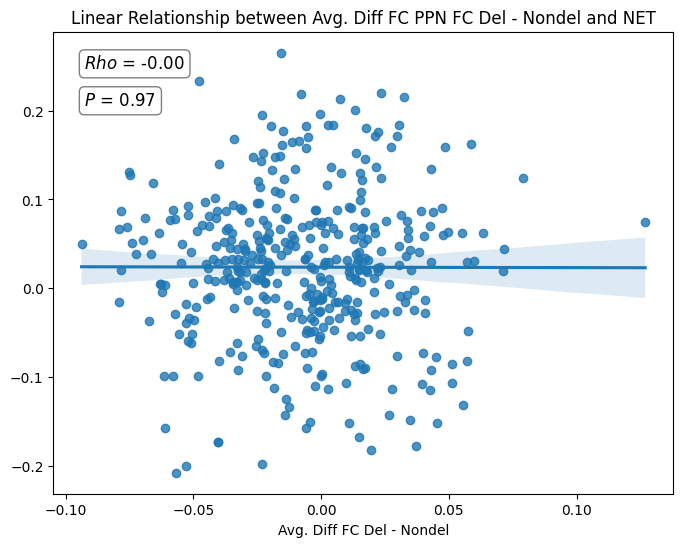

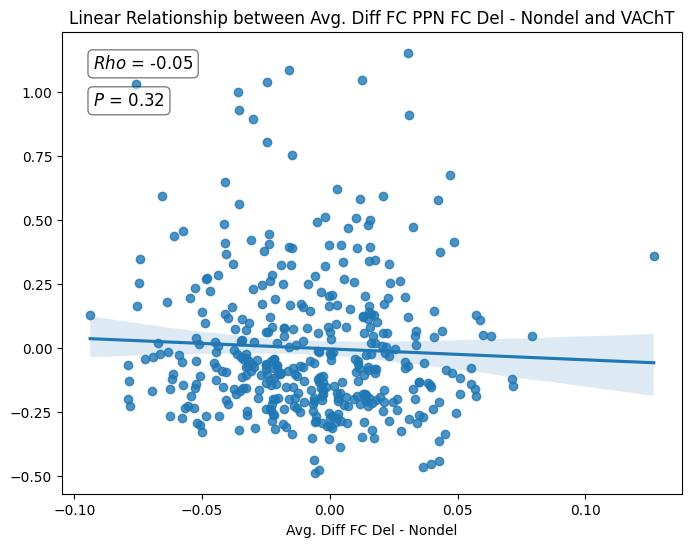

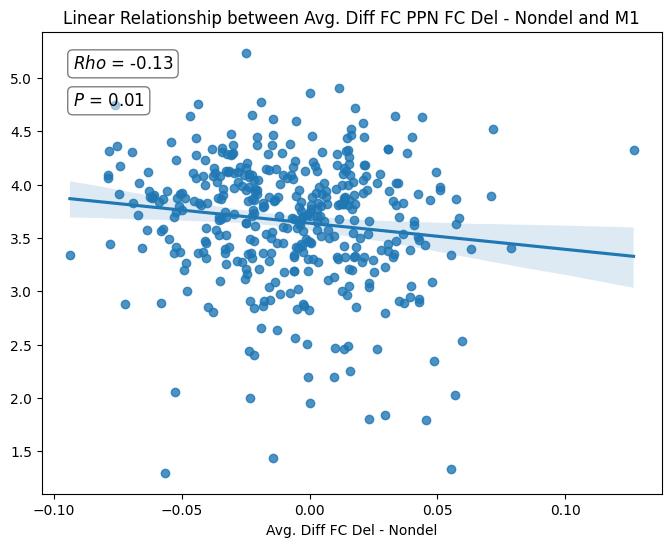

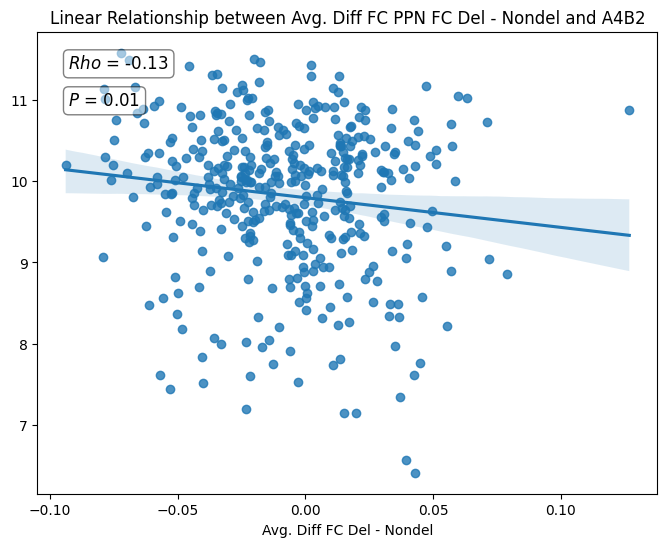

In [176]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# look at difference in FC for LC between del and non del
#diff_data = np.mean(avg_fc_lc_del, axis=0) - np.mean(avg_fc_lc_nondel, axis=0)
#diff_data = np.mean(avg_fc_nbm_del, axis=0) - np.mean(avg_fc_nbm_nondel, axis=0)
diff_data = np.mean(avg_fc_ppn_del, axis=0) - np.mean(avg_fc_ppn_nondel, axis=0)
name_suffix ='PPN FC'
# Calculate the correlation between diff in mean fc LC del - non-del and receptor_data
[correlations_diff_all,pvalue_diff_all]=stats.permtest_pearsonr(receptor_data,diff_data,n_perm=1000)
# Select specific receptors
selected_receptors = ['NET','VAChT', 'M1','A4B2']
selected_indices = [np.where(receptor_names == receptor)[0][0] for receptor in selected_receptors]
# Calculate the correlation for the selected receptors
[correlations_diff_select,pvalue_diff_select]=stats.permtest_pearsonr(receptor_data[:,selected_indices],diff_data,n_perm=1000)

# Create DataFrames for easier plotting
# Create DataFrames for easier plotting
correlation_df_diff_all = pd.DataFrame({
    'Receptor': receptor_names,
    'Correlation': correlations_diff_all,
    'P-Value Permuted': pvalue_diff_all})

correlation_df_diff_select = pd.DataFrame({
    'Receptor': selected_receptors,
    'Correlation': correlations_diff_select,
    'P-Value Permuted': pvalue_diff_select
})

# Define the significance threshold
significance_threshold = 0.05

# Filter the DataFrame for significant results
significant_results_select = correlation_df_diff_select[correlation_df_diff_select['P-Value Permuted'] < significance_threshold]


# Plot the correlation matrix
sns.heatmap(correlation_df_diff_select.set_index('Receptor').T, annot=True, cmap='coolwarm', center=0)
plt.title(f'Correlation between Avg. Diff FC {name_suffix} Del - NonDel and Selected Receptor Data')
plt.show()

# Plot the linear relationship for each selected receptor
for i, receptor in enumerate(selected_receptors):
    plt.figure(figsize=(8, 6))
    sns.regplot(x=diff_data.flatten(), y=receptor_data[:, selected_indices[i]])
    plt.xlabel('Avg. Diff FC Del - Nondel')
    plt.title(f'Linear Relationship between Avg. Diff FC {name_suffix} Del - Nondel and {receptor}')
    
        # Calculate correlation
    rho = correlation_df_diff_select[correlation_df_diff_select['Receptor'] == receptor]['Correlation'].values[0]
    pval= correlation_df_diff_select[correlation_df_diff_select['Receptor'] == receptor]['P-Value Permuted'].values[0]
    plt.text(0.05, 0.95, f'$Rho$ = {rho:.2f}', transform=plt.gca().transAxes, 
             fontsize=12, verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
    plt.text(0.05, 0.87, f'$P$ = {pval:.2f}', transform=plt.gca().transAxes, 
             fontsize=12, verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))

    plt.show()

In [177]:

#just get the significantly different regions for LC
#load in the sig. diff FC Delirium - Health for LC, NBM, PPN
sig_diff_lc_fc = np.genfromtxt(path + '/sig_diff_lc_fc.csv', delimiter=',')
sig_diff_nbm_fc = np.genfromtxt(path + '/sig_diff_nbm_fc.csv', delimiter=',')
sig_diff_ppn_fc = np.genfromtxt(path + '/sig_diff_ppn_fc.csv', delimiter=',')

In [131]:
print(sig_diff_lc_fc.shape)

(400,)


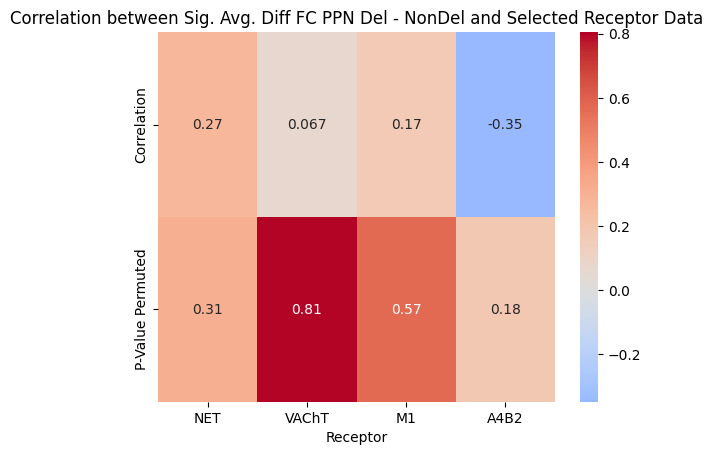

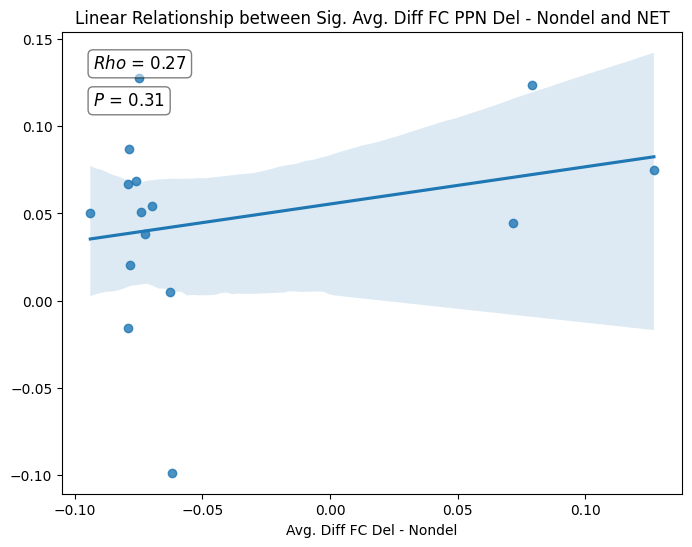

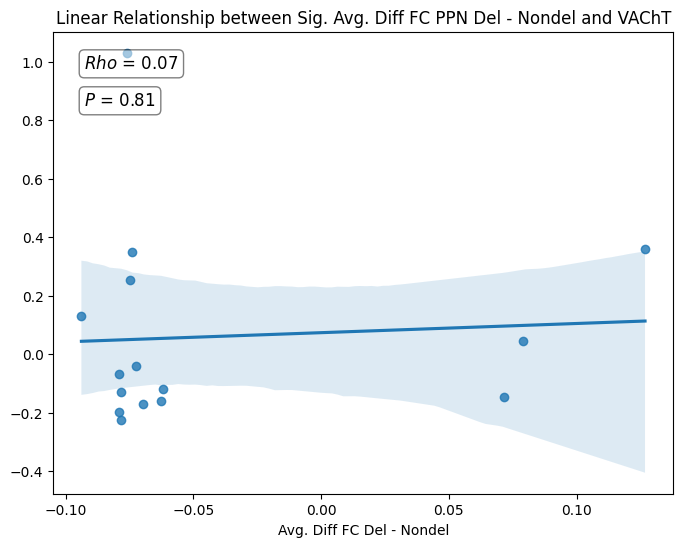

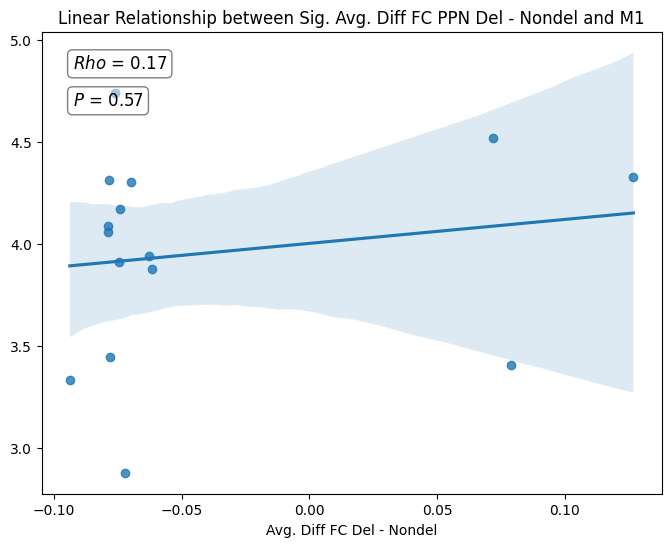

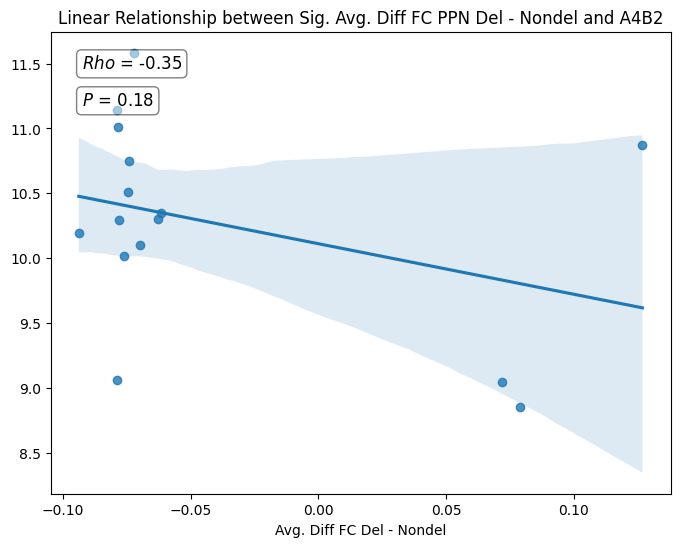

In [180]:
# look at only significantly different FC for LC between del and non del
data3 = sig_diff_ppn_fc
name_suffix="PPN"
# Filter out regions with zero values in data3
non_zero_indices = np.where(data3 != 0)[0]
filtered_receptor_data = receptor_data[non_zero_indices, :]
filtered_data3 = data3[non_zero_indices]

# Select specific receptors
selected_receptors = ['NET', 'VAChT', 'M1', 'A4B2']
selected_indices = [np.where(receptor_names == receptor)[0][0] for receptor in selected_receptors]

# Calculate the correlation for the selected receptors
#correlations_selected = np.corrcoef(filtered_receptor_data[:, selected_indices].T, filtered_data3.T)

[correlations_selected,pvalue_selected]=stats.permtest_pearsonr(filtered_receptor_data[:, selected_indices],filtered_data3,n_perm=1000)
# Extract the relevant part of the correlation matrix
correlation_df_selected = pd.DataFrame({
    'Receptor': selected_receptors,
    'Correlation': correlations_selected,
    'P-Value Permuted':pvalue_selected})

# Create a DataFrame for easier plotting
#correlation_df_selected = pd.DataFrame(correlations_selected, index=selected_receptors, columns=['Correlation'])

# Plot the correlation matrix
# Define the significance threshold
significance_threshold = 0.05

# Filter the DataFrame for significant results
significant_results_select = correlation_df_selected[correlation_df_selected['P-Value Permuted'] < significance_threshold]


# Plot the correlation matrix
sns.heatmap(correlation_df_selected.set_index('Receptor').T, annot=True, cmap='coolwarm', center=0)
plt.title(f'Correlation between Sig. Avg. Diff FC {name_suffix} Del - NonDel and Selected Receptor Data')
plt.show()

# Plot the linear relationship for each selected receptor
for i, receptor in enumerate(selected_receptors):
    # Filter out rows where x or y values are 0
    x_data = data3.flatten()
    y_data = receptor_data[:, selected_indices[i]]
    mask = (x_data != 0) & (y_data != 0)  # Create a mask to exclude zeros
    x_filtered = x_data[mask]
    y_filtered = y_data[mask]
    
    # Plot the filtered data
    plt.figure(figsize=(8, 6))
    sns.regplot(x=x_filtered, y=y_filtered)
    plt.xlabel('Avg. Diff FC Del - Nondel')
    plt.title(f'Linear Relationship between Sig. Avg. Diff FC {name_suffix} Del - Nondel and {receptor}')
    
    # Calculate correlation
    rho = correlation_df_selected[correlation_df_selected['Receptor'] == receptor]['Correlation'].values[0]
    pval = correlation_df_selected[correlation_df_selected['Receptor'] == receptor]['P-Value Permuted'].values[0]
    
    # Add correlation and p-value text
    plt.text(0.05, 0.95, f'$Rho$ = {rho:.2f}', transform=plt.gca().transAxes, 
             fontsize=12, verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
    plt.text(0.05, 0.87, f'$P$ = {pval:.2f}', transform=plt.gca().transAxes, 
             fontsize=12, verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))

    plt.show()


In [32]:
# look at only significantly different FC for LC between del and non del - so few regions that are significantly different
data3 = sig_diff_nbm_fc

# Filter out regions with zero values in data3
non_zero_indices = np.where(data3 != 0)[0]
filtered_receptor_data = receptor_data[non_zero_indices, :]
filtered_data3 = data3[non_zero_indices]

# Select specific receptors
selected_receptors = ['NET', 'VAChT', 'M1', 'A4B2']
selected_indices = [np.where(receptor_names == receptor)[0][0] for receptor in selected_receptors]

# Calculate the correlation for the selected receptors
correlations_selected = np.corrcoef(filtered_receptor_data[:, selected_indices].T, filtered_data3.T)

# Extract the relevant part of the correlation matrix
correlations_selected = correlations_selected[:-1, -1]

# Create a DataFrame for easier plotting
correlation_df_selected = pd.DataFrame(correlations_selected, index=selected_receptors, columns=['Correlation'])

# Plot the correlation matrix
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_df_selected.T, annot=True, cmap='coolwarm', center=0)
plt.title('Correlation between Sig Avg. Diff FC nbM Del - NonDel and Selected Receptor Data')
plt.show()

NameError: name 'sig_diff_nbm_fc' is not defined

In [ ]:
# Plot the bar plot
plt.figure(figsize=(12, 8))
sns.barplot(x=selected_receptors, y=correlation_df_selected['Correlation'])
plt.title('Mean Receptor Distribution for Regions with Non-Zero Values in data3')
plt.xticks(rotation=90)
plt.show()

## Load in the LDA coefficient Results

see if there's a relationship between the LDA coefficient projected dFC results and the receptor distributions

In [24]:
# load in the relevant data
path = '/Users/ntaylor/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/Postdoc_Rob/Analysis/Graph_Theory/schaef_400/csf_regress_redo'
#path2 = '/Users/ntaylor/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/Postdoc_Rob/Analysis/Graph_Theory/schaef_400/PCA_LDA/Python'
# load the receptor LDA coefficients
#LDA_coeffs_weights_select_time_delirium_avg_dFC_mtd_nbm.csv
#lda_coefficient_weights_overtime_mtd_ppn.csv
lda_coeff = np.genfromtxt(path + '/LDA_coeffs_weights_select_time_delirium_avg_dFC_mtd_nbm.csv', delimiter=',', skip_header=1)
#lda_coeff = np.genfromtxt(path + '/lda_coefficient_weights_overtime_mtd_ppn.csv', delimiter=',', skip_header=1)
# name suffix
name_suffix='nbM avg delta dFC LDA'

print(lda_coeff.shape)

(502,)


In [25]:
# relationship between receptor data and LDA coefficients
# spin permutation
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr
from netneurotools import stats

# Calculate the observed correlation
#observed_correlations = [pearsonr(analyse_data, receptor_data[:, i])[0] for i in range(receptor_data.shape[1])]

analyse_data = lda_coeff[0:400]  # Use the second column of lda_coeff as analyse_data
[corr,pvalue]=stats.permtest_pearsonr(analyse_data,receptor_data, n_perm=1000)

# Create a DataFrame for easier plotting
correlation_permuted = pd.DataFrame({
    'Receptor': receptor_names,
    'Correlation': corr,
    'P-Value Permuted': pvalue
})

# Define the significance threshold
significance_threshold = 0.05

# Filter the DataFrame for significant results
significant_results = correlation_permuted[correlation_permuted['P-Value Permuted'] < significance_threshold]

# Print the filtered DataFrame
print(correlation_permuted)
#print(significant_results)

   Receptor  Correlation  P-Value Permuted
0     5HT1a    -0.134000          0.004995
1     5HT1b    -0.022143          0.650350
2     5HT2a    -0.045125          0.377622
3      5HT4    -0.121236          0.014985
4      5HT6    -0.106422          0.027972
5      5HTT    -0.152391          0.002997
6      A4B2    -0.060973          0.212787
7       CB1    -0.120656          0.023976
8        D1    -0.083509          0.090909
9        D2    -0.206497          0.000999
10      DAT    -0.097319          0.046953
11    GABAa     0.041517          0.416583
12       H3    -0.109143          0.034965
13       M1    -0.196115          0.000999
14   mGluR5    -0.122958          0.010989
15      MOR    -0.154521          0.004995
16      NET    -0.063126          0.216783
17     NMDA    -0.066042          0.163836
18    VAChT    -0.142318          0.004995


Create the correlation plots

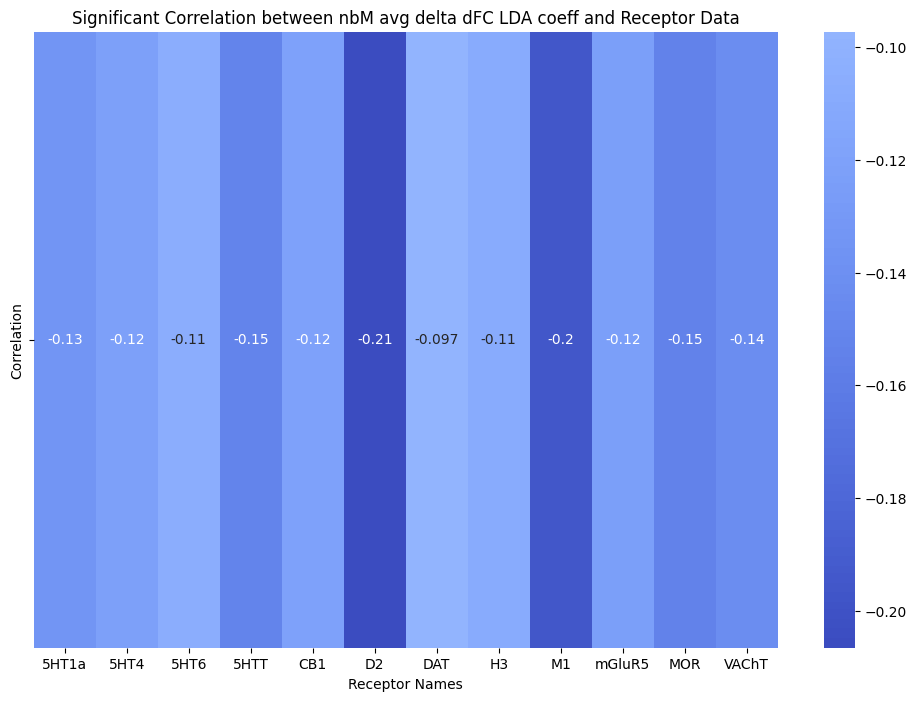

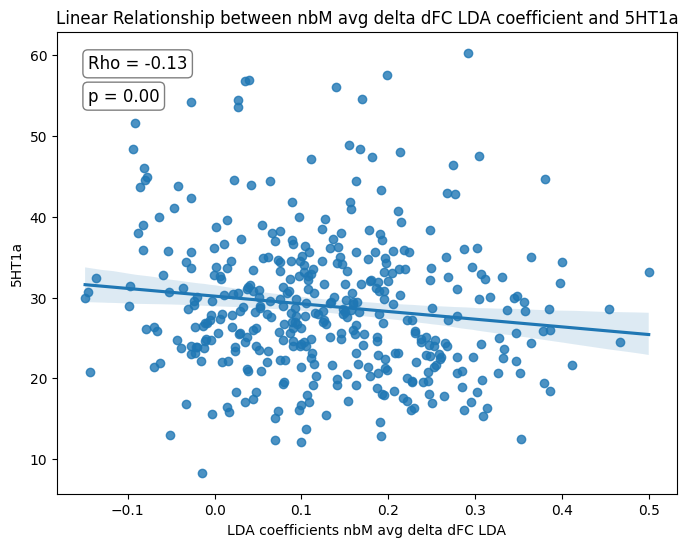

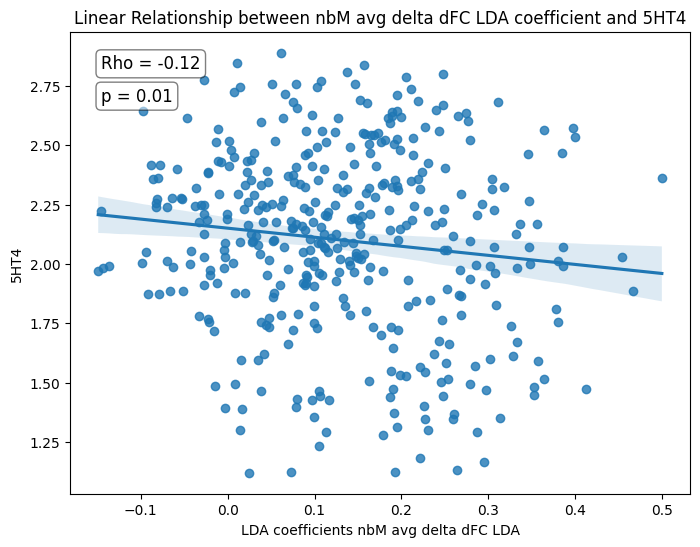

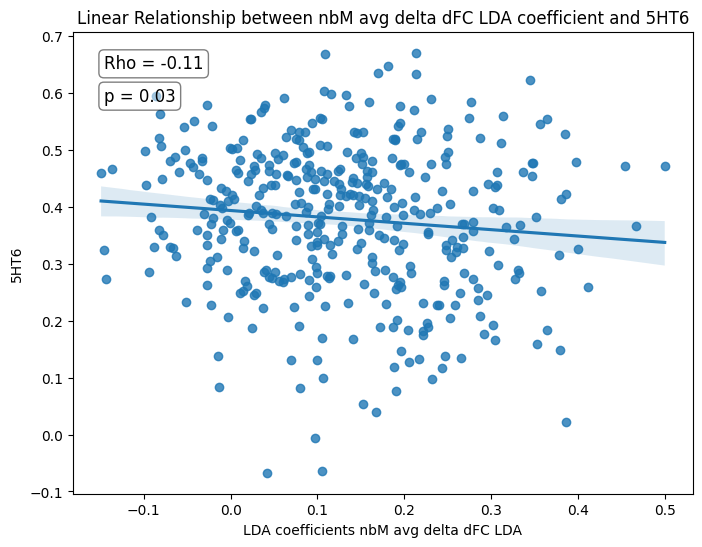

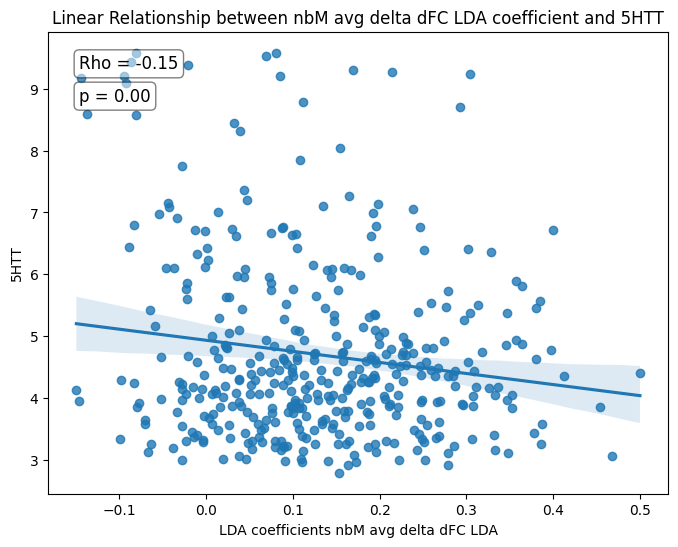

...

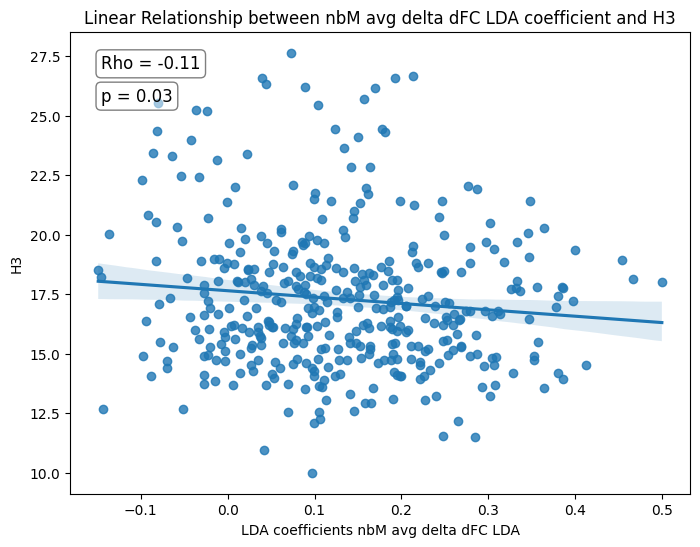

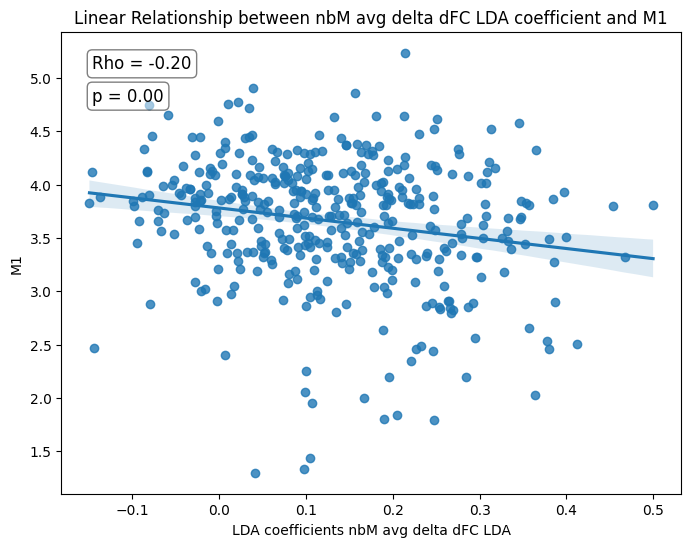

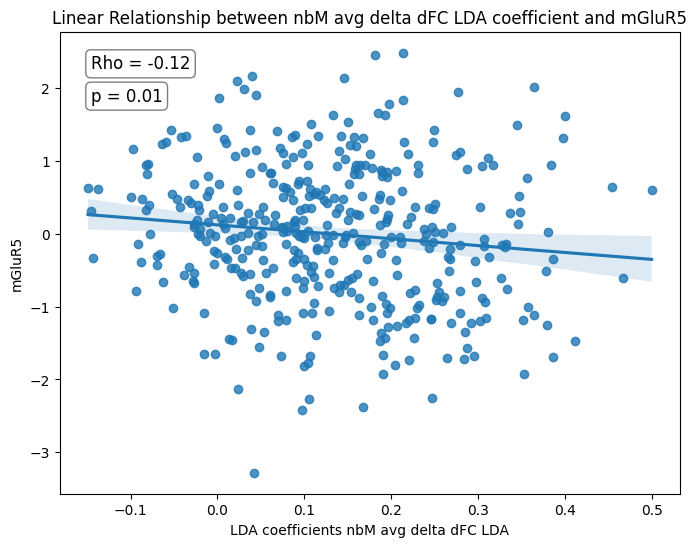

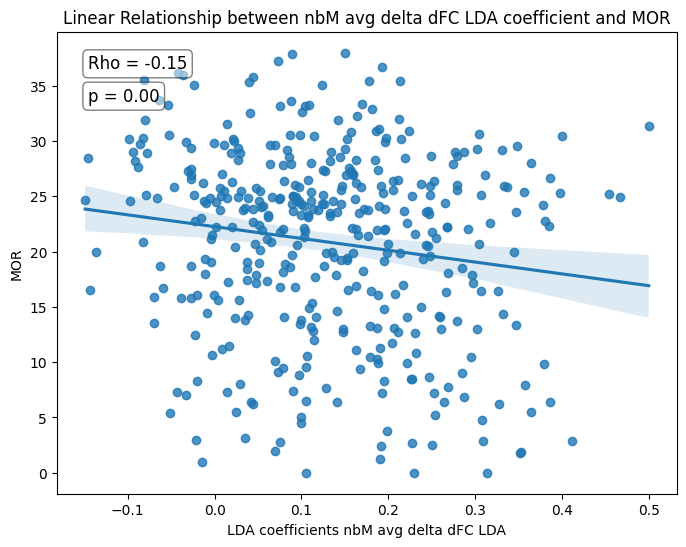

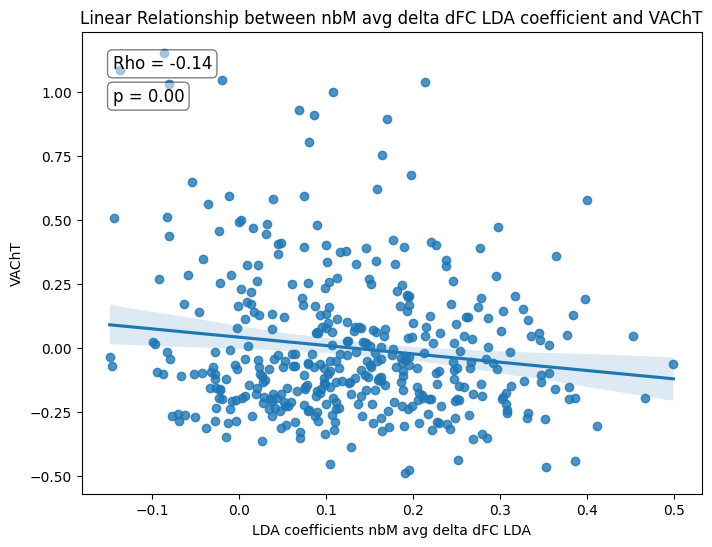

In [26]:
# Ensure significant_results contains numeric data for plotting
if 'Correlation' in significant_results.columns:
    correlation_values = significant_results[['Correlation']].astype(float)
else:
    raise ValueError("significant_results does not contain a 'Correlation' column.")

# Plot the correlation matrix
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_values.T, annot=True, cmap='coolwarm', center=0, xticklabels=significant_results['Receptor'])
plt.title(f'Significant Correlation between {name_suffix} coeff and Receptor Data')
plt.xlabel('Receptor Names')  # Add x-axis label
plt.show()

# Iterate over significant receptors
for receptor in significant_results.Receptor:  # Use the index of significant_results (receptor names)
    i = np.where(receptor_names == receptor)[0][0]  # Find the corresponding index in receptor_names
    
    plt.figure(figsize=(8, 6))
    sns.regplot(x=analyse_data.flatten(), y=receptor_data[:, i])
    plt.xlabel(f'LDA coefficients {name_suffix}')
    plt.ylabel(receptor)
    plt.title(f'Linear Relationship between {name_suffix} coefficient and {receptor}')
    
    # Calculate correlation
    rho = significant_results[significant_results['Receptor'] == receptor]['Correlation'].values[0]
    pval = significant_results[significant_results['Receptor'] == receptor]['P-Value Permuted'].values[0]
    
    plt.text(0.05, 0.95, f'Rho = {rho:.2f}', transform=plt.gca().transAxes, 
             fontsize=12, verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
    plt.text(0.05, 0.88, f'p = {pval:.2f}', transform=plt.gca().transAxes, 
             fontsize=12, verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
    
    plt.show()

In [ ]:
from pathlib import Path

# Define the annotations directory
annotations_dir = Path('/Users/ntaylor/neuromaps-data/annotations')

# Create the directory if it doesn't exist
annotations_dir.mkdir(parents=True, exist_ok=True)
print(f"Annotations directory created at: {annotations_dir}")

Annotations directory created at: /Users/ntaylor/neuromaps-data/annotations


## Receptors of Interest Analysis
Select these receptors based upon relevant receptors that have closer or similar overlapping ages in the dataset

- **aghourian2017-feobv-MNI152-1mm**
    - PET tracer binding (SUVR) to VAChT (acetylcholine transporter)
        
        **Demographics**: N = 18, Age = 66.8 +/- 6.8
        
        *{‘source’: ‘aghourian2017’, ‘desc’: ‘feobv’, ‘space’: ‘MNI152’, ‘res’: ‘1mm’}*
        
- bebard2019-feobv-MNI152-1mm
    - PET tracer binding (SUVR) to VAChT (acetylcholine transporter)
        
        **Demographics**: N = 5, Age = 68.3 +/- 3.1
        
        *{‘source’: ‘bedard2019’, ‘desc’: ‘feobv’, ‘space’: ‘MNI152’, ‘res’: ‘1mm’}*
        
- spreng-feobv-MNI152-1mm
    - PET tracer binding (SUVR) to VAChT (acetylcholine transporter)
        
        **Demographics**: N = 3, Age = 66.6 +/- 0.94
        
        *{‘source’: ‘spreng’, ‘desc’: ‘feobv’, ‘space’: ‘MNI152’, ‘res’: ‘1mm’}*
        
- M1 receptor: **naganawa2020-lsn3172176-MNI152-1mm**
    - PET tracer binding (BPnd) to M1 (acetylcholine receptor)
    
    **Demographics**: N = 24, Age = 40.45 +/- 11.71
    
- **NET receptor: ding2010-mrb-MNI152-1mm**
    - PET tracer binding (BPnd) to NET (norepinephrine transporter)
        
        **Demographics**: N = 77, Age = 33.4 +/- 9.17
        
- **hesse2017-methylreboxetine-MNI152-3mm**
    - PET tracer binding (BPnd) to NET (norepinephrine transporter)
        
        **Demographics**: N = 10, Age = 33.3 (mean)

- **fazio2016-madam-MNI152-3mm**
    - PET tracer binding (BPnd) to 5-HTT (serotonin transporter)
    
    **Demographics**: N = 10, Age = 51-67
    
- **dukart2018-fpcit-MNI152-3mm**
    - SPECT tracer binding (SUVR) to DAT (dopamine transporter)
    
    **Demographics**: N = 174, Age = 61 +/- 11

- **rosaneto-abp688-MNI152-1mm**
    - *{‘source’: ‘rosaneto’, ‘desc’: ‘abp688’, ‘space’: ‘MNI152’, ‘res’: ‘1mm’}*
    
    **Full description**
    
    PET tracer binding (BPnd) to mGluR5 (glutamate receptor)
    
    **Demographics**: N = 22, Age = 67.9 +/- 9.6

In [19]:
# load in relevant data

import numpy as np
from netneurotools import datasets as nntdata
#from netneurotools import plotting
from matplotlib.colors import ListedColormap
from scipy.stats import zscore
from nilearn.datasets import fetch_atlas_schaefer_2018

path = '/Users/ntaylor/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/PhD/Code/neuromaps'

scale = 'scale400'

schaefer = fetch_atlas_schaefer_2018(n_rois=400)
nnodes = len(schaefer['labels'])

# concatenate the receptors based of interest (relative similar age group)

receptors_csv = [#path+'/PET_parcellated/'+scale+'/5HT1a_way_hc36_savli.csv',
                 #path+'/PET_parcellated/'+scale+'/5HT1b_p943_hc22_savli.csv',
                 #path+'/PET_parcellated/'+scale+'/5HT1b_p943_hc65_gallezot.csv',
                 #path+'/PET_parcellated/'+scale+'/5HT2a_cimbi_hc29_beliveau.csv',
                 #path+'/PET_parcellated/'+scale+'/5HT4_sb20_hc59_beliveau.csv',
                 #path+'/PET_parcellated/'+scale+'/5HT6_gsk_hc30_radhakrishnan.csv',
                 path+'/PET_parcellated/'+scale+'/5HTT_dasb_hc100_beliveau.csv',
                 path+'/PET_parcellated/'+scale+'/A4B2_flubatine_hc30_hillmer.csv',
                 #path+'/PET_parcellated/'+scale+'/CB1_omar_hc77_normandin.csv',
                 #path+'/PET_parcellated/'+scale+'/D1_SCH23390_hc13_kaller.csv',
                 #path+'/PET_parcellated/'+scale+'/D2_flb457_hc37_smith.csv',
                 #path+'/PET_parcellated/'+scale+'/D2_fallypride_hc49_jaworska.csv',
                 path+'/PET_parcellated/'+scale+'/DAT_fpcit_hc174_dukart_spect.csv',
                 #path+'/PET_parcellated/'+scale+'/GABAa-bz_flumazenil_hc16_norgaard.csv',
                 #path+'/PET_parcellated/'+scale+'/H3_cban_hc8_gallezot.csv', 
                 path+'/PET_parcellated/'+scale+'/M1_lsn_hc24_naganawa.csv',
                 path+'/PET_parcellated/'+scale+'/mGluR5_abp_hc22_rosaneto.csv',
                 #path+'/PET_parcellated/'+scale+'/mGluR5_abp_hc28_dubois.csv',
                 #path+'/PET_parcellated/'+scale+'/mGluR5_abp_hc73_smart.csv',
                 #path+'/PET_parcellated/'+scale+'/MU_carfentanil_hc204_kantonen.csv',
                 path+'/PET_parcellated/'+scale+'/NAT_MRB_hc77_ding.csv',
                 #path+'/PET_parcellated/'+scale+'/NMDA_ge179_hc29_galovic.csv',
                 path+'/PET_parcellated/'+scale+'/VAChT_feobv_hc3_spreng.csv',
                 #path+'/PET_parcellated/'+scale+'/VAChT_feobv_hc4_tuominen.csv',
                 path+'/PET_parcellated/'+scale+'/VAChT_feobv_hc5_bedard_sum.csv',
                 path+'/PET_parcellated/'+scale+'/VAChT_feobv_hc18_aghourian_sum.csv']

# combine all the receptors (including repeats)
r2 = np.zeros([nnodes, len(receptors_csv)])
for i in range(len(receptors_csv)):
    r2[:, i] = np.genfromtxt(receptors_csv[i], delimiter=',')

receptor_names2 = np.array(["5HTT", "A4B2", "DAT", "M1", "mGluR5","NET", "VAChT"])
#np.save(path+'/receptor_names_pet.npy', receptor_names)


[get_dataset_dir] Dataset found in /Users/ntaylor/nilearn_data/schaefer_2018

In [20]:
# make final region x receptor matrix
receptor_data2 = np.zeros([nnodes, len(receptor_names2)])  # receptor_names2 is defined in cell 54
receptor_data2[:, 0:6] = zscore(r2[:, 0:6], axis=0)  # z-score the first 6 receptors
# last 3 VAChT receptor needs to be averaged
# weighted average of VAChT FEOBV
receptor_data2[:, 6] = (zscore(r2[:, 6]) * 3 + zscore(r2[:, 7]) + zscore(r2[:, 8])) / \
                      (3 + 5 + 18)

## Relationship between the receptor distribution and Participation coefficient

## Relationship with Abagen gene expression

In [29]:
import abagen

In [21]:
import abagen
from nilearn.datasets import fetch_atlas_schaefer_2018
import pandas as pd

# 1. Fetch Schaefer 400 (2mm) atlas
atlas = fetch_atlas_schaefer_2018(n_rois=400, resolution_mm=2)
atlas_img = atlas['maps']
atlas_labels = [label.decode('utf-8') if isinstance(label, bytes) else str(label) for label in atlas['labels']]

# 2. Define acetylcholine receptor genes (example list, update as needed)
ach_genes = [
    'CHRNA4', 'CHRNA7', 'CHRNB2',  # Nicotinic receptor subunits
    'CHRM1', 'CHRM2', 'CHRM3', 'CHRM4', 'CHRM5'  # Muscarinic receptor subtypes
]

# 3. Get gene expression data for the Schaefer 400 parcellation
expression = abagen.get_expression_data( 
    atlas_img,
    atlas_labels,
    exact=True  # Ensures only matching labels are used
)

# 4. Filter for acetylcholine receptor genes
ach_expression = expression.loc[:, expression.columns.intersection(ach_genes)]

# 5. ach_expression now contains region x gene expression for your genes of interest
print(ach_expression.head())

[get_dataset_dir] Dataset found in /Users/ntaylor/nilearn_data/schaefer_2018

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/abagen/allen.py:369: FutureWarning: The exact parameter will be deprecated in an upcoming release. Use the `missing` parameter instead. See documentation for more details.
  warnings.warn('The exact parameter will be deprecated in an upcoming '
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/nibabel/affines.py:97: RuntimeWarning: divide by zero encountered in matmul
  pts = pts @ rzs.T + trans[None, :]
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/nibabel/affines.py:97: RuntimeWarning: overflow encountered in matmul
  pts = pts @ rzs.T + trans[None, :]
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/nibabel/affines.py:97: RuntimeWarning: invalid value encountered in matmul
  pts = pts @ rzs.T + trans[None, :]


TypeError: Provided `atlas_info` must be a filepath or pandas.DataFrame. Please confirm inputs and try again.

In [22]:
# Replace with your actual file path
file_path = '/Users/ntaylor/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/Postdoc_Rob/code/Gene_related_expression/AHBA_GeneExpression_Schaefer400_2mm_centroid_interpolation.csv'

# Load the CSV file into a DataFrame
gene_data = pd.read_csv(file_path)

# Display the first few rows
print(gene_data.head())

       A1BG  A1BG-AS1       A2M     A2ML1   A3GALT2    A4GALT      AAAS  \
0  0.432425  0.512062  0.359879  0.488784  0.488669  0.332942  0.632703   
1  0.458783  0.351882  0.435002  0.516519  0.589147  0.495028  0.512072   
2  0.453103  0.469758  0.642876  0.377767  0.515790  0.605750  0.658644   
3  0.232751  0.314057  0.420782  0.618614  0.466583  0.343930  0.634849   
4  0.175808  0.311904  0.544261  0.451480  0.485919  0.536101  0.791855   

       AACS   AADACL3     AADAT  ...      ZW10    ZWILCH     ZWINT      ZXDA  \
0  0.434551  0.404153  0.475355  ...  0.548957  0.498760  0.342487  0.572717   
1  0.396994  0.610691  0.398535  ...  0.405837  0.486772  0.273357  0.322175   
2  0.479796  0.464347  0.437466  ...  0.453452  0.595875  0.376794  0.393782   
3  0.367551  0.534729  0.569125  ...  0.583299  0.455220  0.489027  0.547408   
4  0.497735  0.300238  0.616301  ...  0.552966  0.478688  0.563668  0.647543   

       ZXDB      ZXDC    ZYG11B       ZYX     ZZEF1      ZZZ3  
0  0

## Looking at specifically genes related to Acetylcholine
Create a list of relevant gene symbols

Receptors:
Nicotinic: CHRNA1-7, CHRNB1-4, etc.
Muscarinic: CHRM1-5
Neurotransmission (examples):
Synthesis: CHAT (choline acetyltransferase)
Transport: SLC18A3 (vesicular acetylcholine transporter, VAChT)
Degradation: ACHE (acetylcholinesterase), BCHE (butyrylcholinesterase)
Filter your DataFrame for these genes
Example code:


In [30]:
from scipy.stats import zscore
ach_genes = [
    # Nicotinic receptor subunits
    'CHRNA1', 'CHRNA2', 'CHRNA3', 'CHRNA4', 'CHRNA5', 'CHRNA6', 'CHRNA7',
    'CHRNB1', 'CHRNB2', 'CHRNB3', 'CHRNB4',
    # Muscarinic receptor subtypes
    'CHRM1', 'CHRM2', 'CHRM3', 'CHRM4', 'CHRM5',
    # Synthesis
    'CHAT',
    # Vesicular transporter
    'SLC18A3','SLC44A2', 'SLC44A5','SLC5A7','SLC44A1',
    # Degradation
    'ACHE', 'BCHE'
]

# Filter for columns matching these genes
ach_gene_data = gene_data.loc[:, gene_data.columns.intersection(ach_genes)]
# need to z-score the data
ach_gene_data= ach_gene_data.apply(zscore, axis=0)

# Show the first few rows
print(ach_gene_data.head())

       ACHE      BCHE      CHAT     CHRM1     CHRM2     CHRM3     CHRM4  \
0 -0.111218 -0.373741  0.086992 -1.338145 -0.885265 -0.974006 -0.519507   
1  0.251072 -0.979981  0.419526  0.622883 -0.889646 -0.614802 -0.629351   
2 -0.909386 -0.623216  0.232978  0.477609 -0.753869  0.178907 -0.699520   
3 -0.792562 -0.850055  0.022428 -0.366740 -0.300417 -1.209836 -0.276015   
4 -1.692064 -2.074490 -0.741341  1.060007 -0.701643 -0.370199 -1.241095   

      CHRM5    CHRNA2    CHRNA3    CHRNA4    CHRNA6    CHRNA7    CHRNB1  \
0 -0.658468 -0.309528  1.112203 -1.401396  0.238658 -0.926984  0.182839   
1  0.048323  1.024280  0.104028 -1.374879  0.436711 -0.670727 -0.551206   
2  0.788674  1.587907 -0.140340 -1.165174  0.309423  0.994219  0.361673   
3 -0.901662  0.784939  0.156861 -1.215840 -0.414354 -0.518263 -1.418859   
4 -1.889182  1.495671  0.502890 -2.044376  0.337385  0.628766 -2.337105   

     CHRNB2   SLC44A1   SLC44A2   SLC44A5  
0 -0.453085 -0.059266  0.160855 -0.275549  
1  0.99120

Relationship between Avg. nbM FC  and gene expression

In [31]:
# spin permutation
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr
from netneurotools import stats

# Calculate the observed correlation
#observed_correlations = [pearsonr(analyse_data, receptor_data[:, i])[0] for i in range(receptor_data.shape[1])]

analyse_data = mean_pc_del  # Use the second column of lda_coeff as analyse_data
[corr,pvalue]=stats.permtest_pearsonr(analyse_data,ach_gene_data, n_perm=1000)

# Create a DataFrame for easier plotting
correlation_permuted = pd.DataFrame({
    'Gene': ach_gene_data.columns,
    'Correlation': corr,
    'P-Value Permuted': pvalue
})

# Define the significance threshold
significance_threshold = 0.05

# Filter the DataFrame for significant results
significant_results = correlation_permuted[correlation_permuted['P-Value Permuted'] < significance_threshold]

# Print the filtered DataFrame
print(correlation_permuted)
#print(significant_results)

       Gene  Correlation  P-Value Permuted
0      ACHE    -0.069760          0.153846
1      BCHE    -0.304792          0.000999
2      CHAT     0.043320          0.385614
3     CHRM1     0.058910          0.244755
4     CHRM2    -0.018380          0.715285
5     CHRM3    -0.078542          0.120879
6     CHRM4    -0.172153          0.000999
7     CHRM5    -0.002663          0.965035
8    CHRNA2     0.385026          0.000999
9    CHRNA3    -0.303180          0.000999
10   CHRNA4    -0.094917          0.065934
11   CHRNA6    -0.110889          0.022977
12   CHRNA7    -0.068223          0.175824
13   CHRNB1    -0.313542          0.000999
14   CHRNB2    -0.000992          0.980020
15  SLC44A1     0.004019          0.949051
16  SLC44A2    -0.282899          0.000999
17  SLC44A5     0.410007          0.000999


In [32]:
# FDR correction for multiple comparisons
from statsmodels.stats.multitest import multipletests

name_suffix ='Avg PC'
# Calculate the correlation between avg_pc_del and receptor_data
[correlations_del,pvalue_del]=stats.permtest_pearsonr(mean_pc_del,ach_gene_data, n_perm=1000)

# Calculate the correlation between avg nondel LC FC and receptor_data
[correlations_nondel,pvalue_nondel]=stats.permtest_pearsonr(mean_pc_nondel,ach_gene_data, n_perm=1000)

# Apply FDR correction to both groups
# For delirium group
rejected_del, pvals_fdr_del, _, _ = multipletests(
    pvalue_del, 
    alpha=0.05, 
    method='fdr_bh'
)

# For non-delirium group
rejected_nondel, pvals_fdr_nondel, _, _ = multipletests(
    pvalue_nondel, 
    alpha=0.05, 
    method='fdr_bh'
)

# Create DataFrames for easier plotting
correlation_df_del_pc = pd.DataFrame({
    'Gene': ach_gene_data.columns,
    'Correlation': correlations_del,
    'P-Value Permuted': pvalue_del,
    'P-Value FDR Corrected': pvals_fdr_del,
    'Significant After FDR': rejected_del
})

correlation_df_nondel_pc = pd.DataFrame({
    'Gene': ach_gene_data.columns,
    'Correlation': correlations_nondel,
    'P-Value Permuted': pvalue_nondel,
    'P-Value FDR Corrected': pvals_fdr_nondel,
    'Significant After FDR': rejected_nondel
})

# Print comparison of results
print("DELIRIUM GROUP RESULTS:")
print(f"Uncorrected significant genes: {np.sum(pvalue_del < 0.05)}")
print(f"FDR-corrected significant genes: {np.sum(rejected_del)}")
print("\nNON-DELIRIUM GROUP RESULTS:")
print(f"Uncorrected significant genes: {np.sum(pvalue_nondel < 0.05)}")
print(f"FDR-corrected significant genes: {np.sum(rejected_nondel)}")

# Show significant results after FDR correction
significant_results_fdr_del = correlation_df_del_pc[correlation_df_del_pc['Significant After FDR']]
significant_results_fdr_nondel = correlation_df_nondel_pc[correlation_df_nondel_pc['Significant After FDR']]

print("\nDELIRIUM - FDR Significant Results:")
print(significant_results_fdr_del)
print("\nNON-DELIRIUM - FDR Significant Results:")
print(significant_results_fdr_nondel)

DELIRIUM GROUP RESULTS:
Uncorrected significant genes: 8
FDR-corrected significant genes: 7

NON-DELIRIUM GROUP RESULTS:
Uncorrected significant genes: 7
FDR-corrected significant genes: 7

DELIRIUM - FDR Significant Results:
       Gene  Correlation  P-Value Permuted  P-Value FDR Corrected  \
1      BCHE    -0.304792          0.000999               0.002569   
6     CHRM4    -0.172153          0.000999               0.002569   
8    CHRNA2     0.385026          0.000999               0.002569   
9    CHRNA3    -0.303180          0.000999               0.002569   
13   CHRNB1    -0.313542          0.000999               0.002569   
16  SLC44A2    -0.282899          0.000999               0.002569   
17  SLC44A5     0.410007          0.000999               0.002569   

    Significant After FDR  
1                    True  
6                    True  
8                    True  
9                    True  
13                   True  
16                   True  
17                   True

In [33]:
# spin permutation
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr
from netneurotools import stats

# Calculate the observed correlation
#observed_correlations = [pearsonr(analyse_data, receptor_data[:, i])[0] for i in range(receptor_data.shape[1])]

analyse_data = mean_pc_del  # Use the second column of lda_coeff as analyse_data
[corr,pvalue]=stats.permtest_pearsonr(analyse_data,ach_gene_data, n_perm=1000)

# Create a DataFrame for easier plotting
correlation_permuted = pd.DataFrame({
    'Gene': ach_gene_data.columns,
    'Correlation': corr,
    'P-Value Permuted': pvalue
})

# Define the significance threshold
significance_threshold = 0.05

# Filter the DataFrame for significant results
significant_results = correlation_permuted[correlation_permuted['P-Value Permuted'] < significance_threshold]

# Print the filtered DataFrame
print(correlation_permuted)
#print(significant_results)

       Gene  Correlation  P-Value Permuted
0      ACHE    -0.069760          0.153846
1      BCHE    -0.304792          0.000999
2      CHAT     0.043320          0.385614
3     CHRM1     0.058910          0.244755
4     CHRM2    -0.018380          0.715285
5     CHRM3    -0.078542          0.120879
6     CHRM4    -0.172153          0.000999
7     CHRM5    -0.002663          0.965035
8    CHRNA2     0.385026          0.000999
9    CHRNA3    -0.303180          0.000999
10   CHRNA4    -0.094917          0.065934
11   CHRNA6    -0.110889          0.022977
12   CHRNA7    -0.068223          0.175824
13   CHRNB1    -0.313542          0.000999
14   CHRNB2    -0.000992          0.980020
15  SLC44A1     0.004019          0.949051
16  SLC44A2    -0.282899          0.000999
17  SLC44A5     0.410007          0.000999


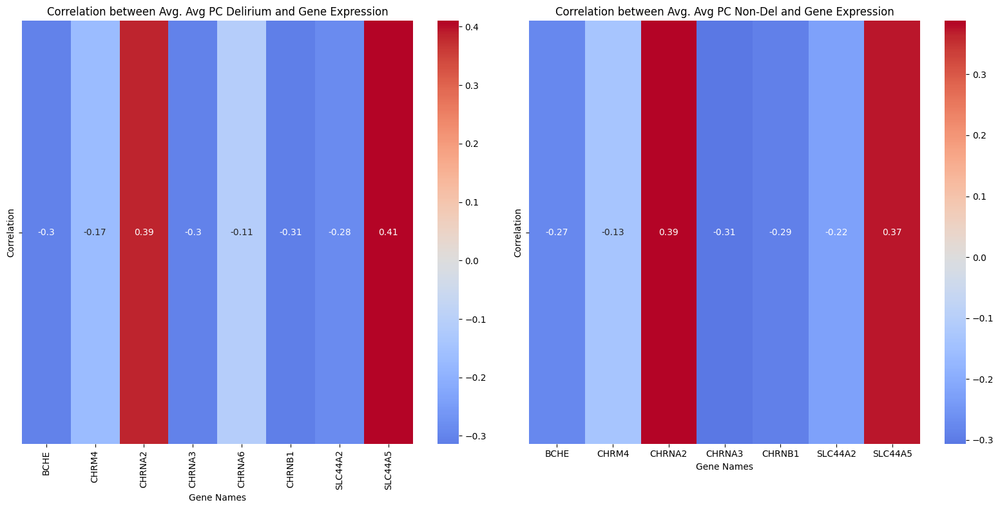

In [38]:
name_suffix ='Avg PC'
# Calculate the correlation between avg_pc_del and receptor_data
[correlations_del,pvalue_del]=stats.permtest_pearsonr(mean_pc_del,ach_gene_data, n_perm=1000)

# Calculate the correlation between avg nondel LC FC and receptor_data
[correlations_nondel,pvalue_nondel]=stats.permtest_pearsonr(mean_pc_nondel,ach_gene_data, n_perm=1000)

# Create DataFrames for easier plotting
# Create DataFrames for easier plotting
correlation_df_del_pc = pd.DataFrame({
    'Gene': ach_gene_data.columns,
    'Correlation': correlations_del,
    'P-Value Permuted': pvalue_del
})

correlation_df_nondel_pc = pd.DataFrame({
    'Gene': ach_gene_data.columns,
    'Correlation': correlations_nondel,
    'P-Value Permuted': pvalue_nondel
})

# Define the significance threshold
significance_threshold = 0.05

# Filter the DataFrame for significant results
significant_results_del = correlation_df_del_pc[correlation_df_del_pc['P-Value Permuted'] < significance_threshold]
significant_results_nondel = correlation_df_nondel_pc[correlation_df_nondel_pc['P-Value Permuted'] < significance_threshold]
# Plot the correlation matrices side by side
# Create dynamic titles
title_del = f'Correlation between Avg. {name_suffix} Delirium and Gene Expression'
title_nondel = f'Correlation between Avg. {name_suffix} Non-Del and Gene Expression'

# Ensure significant_results_del and significant_results_nondel contain numeric data for plotting
if 'Correlation' in significant_results_del.columns and 'Correlation' in significant_results_nondel.columns:
    correlation_values_del = significant_results_del[['Correlation']].astype(float).T  # Transpose for heatmap
    correlation_values_nondel = significant_results_nondel[['Correlation']].astype(float).T  # Transpose for heatmap
else:
    raise ValueError("One of the significant_results DataFrames does not contain a 'Correlation' column.")

# Create subplots for side-by-side heatmaps
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Heatmap for significant_results_del
sns.heatmap(correlation_values_del, annot=True, cmap='coolwarm', center=0,
            xticklabels=significant_results_del['Gene'].values, ax=axes[0])
axes[0].set_title(title_del)
axes[0].set_xlabel('Gene Names')


# Heatmap for significant_results_nondel
sns.heatmap(correlation_values_nondel, annot=True, cmap='coolwarm', center=0,
            xticklabels=significant_results_nondel['Gene'].values, ax=axes[1])
axes[1].set_title(title_nondel)
axes[1].set_xlabel('Gene Names')


plt.tight_layout()
plt.show()

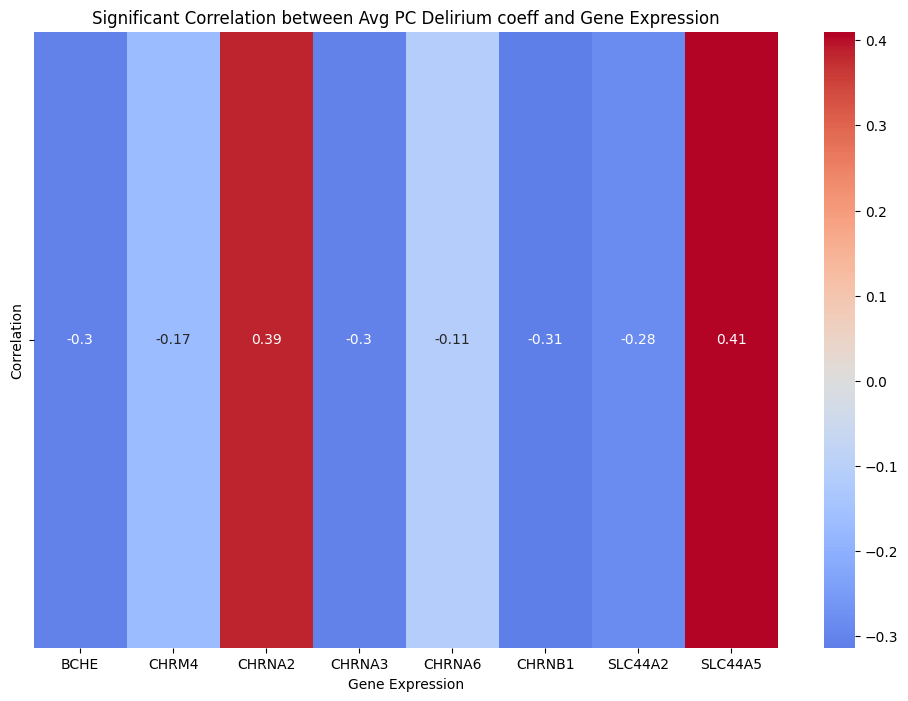

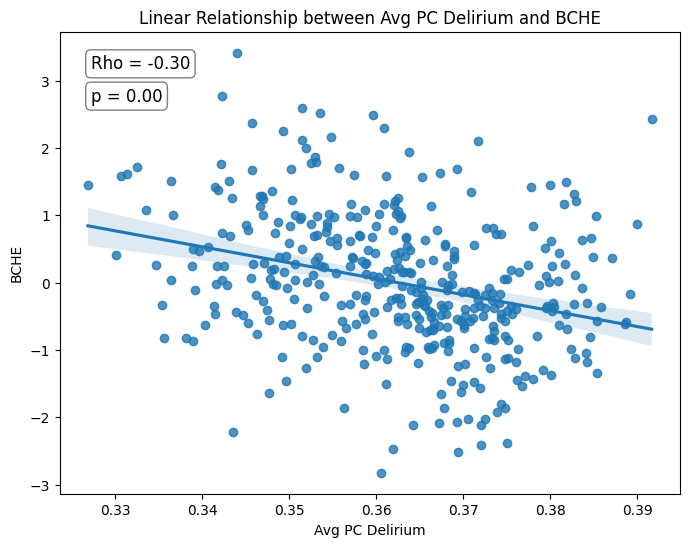

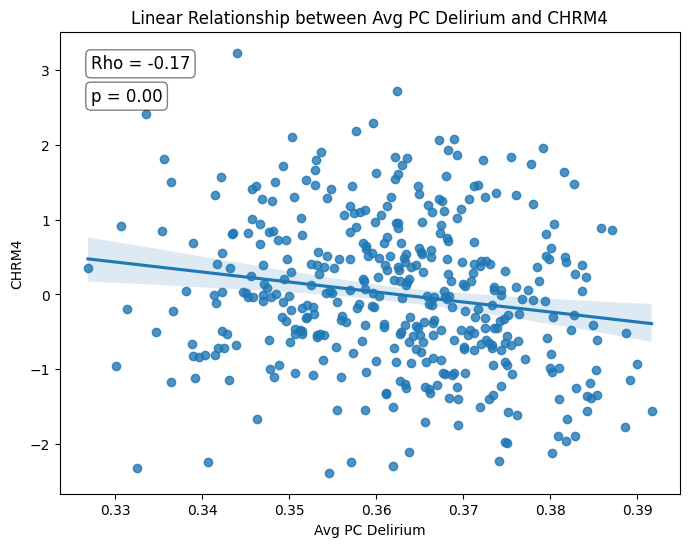

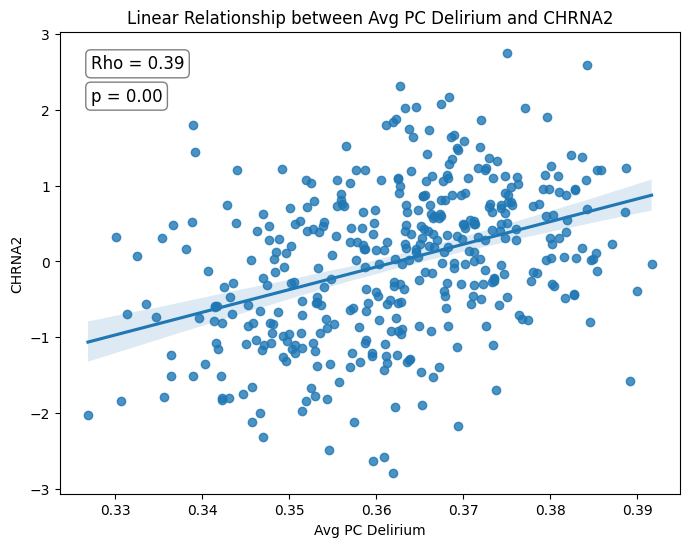

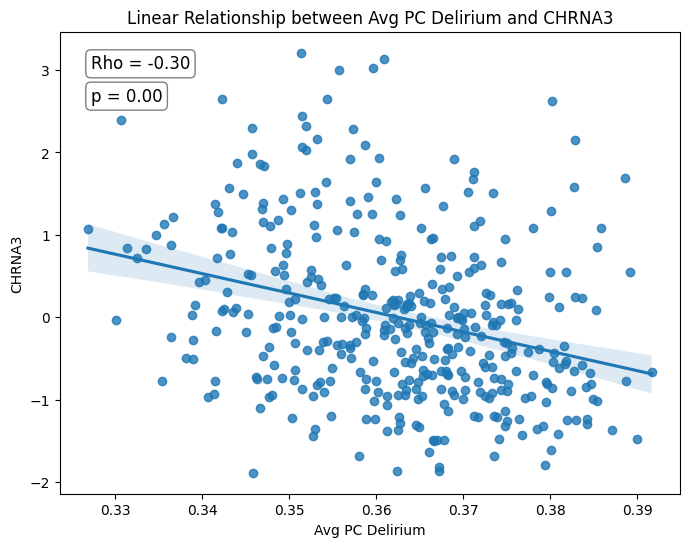

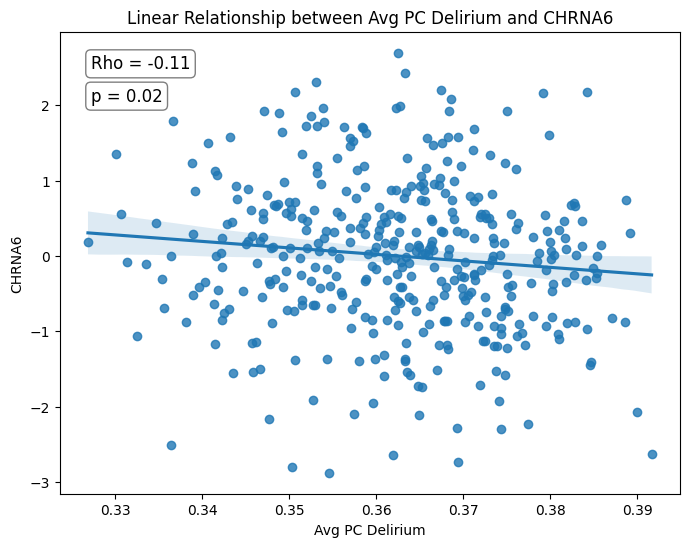

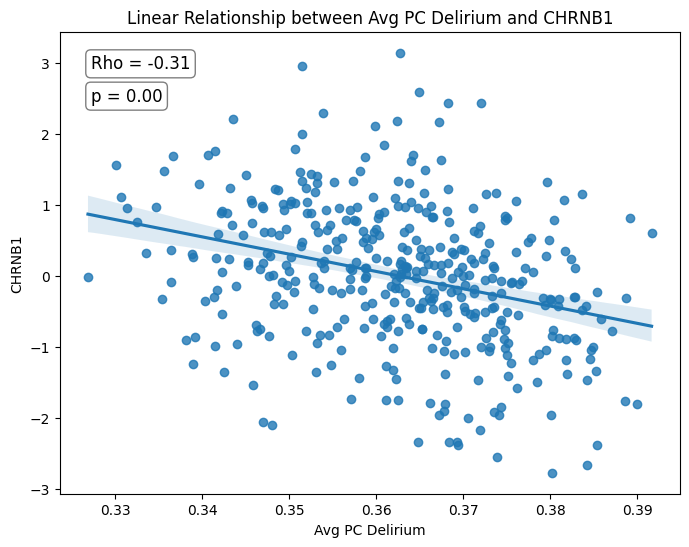

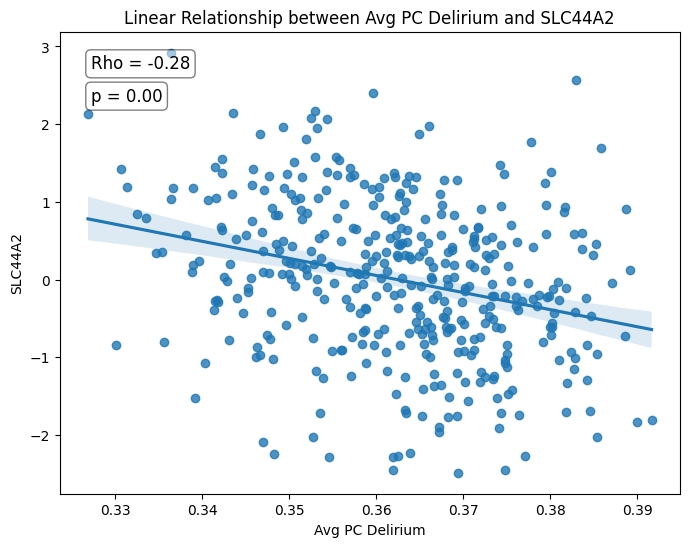

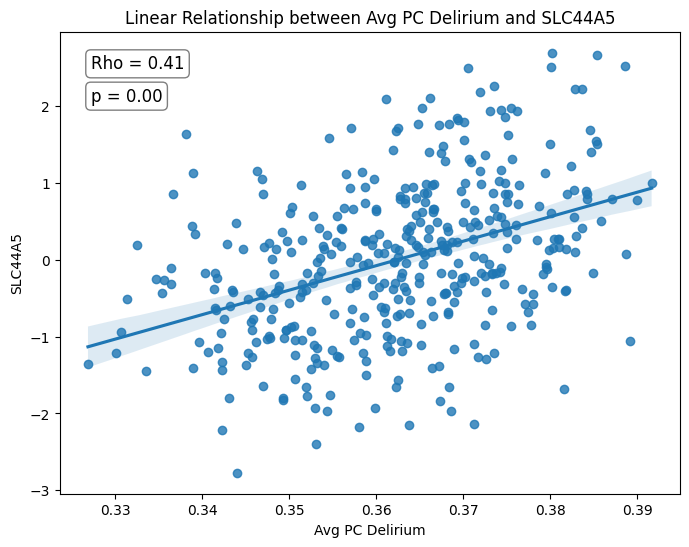

In [35]:
# Ensure significant_results contains numeric data for plotting
name_suffix = 'Avg PC Delirium'
if 'Correlation' in significant_results.columns:
    correlation_values = significant_results[['Correlation']].astype(float)
else:
    raise ValueError("significant_results does not contain a 'Correlation' column.")

# Plot the correlation matrix
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_values.T, annot=True, cmap='coolwarm', center=0, xticklabels=significant_results['Gene'])
plt.title(f'Significant Correlation between {name_suffix} coeff and Gene Expression')
plt.xlabel('Gene Expression')  # Add x-axis label
plt.show()

# Iterate over significant receptors
for gene in significant_results.Gene:  # Use the gene names from significant_results
    plt.figure(figsize=(8, 6))
    sns.regplot(x=analyse_data.flatten(), y=ach_gene_data[gene])
    plt.xlabel(f'{name_suffix}')
    plt.ylabel(gene)
    plt.title(f'Linear Relationship between {name_suffix} and {gene}')
    
    # Calculate correlation
    rho = significant_results[significant_results['Gene'] == gene]['Correlation'].values[0]
    pval = significant_results[significant_results['Gene'] == gene]['P-Value Permuted'].values[0]
    
    plt.text(0.05, 0.95, f'Rho = {rho:.2f}', transform=plt.gca().transAxes, 
             fontsize=12, verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
    plt.text(0.05, 0.88, f'p = {pval:.2f}', transform=plt.gca().transAxes, 
             fontsize=12, verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
    
    plt.show()

## Cholinergic relevant receptors functions
- BCHE – Butyrylcholinesterase
Function: An enzyme that hydrolyzes choline-based esters like acetylcholine (ACh), similar to acetylcholinesterase (ACHE), but with broader substrate specificity.

Role in Brain: Acts as a backup or modulator of ACh breakdown. Expressed in neurons and glia, with increased roles in aging and neurodegeneration (e.g., Alzheimer's disease).

Expression: Widespread but varies across regions; notable in cortex, hippocampus, and subcortical areas.

- CHRM4 – Cholinergic Receptor Muscarinic 4
Function: G-protein-coupled muscarinic receptor (M4 subtype) involved in inhibitory signaling via Gi/o proteins.

Role in Brain: Modulates dopamine release, particularly in the striatum and cortex; implicated in cognitive processes and psychiatric disorders (e.g., schizophrenia).

Expression: High in striatum (caudate, putamen) and prefrontal cortex.

- CHRNA2 – Cholinergic Receptor Nicotinic Alpha 2 Subunit
Function: A component of nicotinic acetylcholine receptors (nAChRs), forming pentameric ligand-gated ion channels.

Role in Brain: Less common than other subunits; thought to play roles in hippocampal function, attention, and arousal.

Expression: Moderate expression, especially in hippocampus and cortex.

- CHRNA3 – Cholinergic Receptor Nicotinic Alpha 3 Subunit
Function: Another subunit of nAChRs, typically forming heteromeric receptors with beta subunits like CHRNB4.

Role in Brain: Involved in autonomic and sensory processing; present in subcortical structures and brainstem.

Expression: High in medulla, thalamus, and autonomic ganglia.

- CHRNA6 – Cholinergic Receptor Nicotinic Alpha 6 Subunit
Function: Nicotinic receptor subunit important in dopaminergic signaling.

Role in Brain: Highly expressed in dopaminergic areas like the substantia nigra and ventral tegmental area (VTA); involved in reward and motor control.

Expression: Very specific to midbrain dopaminergic nuclei.

- CHRNB1 – Cholinergic Receptor Nicotinic Beta 1 Subunit
Function: A beta subunit forming part of nicotinic receptors, typically more prominent in muscle-type receptors, but also expressed in some brain areas.

Role in Brain: Less well understood in the brain; may be involved in neuromuscular signaling and some central functions.

Expression: Lower in the CNS; some expression noted in brainstem and motor areas.



In [39]:
# FDR correction for multiple comparisons
from statsmodels.stats.multitest import multipletests

name_suffix ='Avg PC'
# Calculate the correlation between avg_pc_del and receptor_data
[correlations_del,pvalue_del]=stats.permtest_pearsonr(mean_pc_del,ach_gene_data, n_perm=1000)

# Calculate the correlation between avg nondel LC FC and receptor_data
[correlations_nondel,pvalue_nondel]=stats.permtest_pearsonr(mean_pc_nondel,ach_gene_data, n_perm=1000)

# Apply FDR correction to both groups
# For delirium group
rejected_del, pvals_fdr_del, _, _ = multipletests(
    pvalue_del, 
    alpha=0.05, 
    method='fdr_bh'
)

# For non-delirium group
rejected_nondel, pvals_fdr_nondel, _, _ = multipletests(
    pvalue_nondel, 
    alpha=0.05, 
    method='fdr_bh'
)

# Create DataFrames for easier plotting
correlation_df_del_pc = pd.DataFrame({
    'Gene': ach_gene_data.columns,
    'Correlation': correlations_del,
    'P-Value Permuted': pvalue_del,
    'P-Value FDR Corrected': pvals_fdr_del,
    'Significant After FDR': rejected_del
})

correlation_df_nondel_pc = pd.DataFrame({
    'Gene': ach_gene_data.columns,
    'Correlation': correlations_nondel,
    'P-Value Permuted': pvalue_nondel,
    'P-Value FDR Corrected': pvals_fdr_nondel,
    'Significant After FDR': rejected_nondel
})

# Print comparison of results
print("DELIRIUM GROUP RESULTS:")
print(f"Uncorrected significant genes: {np.sum(pvalue_del < 0.05)}")
print(f"FDR-corrected significant genes: {np.sum(rejected_del)}")
print("\nNON-DELIRIUM GROUP RESULTS:")
print(f"Uncorrected significant genes: {np.sum(pvalue_nondel < 0.05)}")
print(f"FDR-corrected significant genes: {np.sum(rejected_nondel)}")

# Show significant results after FDR correction
significant_results_fdr_del = correlation_df_del_pc[correlation_df_del_pc['Significant After FDR']]
significant_results_fdr_nondel = correlation_df_nondel_pc[correlation_df_nondel_pc['Significant After FDR']]

print("\nDELIRIUM - FDR Significant Results:")
print(significant_results_fdr_del)
print("\nNON-DELIRIUM - FDR Significant Results:")
print(significant_results_fdr_nondel)

DELIRIUM GROUP RESULTS:
Uncorrected significant genes: 8
FDR-corrected significant genes: 7

NON-DELIRIUM GROUP RESULTS:
Uncorrected significant genes: 7
FDR-corrected significant genes: 7

DELIRIUM - FDR Significant Results:
       Gene  Correlation  P-Value Permuted  P-Value FDR Corrected  \
1      BCHE    -0.304792          0.000999               0.002569   
6     CHRM4    -0.172153          0.000999               0.002569   
8    CHRNA2     0.385026          0.000999               0.002569   
9    CHRNA3    -0.303180          0.000999               0.002569   
13   CHRNB1    -0.313542          0.000999               0.002569   
16  SLC44A2    -0.282899          0.000999               0.002569   
17  SLC44A5     0.410007          0.000999               0.002569   

    Significant After FDR  
1                    True  
6                    True  
8                    True  
9                    True  
13                   True  
16                   True  
17                   True

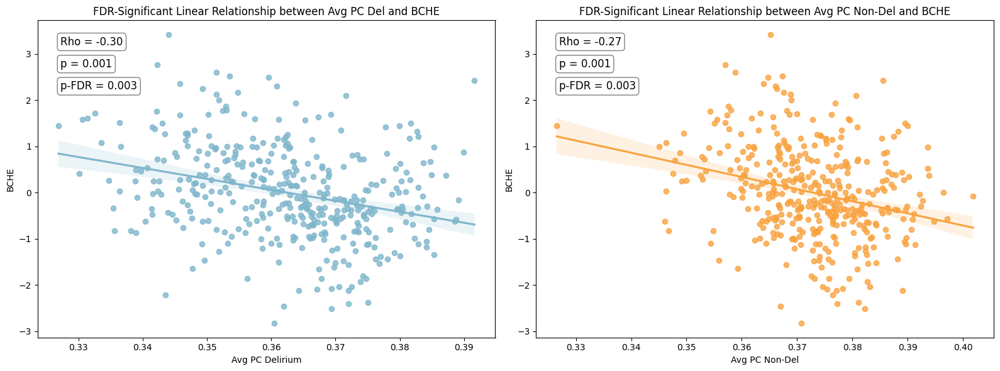

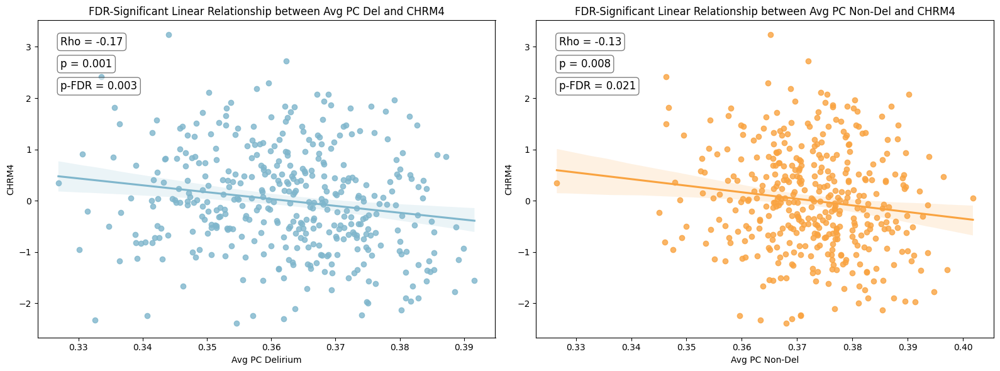

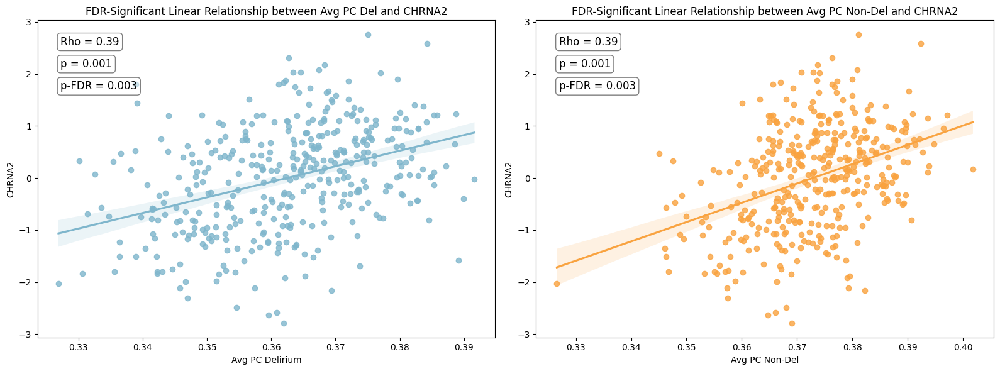

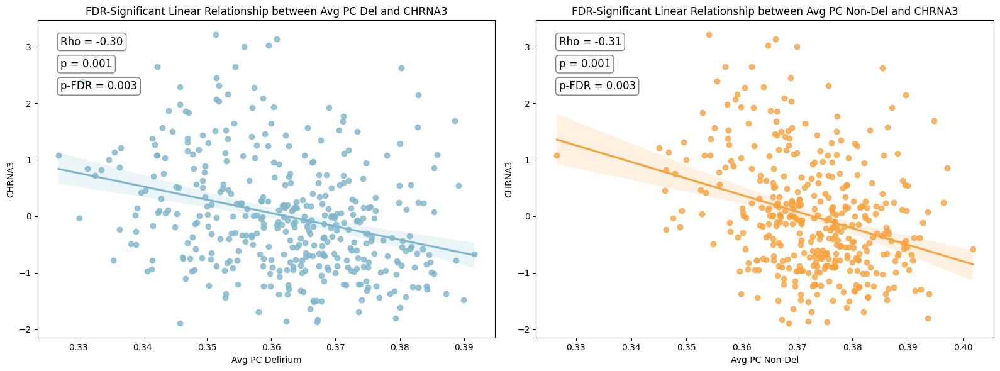

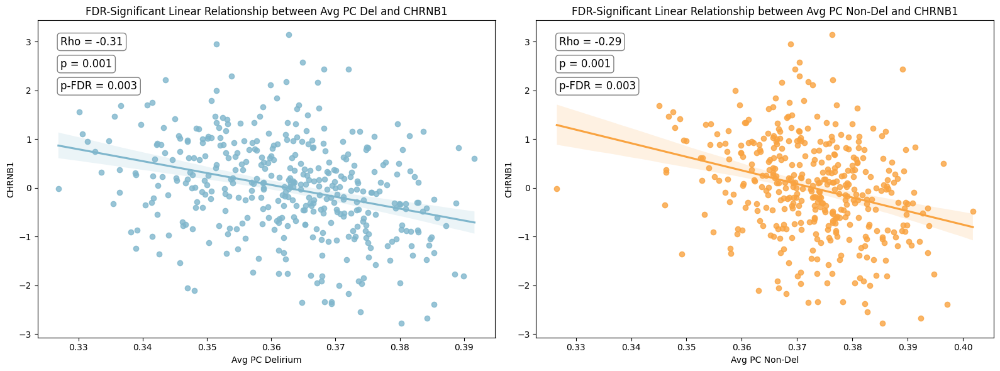

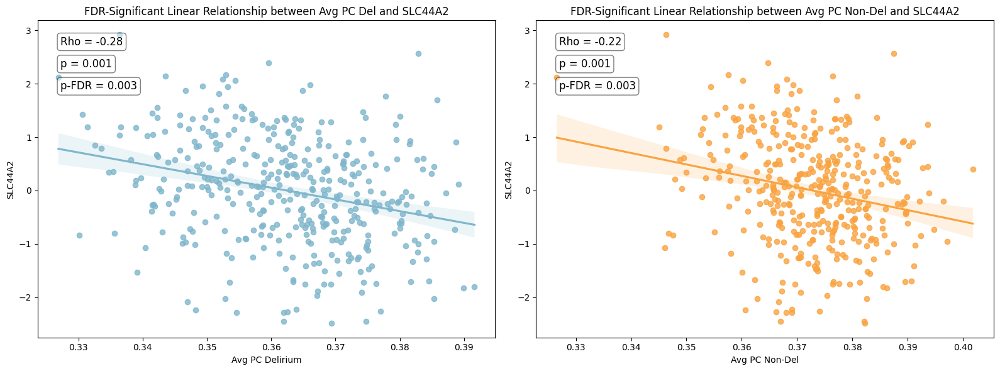

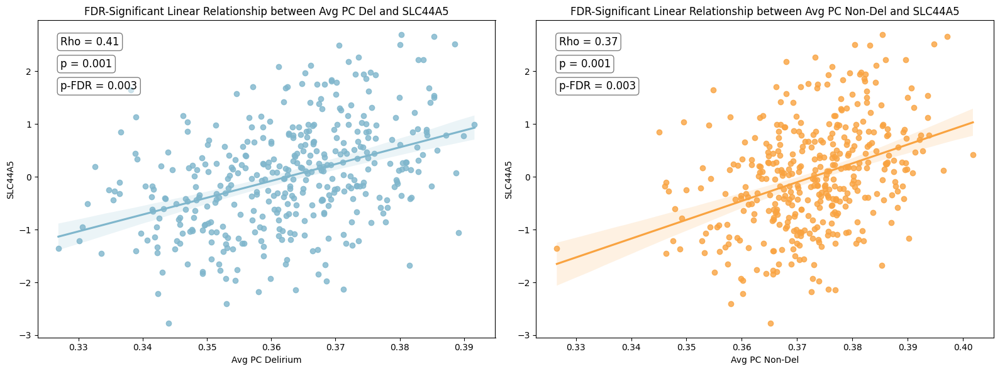

In [40]:
#colours <- c(`Non-Delirious` = "#f9a340", Delirious = "#7fb6cc")

# Filter for FDR-corrected significant results
significant_results_fdr_del = correlation_df_del_pc[correlation_df_del_pc['Significant After FDR']]
significant_results_fdr_nondel = correlation_df_nondel_pc[correlation_df_nondel_pc['Significant After FDR']]

for gene in significant_results_fdr_nondel['Gene']:
    # Check if gene exists in FDR-corrected significant results for delirium group
    if gene not in significant_results_fdr_del['Gene'].values:
        print(f"Skipping gene {gene} for Avg. PC Del as it is not FDR-significant.")
        continue
    
    # Create side-by-side plots
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    
    # Plot for Avg. PC Del
    sns.regplot(x=mean_pc_del.flatten(), y=ach_gene_data[gene], ax=axes[0], scatter_kws={'color': '#7fb6cc'}, line_kws={'color': '#7fb6cc'})
    axes[0].set_xlabel(f'{name_suffix} Delirium')
    axes[0].set_ylabel(gene)
    axes[0].set_title(f'FDR-Significant Linear Relationship between {name_suffix} Del and {gene}')
    
    # Calculate correlation for Avg. PC Del (using FDR-corrected results)
    rho_del = significant_results_fdr_del[significant_results_fdr_del['Gene'] == gene]['Correlation'].values[0]
    pval_del = significant_results_fdr_del[significant_results_fdr_del['Gene'] == gene]['P-Value Permuted'].values[0]
    pval_fdr_del = significant_results_fdr_del[significant_results_fdr_del['Gene'] == gene]['P-Value FDR Corrected'].values[0]
    
    # Add correlation and p-value text for Avg. PC Del
    axes[0].text(0.05, 0.95, f'Rho = {rho_del:.2f}', transform=axes[0].transAxes, 
                 fontsize=12, verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
    axes[0].text(0.05, 0.88, f'p = {pval_del:.3f}', transform=axes[0].transAxes, 
                 fontsize=12, verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
    axes[0].text(0.05, 0.81, f'p-FDR = {pval_fdr_del:.3f}', transform=axes[0].transAxes, 
                 fontsize=12, verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
    
    # Plot for Avg. PC Non-Del
    sns.regplot(
        x=mean_pc_nondel.flatten(),
        y=ach_gene_data[gene],
        ax=axes[1],
        scatter_kws={'color': '#f9a340'},
        line_kws={'color': '#f9a340'},
        ci=95
    )
    axes[1].set_xlabel(f'{name_suffix} Non-Del')
    axes[1].set_ylabel(gene)
    axes[1].set_title(f'FDR-Significant Linear Relationship between {name_suffix} Non-Del and {gene}')
    
    # Calculate correlation for Avg. PC Non-Del (using FDR-corrected results)
    rho_nondel = significant_results_fdr_nondel[significant_results_fdr_nondel['Gene'] == gene]['Correlation'].values[0]
    pval_nondel = significant_results_fdr_nondel[significant_results_fdr_nondel['Gene'] == gene]['P-Value Permuted'].values[0]
    pval_fdr_nondel = significant_results_fdr_nondel[significant_results_fdr_nondel['Gene'] == gene]['P-Value FDR Corrected'].values[0]
    
    # Add correlation and p-value text for Avg. PC Non-Del
    axes[1].text(0.05, 0.95, f'Rho = {rho_nondel:.2f}', transform=axes[1].transAxes, 
                 fontsize=12, verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
    axes[1].text(0.05, 0.88, f'p = {pval_nondel:.3f}', transform=axes[1].transAxes, 
                 fontsize=12, verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
    axes[1].text(0.05, 0.81, f'p-FDR = {pval_fdr_nondel:.3f}', transform=axes[1].transAxes, 
                 fontsize=12, verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
    
    plt.tight_layout()
    # Save the figure as SVG in the desired directory
    plt.savefig(f'/Users/ntaylor/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/Postdoc_Rob/Analysis/Graph_Theory/schaef_400/csf_regress_redo/Gene_Expression_Neuromaps/{gene}_avg_pc_grouped_FDR_updated.svg', format='svg',bbox_inches='tight')
    plt.show()

# PCA Analysis

ACh gene data shape: (400, 18)
Genes included: ['ACHE', 'BCHE', 'CHAT', 'CHRM1', 'CHRM2', 'CHRM3', 'CHRM4', 'CHRM5', 'CHRNA2', 'CHRNA3', 'CHRNA4', 'CHRNA6', 'CHRNA7', 'CHRNB1', 'CHRNB2', 'SLC44A1', 'SLC44A2', 'SLC44A5']
PCA transformed data shape: (400, 10)
Explained variance ratio: [0.24346887 0.14869766 0.11347339 0.09496858 0.07682961 0.06753466
 0.04420442 0.03308092 0.02969568 0.02454896]
Cumulative explained variance: [0.24346887 0.39216653 0.50563992 0.6006085  0.67743811 0.74497277
 0.78917719 0.82225812 0.85195379 0.87650275]


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/decomposition/_base.py:148: RuntimeWarning: divide by zero encountered in matmul
  X_transformed = X @ self.components_.T
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/decomposition/_base.py:148: RuntimeWarning: overflow encountered in matmul
  X_transformed = X @ self.components_.T
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/decomposition/_base.py:148: RuntimeWarning: invalid value encountered in matmul
  X_transformed = X @ self.components_.T


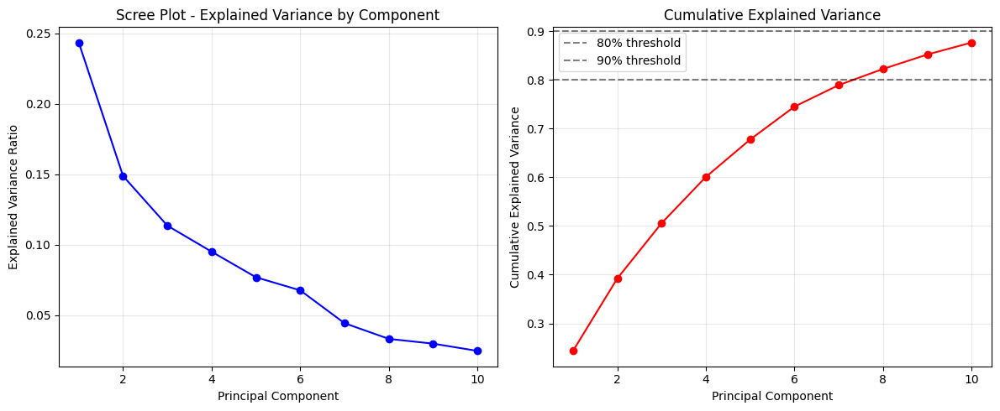

In [43]:
# Perform PCA on acetylcholine gene data
# First, let's check the shape of our data
print(f"ACh gene data shape: {ach_gene_data.shape}")
print(f"Genes included: {list(ach_gene_data.columns)}")

# Standardize the data (optional but recommended for PCA)
# Note: Your gene data might already be standardized, but let's make sure
scaler = StandardScaler()
ach_gene_scaled = scaler.fit_transform(ach_gene_data)

# Perform PCA
n_components = min(10, ach_gene_data.shape[1])  # Use up to 10 components or number of genes, whichever is smaller
pca = PCA(n_components=n_components)
ach_pca_transformed = pca.fit_transform(ach_gene_scaled)

# Create a DataFrame with the PCA results
pca_columns = [f'PC{i+1}' for i in range(n_components)]
ach_pca_df = pd.DataFrame(ach_pca_transformed, columns=pca_columns)

print(f"PCA transformed data shape: {ach_pca_df.shape}")
print(f"Explained variance ratio: {pca.explained_variance_ratio_}")
print(f"Cumulative explained variance: {np.cumsum(pca.explained_variance_ratio_)}")

# Visualization 1: Scree plot
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), 
         pca.explained_variance_ratio_, 'bo-')
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.title('Scree Plot - Explained Variance by Component')
plt.grid(True, alpha=0.3)

plt.subplot(1, 2, 2)
plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), 
         np.cumsum(pca.explained_variance_ratio_), 'ro-')
plt.xlabel('Principal Component')
plt.ylabel('Cumulative Explained Variance')
plt.title('Cumulative Explained Variance')
plt.axhline(y=0.8, color='k', linestyle='--', alpha=0.5, label='80% threshold')
plt.axhline(y=0.9, color='k', linestyle='--', alpha=0.5, label='90% threshold')
plt.legend()
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('/Users/ntaylor/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/Postdoc_Rob/Analysis/Graph_Theory/schaef_400/csf_regress_redo/Gene_Expression_Neuromaps/screeplot_pca_ach_gene_expression.svg', 
                format='svg', bbox_inches='tight') 
plt.show()

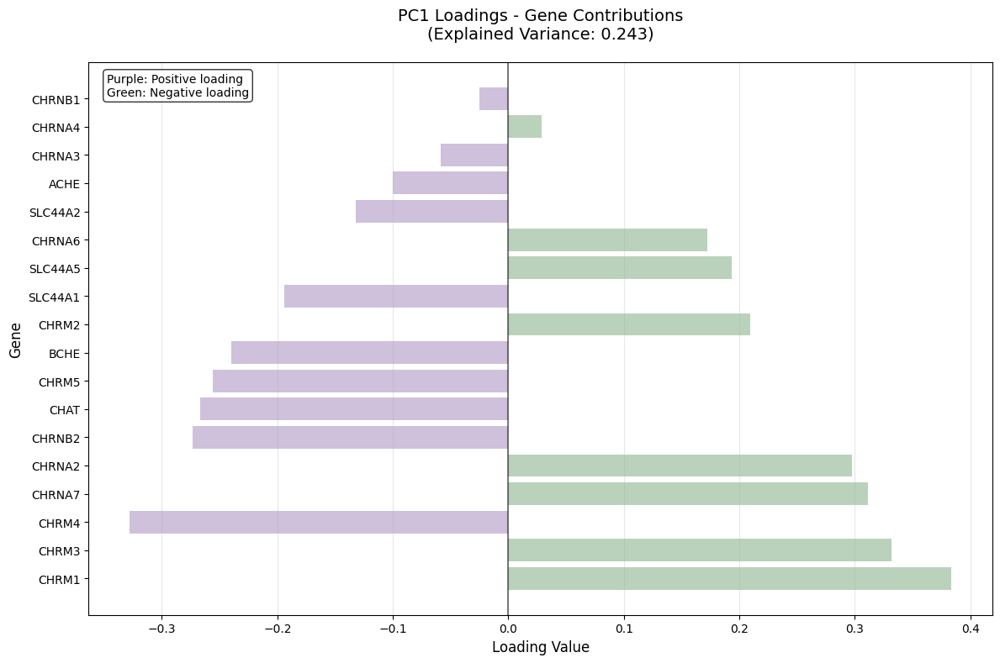

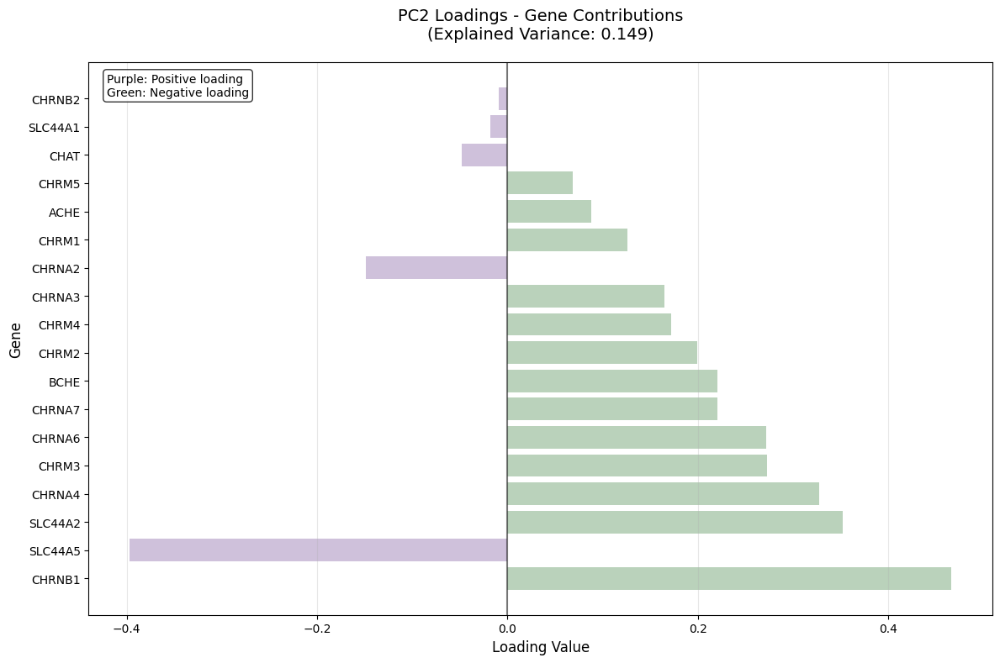

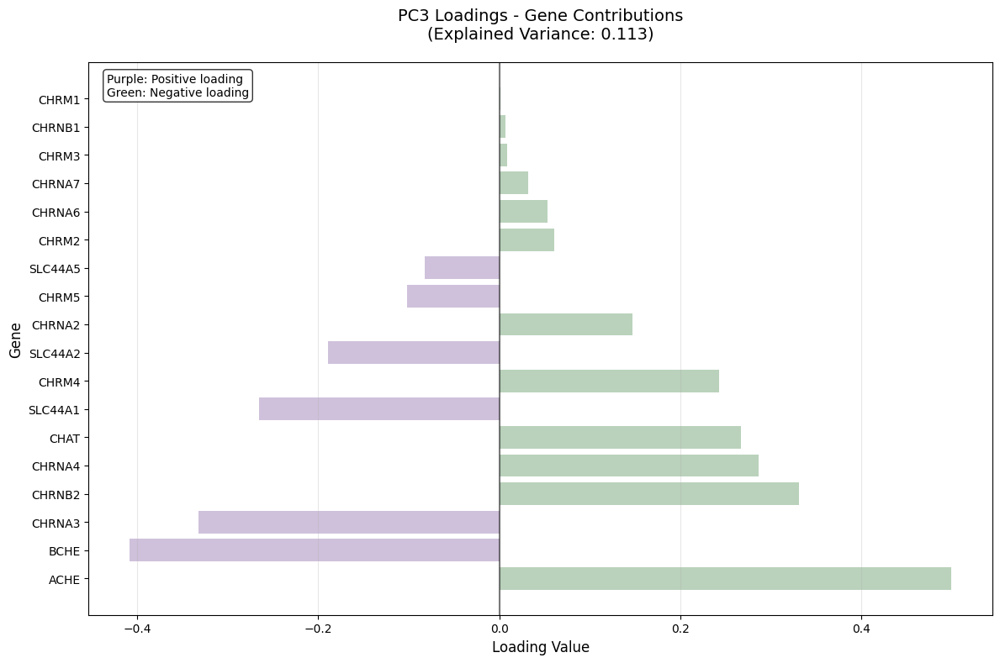

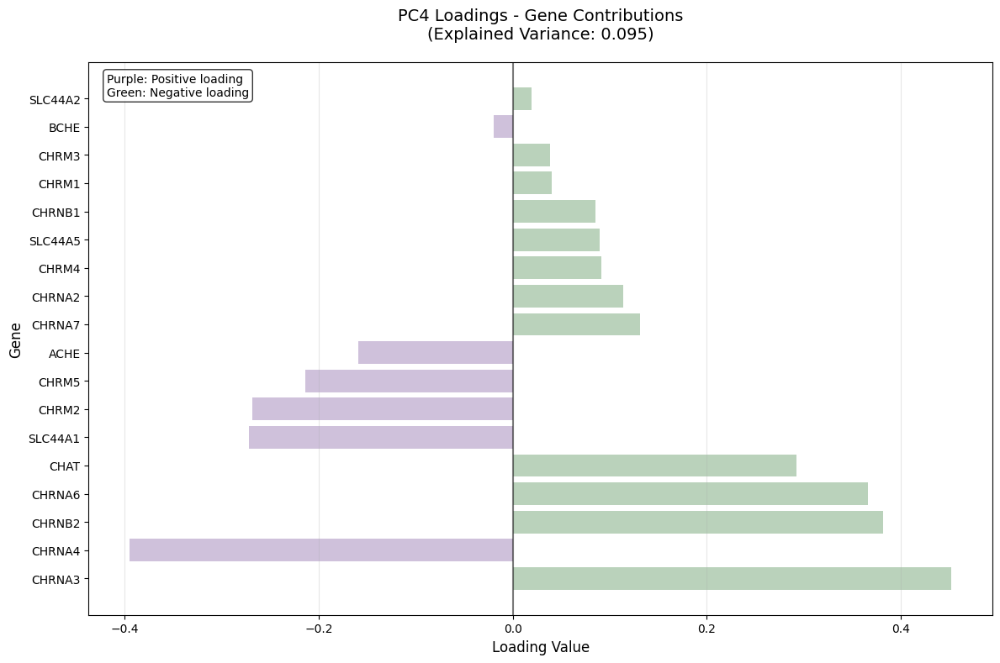

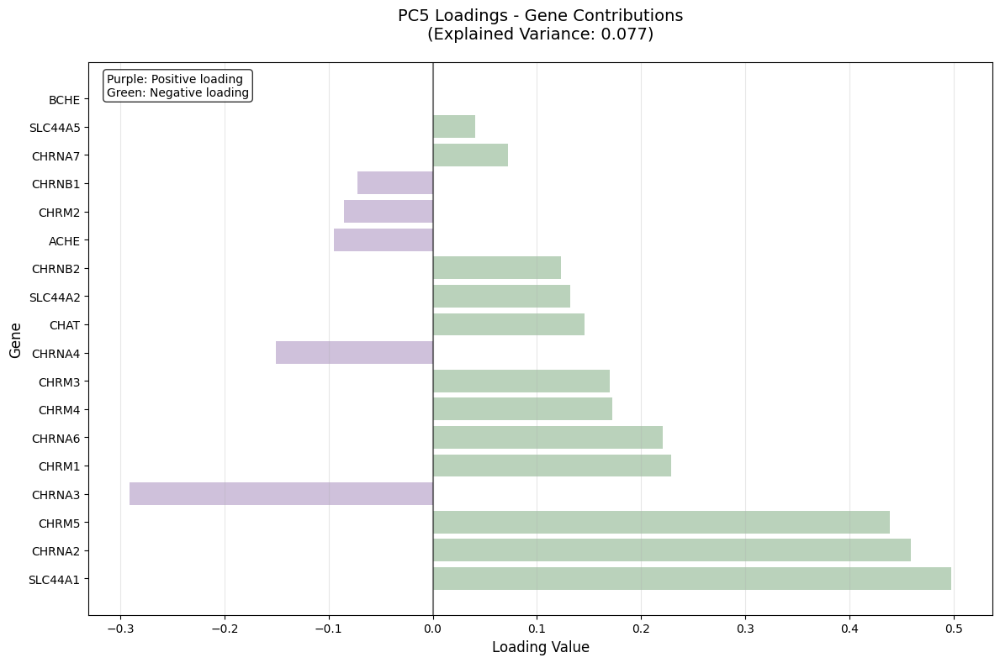

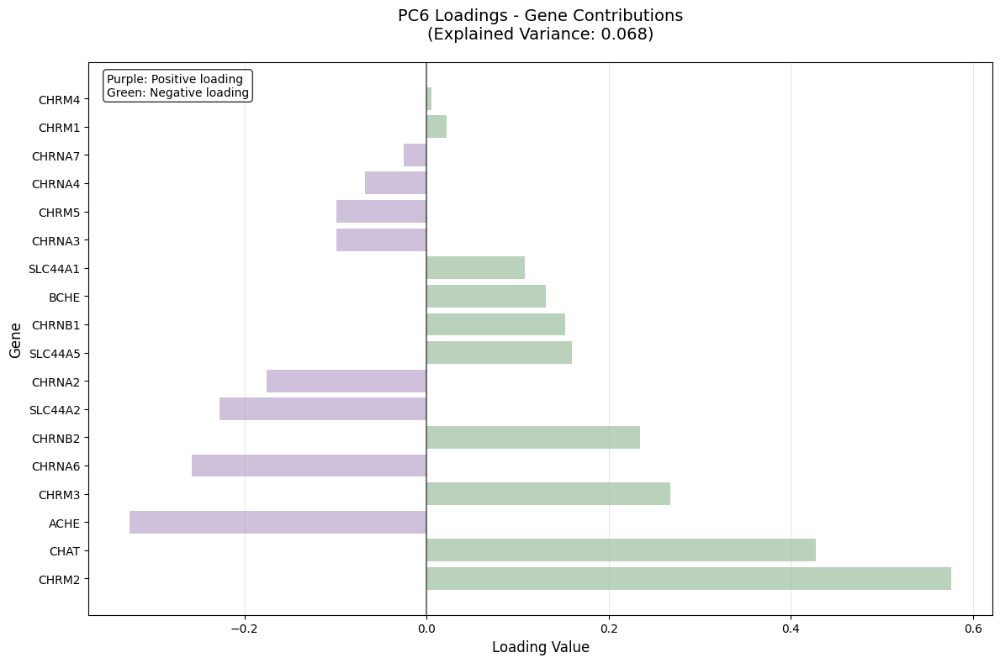

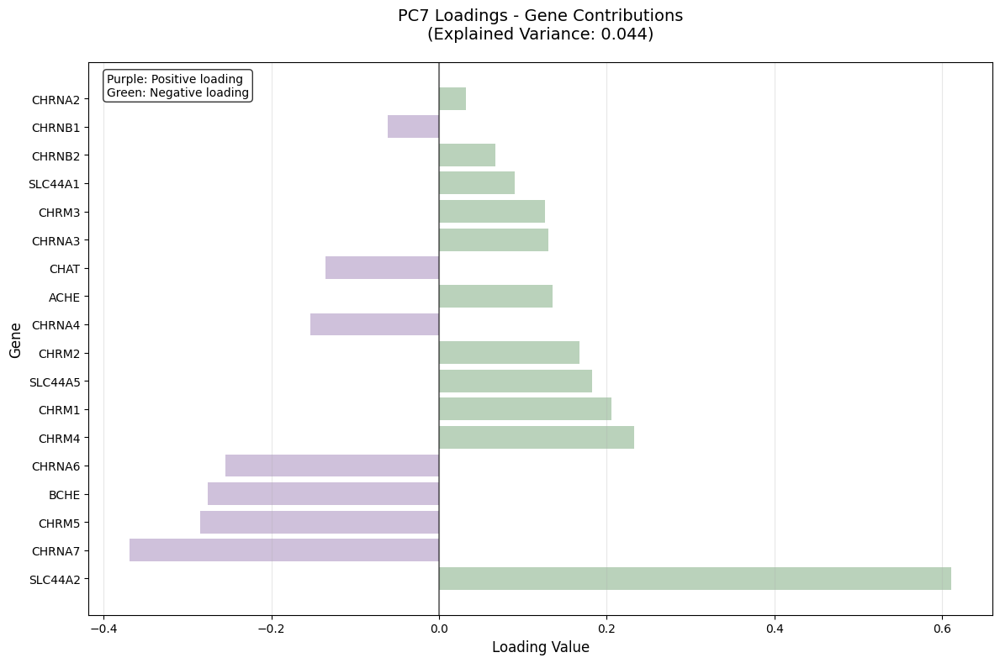

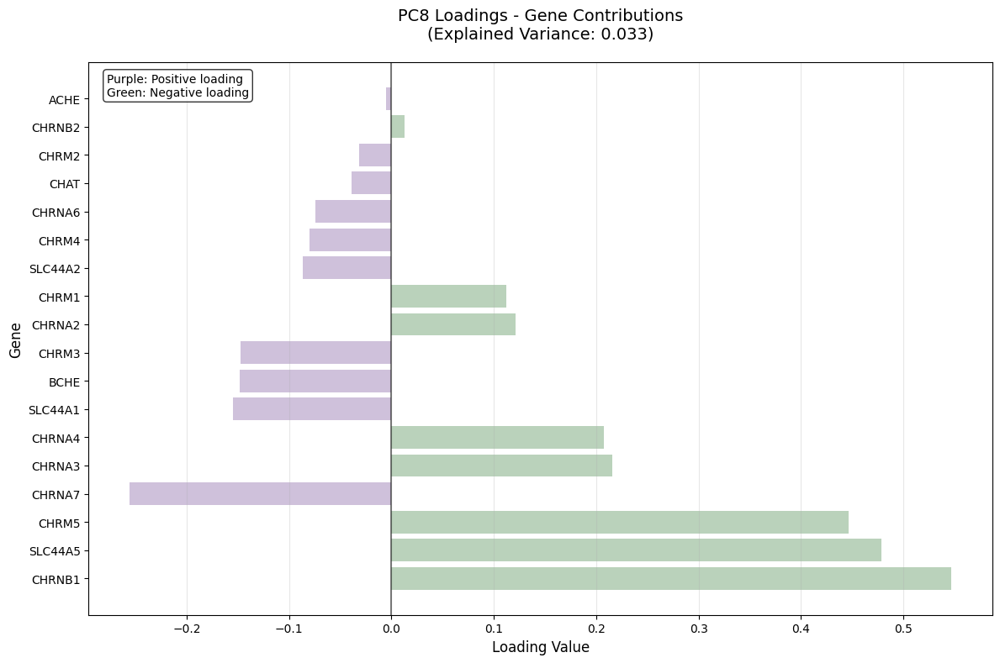

Generated 8 individual PCA loading plots


In [47]:
# Visualization 2: PCA component loadings (gene contributions)
n_components_to_plot = min(8, n_components)

for i in range(n_components_to_plot):
    plt.figure(figsize=(12, 8))
    
    # Get loadings (how much each gene contributes to this PC)
    loadings = pca.components_[i]
    
    # Create bar plot
    gene_names = ach_gene_data.columns
    
    # Sort genes by loading magnitude for better visualization
    sorted_indices = np.argsort(np.abs(loadings))[::-1]
    sorted_loadings = loadings[sorted_indices]
    sorted_gene_names = gene_names[sorted_indices]
    
    # Create horizontal bar plot
    # Create horizontal bar plot
    colors = ['#bba7cd' if x < 0 else '#9dc09f' for x in sorted_loadings]
    bars = plt.barh(range(len(sorted_gene_names)), sorted_loadings, color=colors, alpha=0.7)
    
    # Customize the plot
    plt.yticks(range(len(sorted_gene_names)), sorted_gene_names)
    plt.xlabel('Loading Value', fontsize=12)
    plt.ylabel('Gene', fontsize=12)
    plt.title(f'PC{i+1} Loadings - Gene Contributions\n(Explained Variance: {pca.explained_variance_ratio_[i]:.3f})', 
              fontsize=14, pad=20)
    
    # Add grid for better readability
    plt.grid(True, alpha=0.3, axis='x')
    
    # Add a vertical line at x=0
    plt.axvline(x=0, color='black', linestyle='-', alpha=0.5)
    
    # Add text explanation
    plt.text(0.02, 0.98, 'Purple: Positive loading\nGreen: Negative loading', 
             transform=plt.gca().transAxes, fontsize=10, verticalalignment='top',
             bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    # Adjust layout to prevent label cutoff
    plt.tight_layout()
    
    # Save individual plots
    plt.savefig(f'/Users/ntaylor/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/Postdoc_Rob/Analysis/Graph_Theory/schaef_400/csf_regress_redo/Gene_Expression_Neuromaps/pca_loadings_PC{i+1}_gene_expression_ach.svg', 
                format='svg', bbox_inches='tight', dpi=300)
    
    plt.show()

print(f"Generated {n_components_to_plot} individual PCA loading plots")

ACh gene data shape: (400, 18)
Genes included: ['ACHE', 'BCHE', 'CHAT', 'CHRM1', 'CHRM2', 'CHRM3', 'CHRM4', 'CHRM5', 'CHRNA2', 'CHRNA3', 'CHRNA4', 'CHRNA6', 'CHRNA7', 'CHRNB1', 'CHRNB2', 'SLC44A1', 'SLC44A2', 'SLC44A5']
PCA transformed data shape: (400, 10)
Explained variance ratio: [0.24346887 0.14869766 0.11347339 0.09496858 0.07682961 0.06753466
 0.04420442 0.03308092 0.02969568 0.02454896]
Cumulative explained variance: [0.24346887 0.39216653 0.50563992 0.6006085  0.67743811 0.74497277
 0.78917719 0.82225812 0.85195379 0.87650275]


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/decomposition/_base.py:148: RuntimeWarning: divide by zero encountered in matmul
  X_transformed = X @ self.components_.T
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/decomposition/_base.py:148: RuntimeWarning: overflow encountered in matmul
  X_transformed = X @ self.components_.T
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/decomposition/_base.py:148: RuntimeWarning: invalid value encountered in matmul
  X_transformed = X @ self.components_.T


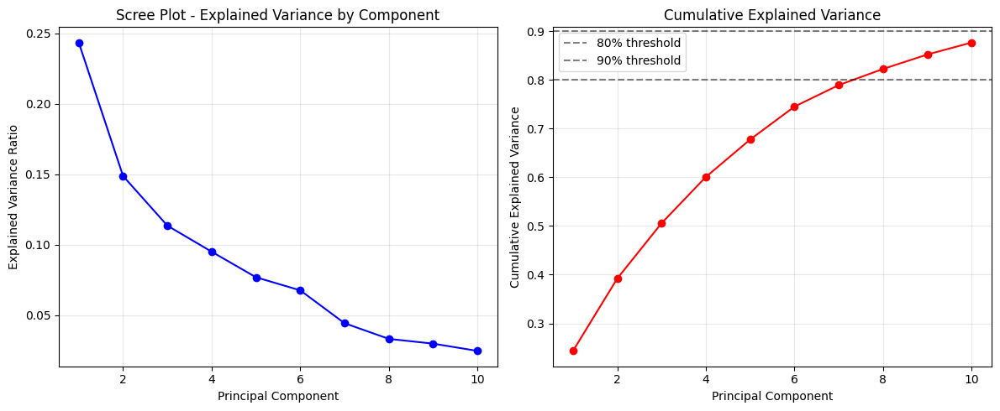

IndexError: index 0 is out of bounds for axis 0 with size 0

In [48]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Perform PCA on acetylcholine gene data
# First, let's check the shape of our data
print(f"ACh gene data shape: {ach_gene_data.shape}")
print(f"Genes included: {list(ach_gene_data.columns)}")

# Standardize the data (optional but recommended for PCA)
scaler = StandardScaler()
ach_gene_scaled = scaler.fit_transform(ach_gene_data)

# Perform PCA
n_components = min(10, ach_gene_data.shape[1])  # Use up to 10 components or number of genes, whichever is smaller
pca = PCA(n_components=n_components)
ach_pca_transformed = pca.fit_transform(ach_gene_scaled)

# Create a DataFrame with the PCA results
pca_columns = [f'PC{i+1}' for i in range(n_components)]
ach_pca_df = pd.DataFrame(ach_pca_transformed, columns=pca_columns)

print(f"PCA transformed data shape: {ach_pca_df.shape}")
print(f"Explained variance ratio: {pca.explained_variance_ratio_}")
print(f"Cumulative explained variance: {np.cumsum(pca.explained_variance_ratio_)}")

# Visualization 1: Scree plot
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), 
         pca.explained_variance_ratio_, 'bo-')
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.title('Scree Plot - Explained Variance by Component')
plt.grid(True, alpha=0.3)

plt.subplot(1, 2, 2)
plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), 
         np.cumsum(pca.explained_variance_ratio_), 'ro-')
plt.xlabel('Principal Component')
plt.ylabel('Cumulative Explained Variance')
plt.title('Cumulative Explained Variance')
plt.axhline(y=0.8, color='k', linestyle='--', alpha=0.5, label='80% threshold')
plt.axhline(y=0.9, color='k', linestyle='--', alpha=0.5, label='90% threshold')
plt.legend()
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Print how many components explain 80% and 90% of variance
var_80 = np.where(np.cumsum(pca.explained_variance_ratio_) >= 0.8)[0][0] + 1
var_90 = np.where(np.cumsum(pca.explained_variance_ratio_) >= 0.9)[0][0] + 1
print(f"Number of components explaining 80% of variance: {var_80}")
print(f"Number of components explaining 90% of variance: {var_90}")

Using first 8 components for correlation analysis
PCA Component Correlations with Brain Connectivity:
    PC  Delirium_Correlation  Delirium_P_Value  NonDelirium_Correlation  \
0  PC1                0.1584            0.0020                   0.1266   
1  PC2               -0.4368            0.0010                  -0.4002   
2  PC3                0.1373            0.0050                   0.1367   
3  PC4               -0.0638            0.1888                  -0.0451   
4  PC5                0.2016            0.0010                   0.2412   
5  PC6                0.0469            0.3437                   0.0182   
6  PC7               -0.0105            0.8212                  -0.0001   
7  PC8                0.1438            0.0090                   0.1342   

   NonDelirium_P_Value  Explained_Variance  
0               0.0170              0.2435  
1               0.0010              0.1487  
2               0.0060              0.1135  
3               0.3736              0.0950

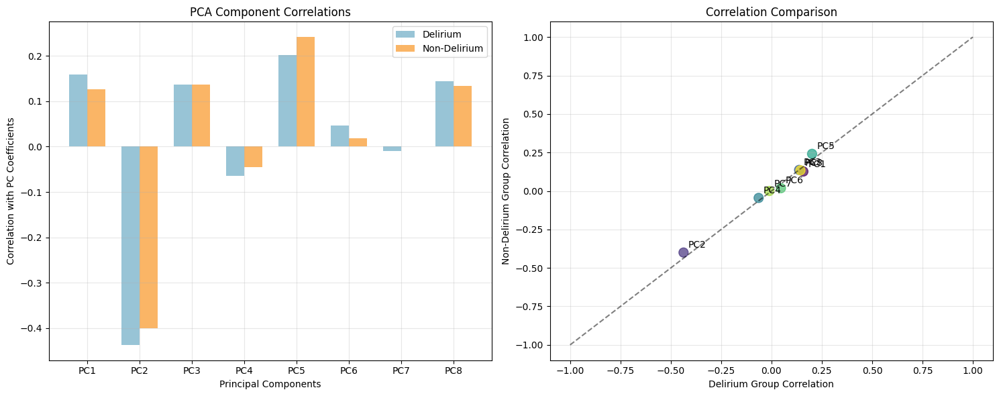

In [50]:
# Correlate PCA components with your brain measures
# Using the first few principal components that explain most variance

# Select the number of components to use (e.g., components explaining 80% of variance)
n_components_use = 8
ach_pca_selected = ach_pca_df.iloc[:, :n_components_use]

print(f"Using first {n_components_use} components for correlation analysis")

# Correlate with your connectivity measures
correlations_pca_del = []
pvalues_pca_del = []
correlations_pca_nondel = []
pvalues_pca_nondel = []

for i, pc_name in enumerate(ach_pca_selected.columns):
    pc_values = ach_pca_selected[pc_name].values
    
    # Correlate with delirium group
    rho_del, pval_del = stats.permtest_pearsonr(mean_pc_del, pc_values)
    correlations_pca_del.append(rho_del)
    pvalues_pca_del.append(pval_del)
    
    # Correlate with non-delirium group
    rho_nondel, pval_nondel = stats.permtest_pearsonr(mean_pc_nondel, pc_values)
    correlations_pca_nondel.append(rho_nondel)
    pvalues_pca_nondel.append(pval_nondel)

# Create results dataframe
pca_correlation_results = pd.DataFrame({
    'PC': ach_pca_selected.columns,
    'Delirium_Correlation': correlations_pca_del,
    'Delirium_P_Value': pvalues_pca_del,
    'NonDelirium_Correlation': correlations_pca_nondel,
    'NonDelirium_P_Value': pvalues_pca_nondel,
    'Explained_Variance': pca.explained_variance_ratio_[:n_components_use]
})

print("PCA Component Correlations with Brain Connectivity:")
print(pca_correlation_results.round(4))

# Visualization 3: PCA correlation results
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# Bar plot of correlations
x_pos = np.arange(len(ach_pca_selected.columns))
width = 0.35

axes[0].bar(x_pos - width/2, correlations_pca_del, width, 
           label='Delirium', alpha=0.8, color='#7fb6cc')
axes[0].bar(x_pos + width/2, correlations_pca_nondel, width, 
           label='Non-Delirium', alpha=0.8, color='#f9a340')
axes[0].set_xlabel('Principal Components')
axes[0].set_ylabel('Correlation with PC Coefficients')
axes[0].set_title('PCA Component Correlations')
axes[0].set_xticks(x_pos)
axes[0].set_xticklabels(ach_pca_selected.columns)
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Scatter plot comparing groups
axes[1].scatter(correlations_pca_del, correlations_pca_nondel, 
               s=100, alpha=0.7, c=range(len(correlations_pca_del)), cmap='viridis')
axes[1].set_xlabel('Delirium Group Correlation')
axes[1].set_ylabel('Non-Delirium Group Correlation')
axes[1].set_title('Correlation Comparison')
axes[1].plot([-1, 1], [-1, 1], 'k--', alpha=0.5)
axes[1].grid(True, alpha=0.3)

# Add PC labels
for i, pc in enumerate(ach_pca_selected.columns):
    axes[1].annotate(pc, (correlations_pca_del[i], correlations_pca_nondel[i]), 
                    xytext=(5, 5), textcoords='offset points')

plt.tight_layout()
plt.savefig('/Users/ntaylor/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/Postdoc_Rob/Analysis/Graph_Theory/schaef_400/csf_regress_redo/Gene_Expression_Neuromaps/corr_8pcs_ach_gene_vs_avg_pc.svg', 
                format='svg', bbox_inches='tight') 
plt.show()

Creating plots for all 8 PCs: ['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8']


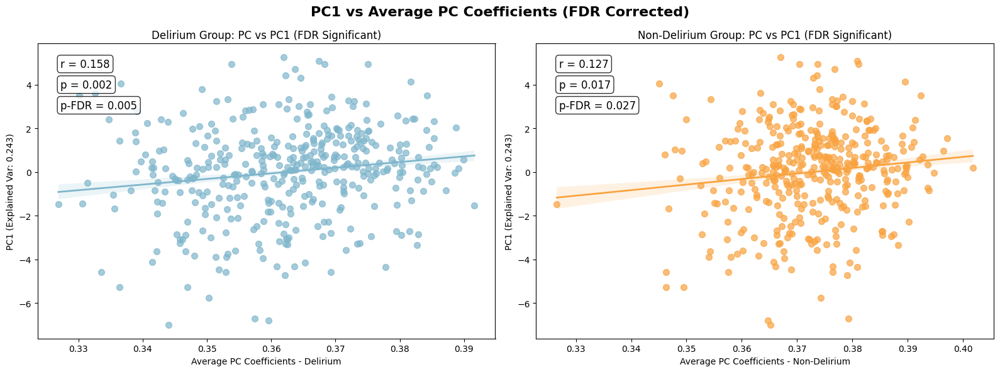

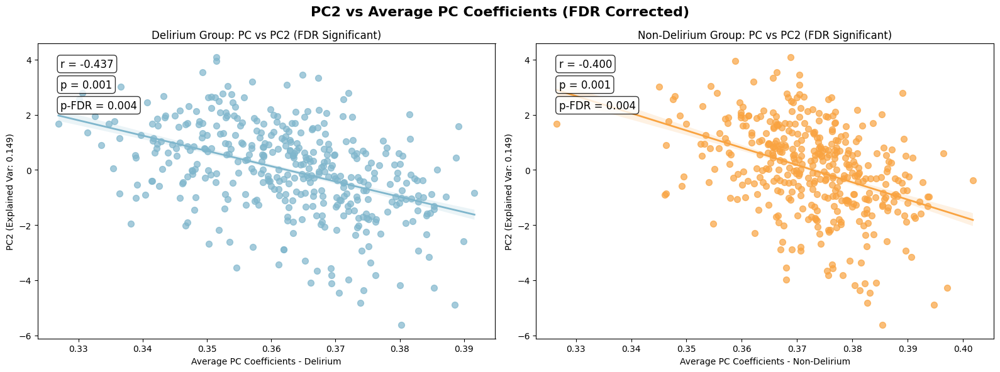

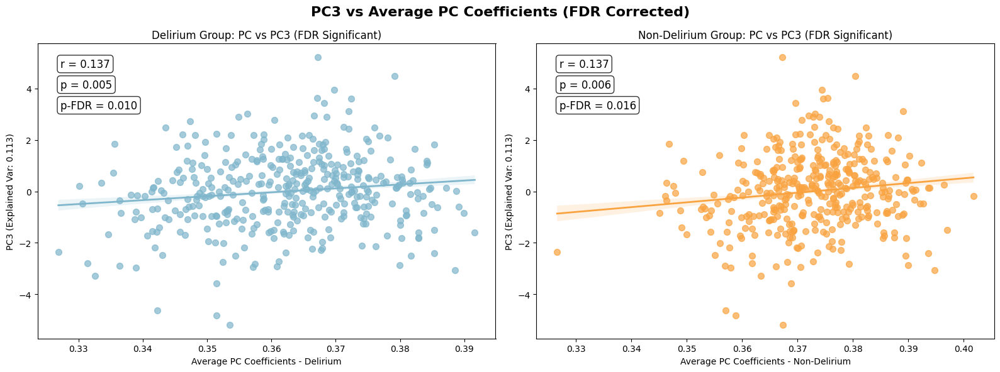

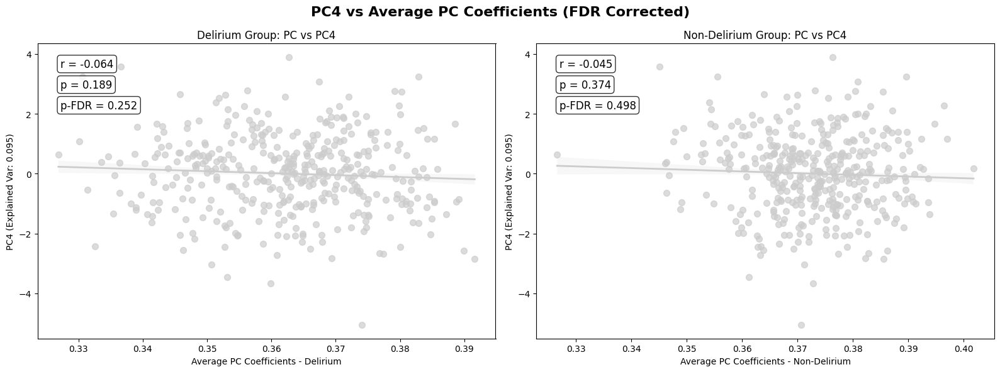

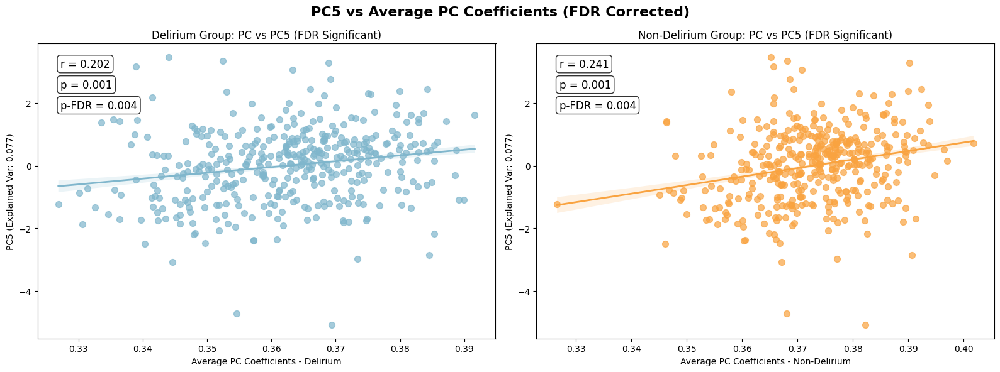

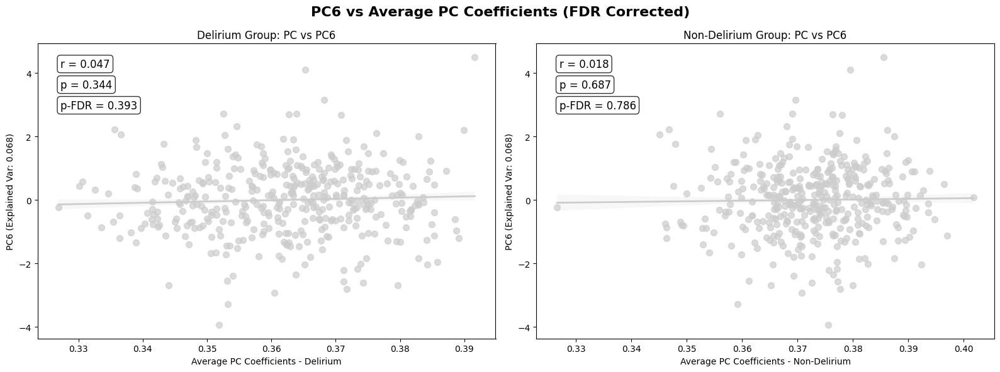

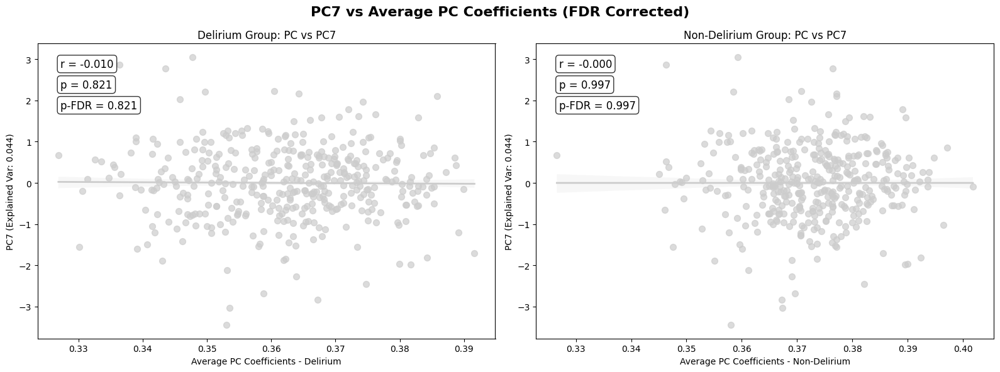

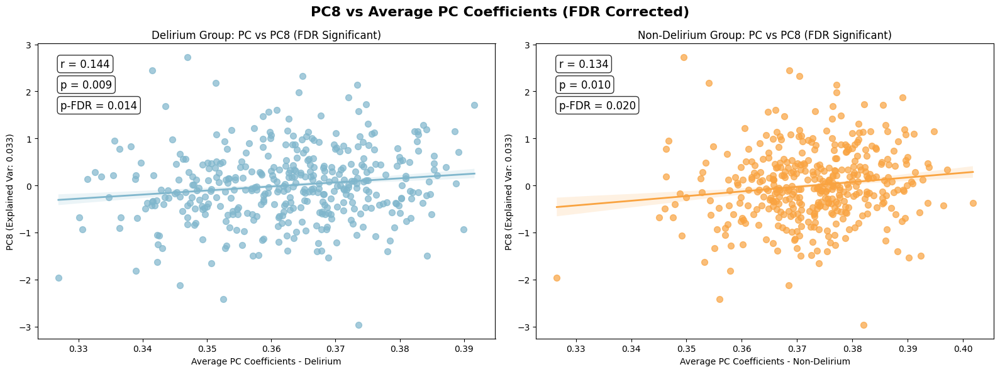

In [79]:
# plot all pcs - including the nonsignificant 
all_pcs = pca_correlation_results['PC'].values
print(f"Creating plots for all {len(all_pcs)} PCs: {list(all_pcs)}")

for pc_name in all_pcs:
    pc_index = list(ach_pca_selected.columns).index(pc_name)
    pc_values = ach_pca_selected[pc_name].values
    
    pc_row = pca_correlation_results[pca_correlation_results['PC'] == pc_name].iloc[0]
    
    rho_del = pc_row['Delirium_Correlation']
    pval_del = pc_row['Delirium_P_Value']
    pval_fdr_del = pc_row['Delirium_P_FDR']
    sig_fdr_del = pc_row['Delirium_Significant_FDR']
    
    rho_nondel = pc_row['NonDelirium_Correlation']
    pval_nondel = pc_row['NonDelirium_P_Value']
    pval_fdr_nondel = pc_row['NonDelirium_P_FDR']
    sig_fdr_nondel = pc_row['NonDelirium_Significant_FDR']
    
    # Create side-by-side plots
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))

    color_del = '#7fb6cc' if sig_fdr_del else '#cccccc'
    sns.regplot(x=mean_pc_del, y=pc_values, ax=axes[0], 
                color=color_del, scatter_kws={'alpha': 0.7, 's': 50},
                line_kws={'linewidth': 2}, ci=68)

    title_del = f'Delirium Group: PC vs {pc_name}'
    if sig_fdr_del:
        title_del += ' (FDR Significant)'

    axes[0].set_xlabel('Average PC Coefficients - Delirium')
    axes[0].set_ylabel(f'{pc_name} (Explained Var: {pca.explained_variance_ratio_[pc_index]:.3f})')
    axes[0].set_title(title_del)
    axes[0].grid(False)

    axes[0].text(0.05, 0.95, f'r = {rho_del:.3f}', transform=axes[0].transAxes, 
                 fontsize=12, verticalalignment='top', 
                 bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    axes[0].text(0.05, 0.88, f'p = {pval_del:.3f}', transform=axes[0].transAxes, 
                 fontsize=12, verticalalignment='top', 
                 bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    axes[0].text(0.05, 0.81, f'p-FDR = {pval_fdr_del:.3f}', transform=axes[0].transAxes, 
                 fontsize=12, verticalalignment='top', 
                 bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

    color_nondel = '#f9a340' if sig_fdr_nondel else '#cccccc'
    sns.regplot(x=mean_pc_nondel, y=pc_values, ax=axes[1], 
                color=color_nondel, scatter_kws={'alpha': 0.7, 's': 50},
                line_kws={'linewidth': 2}, ci=68)

    title_nondel = f'Non-Delirium Group: PC vs {pc_name}'
    if sig_fdr_nondel:
        title_nondel += ' (FDR Significant)'

    axes[1].set_xlabel('Average PC Coefficients - Non-Delirium')
    axes[1].set_ylabel(f'{pc_name} (Explained Var: {pca.explained_variance_ratio_[pc_index]:.3f})')
    axes[1].set_title(title_nondel)
    axes[1].grid(False)

    axes[1].text(0.05, 0.95, f'r = {rho_nondel:.3f}', transform=axes[1].transAxes, 
                 fontsize=12, verticalalignment='top', 
                 bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    axes[1].text(0.05, 0.88, f'p = {pval_nondel:.3f}', transform=axes[1].transAxes, 
                 fontsize=12, verticalalignment='top', 
                 bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    axes[1].text(0.05, 0.81, f'p-FDR = {pval_fdr_nondel:.3f}', transform=axes[1].transAxes, 
                 fontsize=12, verticalalignment='top', 
                 bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

    fig.suptitle(f'{pc_name} vs Average PC Coefficients (FDR Corrected)', fontsize=16, fontweight='bold')
    plt.tight_layout()

    plt.savefig(f'/Users/ntaylor/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/Postdoc_Rob/Analysis/Graph_Theory/schaef_400/csf_regress_redo/Gene_Expression_Neuromaps/{pc_name}_PCA_vs_avg_pc_grouped_FDR.svg', 
                format='svg', bbox_inches='tight')
    plt.show()
    plt.close(fig)


FDR-Significant PCs in Delirium Group:
    PC  Delirium_Correlation  Delirium_P_Value  Delirium_P_FDR
0  PC1                0.1584             0.002          0.0053
1  PC2               -0.4368             0.001          0.0040
2  PC3                0.1373             0.005          0.0100
4  PC5                0.2016             0.001          0.0040
7  PC8                0.1438             0.009          0.0144

FDR-Significant PCs in Non-Delirium Group:
    PC  NonDelirium_Correlation  NonDelirium_P_Value  NonDelirium_P_FDR
0  PC1                   0.1266                0.017             0.0272
1  PC2                  -0.4002                0.001             0.0040
2  PC3                   0.1367                0.006             0.0160
4  PC5                   0.2412                0.001             0.0040
7  PC8                   0.1342                0.010             0.0200
Creating plots for 5 FDR-significant PCs: ['PC5', 'PC2', 'PC1', 'PC8', 'PC3']


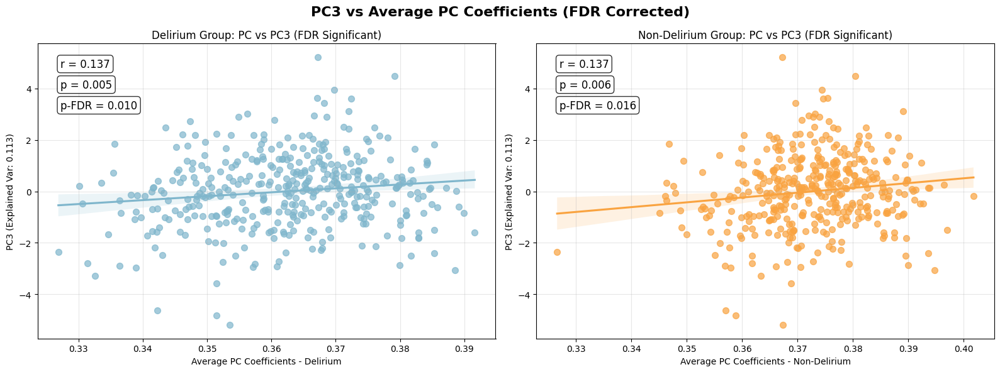

In [51]:
#find significant results based on FDR correction
from statsmodels.stats.multitest import multipletests
# FDR correction for multiple comparisons
name_suffix ='Avg PC'

# Apply FDR correction to delirium p-values
rejected_del, pvals_fdr_del, _, _ = multipletests(
    pca_correlation_results['Delirium_P_Value'], 
    alpha=0.05, 
    method='fdr_bh'
)

# Apply FDR correction to non-delirium p-values
rejected_nondel, pvals_fdr_nondel, _, _ = multipletests(
    pca_correlation_results['NonDelirium_P_Value'], 
    alpha=0.05, 
    method='fdr_bh'
)

# Add FDR-corrected results to the DataFrame
pca_correlation_results['Delirium_P_FDR'] = pvals_fdr_del
pca_correlation_results['Delirium_Significant_FDR'] = rejected_del
pca_correlation_results['NonDelirium_P_FDR'] = pvals_fdr_nondel
pca_correlation_results['NonDelirium_Significant_FDR'] = rejected_nondel

# Show only FDR-significant results
fdr_significant_del = pca_correlation_results[pca_correlation_results['Delirium_Significant_FDR']]
fdr_significant_nondel = pca_correlation_results[pca_correlation_results['NonDelirium_Significant_FDR']]

if len(fdr_significant_del) > 0:
    print(f"\nFDR-Significant PCs in Delirium Group:")
    print(fdr_significant_del[['PC', 'Delirium_Correlation', 'Delirium_P_Value', 'Delirium_P_FDR']].round(4))

if len(fdr_significant_nondel) > 0:
    print(f"\nFDR-Significant PCs in Non-Delirium Group:")
    print(fdr_significant_nondel[['PC', 'NonDelirium_Correlation', 'NonDelirium_P_Value', 'NonDelirium_P_FDR']].round(4))

# Create scatter plots only for FDR-significant principal components
significant_pcs = set()

# Collect all FDR-significant PCs from both groups
if len(fdr_significant_del) > 0:
    significant_pcs.update(fdr_significant_del['PC'].values)
if len(fdr_significant_nondel) > 0:
    significant_pcs.update(fdr_significant_nondel['PC'].values)

print(f"Creating plots for {len(significant_pcs)} FDR-significant PCs: {list(significant_pcs)}")

# Create side-by-side scatter plots for FDR-significant principal components
for pc_name in significant_pcs:
    pc_index = list(ach_pca_selected.columns).index(pc_name)
    pc_values = ach_pca_selected[pc_name].values
    
    # Get correlation values and FDR results for this PC
    pc_row = pca_correlation_results[pca_correlation_results['PC'] == pc_name].iloc[0]
    
    rho_del = pc_row['Delirium_Correlation']
    pval_del = pc_row['Delirium_P_Value']
    pval_fdr_del = pc_row['Delirium_P_FDR']
    sig_fdr_del = pc_row['Delirium_Significant_FDR']
    
    rho_nondel = pc_row['NonDelirium_Correlation']
    pval_nondel = pc_row['NonDelirium_P_Value']
    pval_fdr_nondel = pc_row['NonDelirium_P_FDR']
    sig_fdr_nondel = pc_row['NonDelirium_Significant_FDR']
    
 # Create side-by-side plots
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Plot for Delirium group using seaborn regplot
color_del = '#7fb6cc' if sig_fdr_del else '#cccccc'  # Gray if not FDR significant
sns.regplot(x=mean_pc_del, y=pc_values, ax=axes[0], 
            color=color_del, scatter_kws={'alpha': 0.7, 's': 50})

title_del = f'Delirium Group: PC vs {pc_name}'
if sig_fdr_del:
    title_del += ' (FDR Significant)'

axes[0].set_xlabel('Average PC Coefficients - Delirium')
axes[0].set_ylabel(f'{pc_name} (Explained Var: {pca.explained_variance_ratio_[pc_index]:.3f})')
axes[0].set_title(title_del)
axes[0].grid(True, alpha=0.3)

# Add correlation stats for delirium
axes[0].text(0.05, 0.95, f'r = {rho_del:.3f}', transform=axes[0].transAxes, 
             fontsize=12, verticalalignment='top', 
             bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
axes[0].text(0.05, 0.88, f'p = {pval_del:.3f}', transform=axes[0].transAxes, 
             fontsize=12, verticalalignment='top', 
             bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
axes[0].text(0.05, 0.81, f'p-FDR = {pval_fdr_del:.3f}', transform=axes[0].transAxes, 
             fontsize=12, verticalalignment='top', 
             bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

# Plot for Non-Delirium group using seaborn regplot
color_nondel = '#f9a340' if sig_fdr_nondel else '#cccccc'  # Gray if not FDR significant
sns.regplot(x=mean_pc_nondel, y=pc_values, ax=axes[1], 
            color=color_nondel, scatter_kws={'alpha': 0.7, 's': 50})

title_nondel = f'Non-Delirium Group: PC vs {pc_name}'
if sig_fdr_nondel:
    title_nondel += ' (FDR Significant)'

axes[1].set_xlabel('Average PC Coefficients - Non-Delirium')
axes[1].set_ylabel(f'{pc_name} (Explained Var: {pca.explained_variance_ratio_[pc_index]:.3f})')
axes[1].set_title(title_nondel)
axes[1].grid(True, alpha=0.3)
# Add correlation stats for non-delirium
axes[1].text(0.05, 0.95, f'r = {rho_nondel:.3f}', transform=axes[1].transAxes, 
             fontsize=12, verticalalignment='top', 
             bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
axes[1].text(0.05, 0.88, f'p = {pval_nondel:.3f}', transform=axes[1].transAxes, 
             fontsize=12, verticalalignment='top', 
             bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
axes[1].text(0.05, 0.81, f'p-FDR = {pval_fdr_nondel:.3f}', transform=axes[1].transAxes, 
             fontsize=12, verticalalignment='top', 
             bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

# Add overall title
fig.suptitle(f'{pc_name} vs Average PC Coefficients (FDR Corrected)', fontsize=16, fontweight='bold')

plt.tight_layout()

# Save the figure
plt.savefig(f'/Users/ntaylor/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/Postdoc_Rob/Analysis/Graph_Theory/schaef_400/csf_regress_redo/Gene_Expression_Neuromaps/{pc_name}_PCA_vs_avg_pc_grouped_FDR.svg', 
            format='svg', bbox_inches='tight')
plt.show()


FDR-Significant PCs in Delirium Group:
    PC  Delirium_Correlation  Delirium_P_Value  Delirium_P_FDR
0  PC1                0.1584             0.002          0.0053
1  PC2               -0.4368             0.001          0.0040
2  PC3                0.1373             0.005          0.0100
4  PC5                0.2016             0.001          0.0040
7  PC8                0.1438             0.009          0.0144

FDR-Significant PCs in Non-Delirium Group:
    PC  NonDelirium_Correlation  NonDelirium_P_Value  NonDelirium_P_FDR
0  PC1                   0.1266                0.017             0.0272
1  PC2                  -0.4002                0.001             0.0040
2  PC3                   0.1367                0.006             0.0160
4  PC5                   0.2412                0.001             0.0040
7  PC8                   0.1342                0.010             0.0200
Creating plots for 5 FDR-significant PCs: ['PC5', 'PC2', 'PC1', 'PC8', 'PC3']


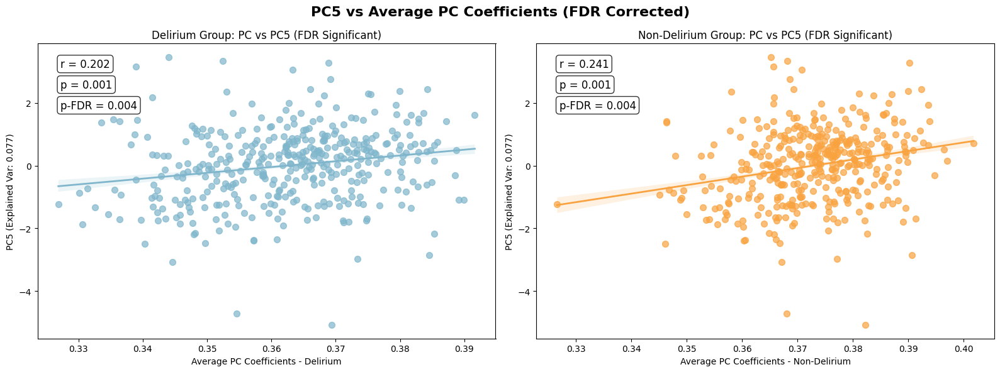

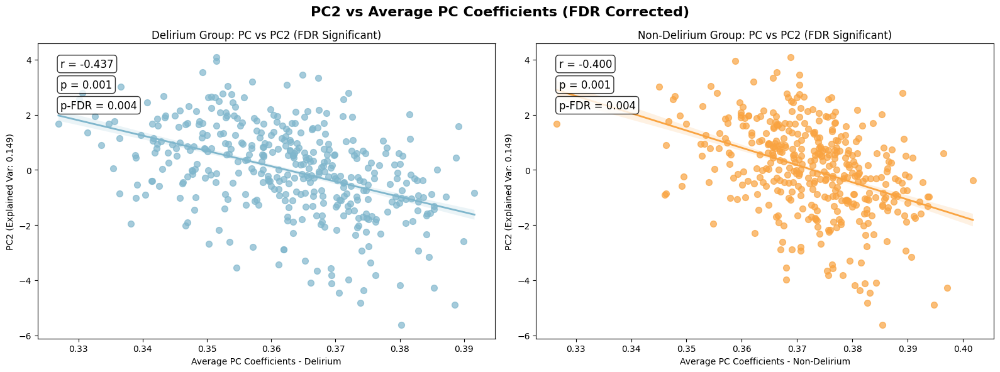

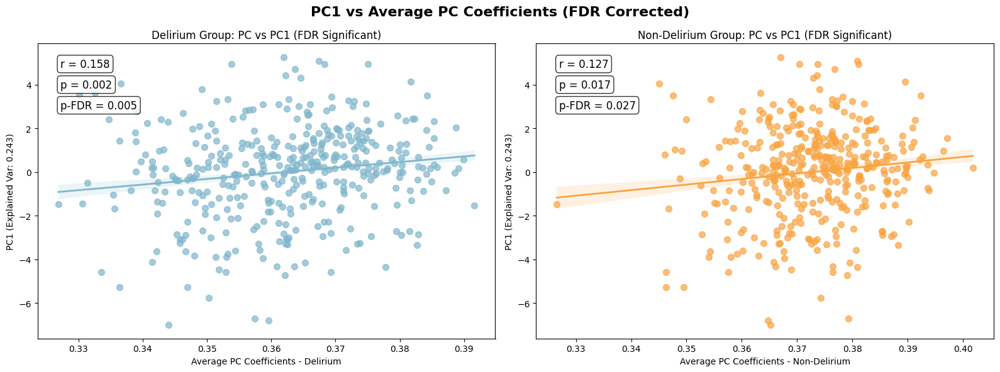

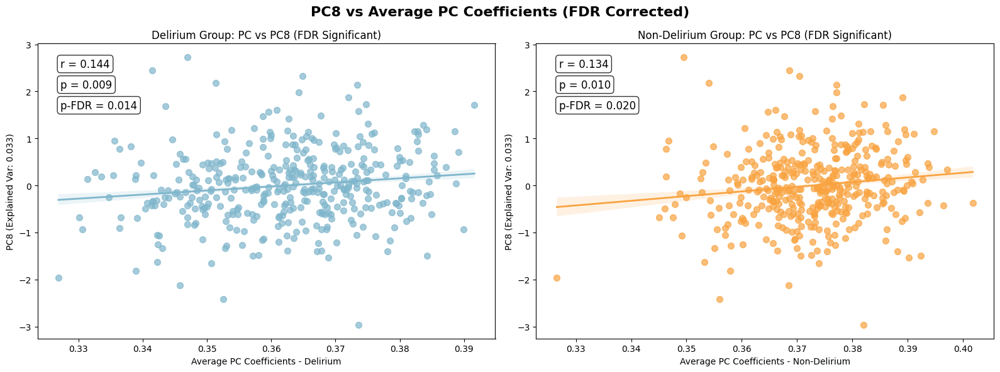

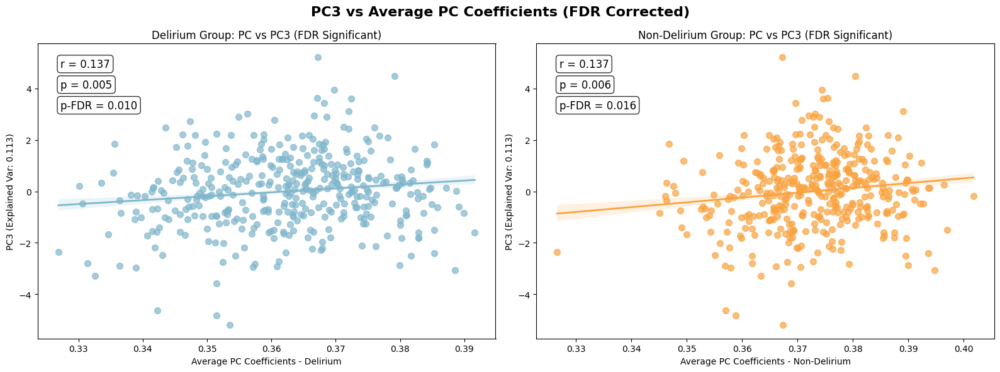

In [55]:
#find significant results based on FDR correction
from statsmodels.stats.multitest import multipletests
# FDR correction for multiple comparisons
name_suffix ='Avg PC'

# Apply FDR correction to delirium p-values
rejected_del, pvals_fdr_del, _, _ = multipletests(
    pca_correlation_results['Delirium_P_Value'], 
    alpha=0.05, 
    method='fdr_bh'
)

# Apply FDR correction to non-delirium p-values
rejected_nondel, pvals_fdr_nondel, _, _ = multipletests(
    pca_correlation_results['NonDelirium_P_Value'], 
    alpha=0.05, 
    method='fdr_bh'
)

# Add FDR-corrected results to the DataFrame
pca_correlation_results['Delirium_P_FDR'] = pvals_fdr_del
pca_correlation_results['Delirium_Significant_FDR'] = rejected_del
pca_correlation_results['NonDelirium_P_FDR'] = pvals_fdr_nondel
pca_correlation_results['NonDelirium_Significant_FDR'] = rejected_nondel

# Show only FDR-significant results
fdr_significant_del = pca_correlation_results[pca_correlation_results['Delirium_Significant_FDR']]
fdr_significant_nondel = pca_correlation_results[pca_correlation_results['NonDelirium_Significant_FDR']]

if len(fdr_significant_del) > 0:
    print(f"\nFDR-Significant PCs in Delirium Group:")
    print(fdr_significant_del[['PC', 'Delirium_Correlation', 'Delirium_P_Value', 'Delirium_P_FDR']].round(4))

if len(fdr_significant_nondel) > 0:
    print(f"\nFDR-Significant PCs in Non-Delirium Group:")
    print(fdr_significant_nondel[['PC', 'NonDelirium_Correlation', 'NonDelirium_P_Value', 'NonDelirium_P_FDR']].round(4))

# Create scatter plots only for FDR-significant principal components
significant_pcs = set()

# Collect all FDR-significant PCs from both groups
if len(fdr_significant_del) > 0:
    significant_pcs.update(fdr_significant_del['PC'].values)
if len(fdr_significant_nondel) > 0:
    significant_pcs.update(fdr_significant_nondel['PC'].values)

print(f"Creating plots for {len(significant_pcs)} FDR-significant PCs: {list(significant_pcs)}")

# Create side-by-side scatter plots for FDR-significant principal components
# Create side-by-side scatter plots for FDR-significant principal components
for pc_name in significant_pcs:
    pc_index = list(ach_pca_selected.columns).index(pc_name)
    pc_values = ach_pca_selected[pc_name].values
    
    # Get correlation values and FDR results for this PC
    pc_row = pca_correlation_results[pca_correlation_results['PC'] == pc_name].iloc[0]
    
    rho_del = pc_row['Delirium_Correlation']
    pval_del = pc_row['Delirium_P_Value']
    pval_fdr_del = pc_row['Delirium_P_FDR']
    sig_fdr_del = pc_row['Delirium_Significant_FDR']
    
    rho_nondel = pc_row['NonDelirium_Correlation']
    pval_nondel = pc_row['NonDelirium_P_Value']
    pval_fdr_nondel = pc_row['NonDelirium_P_FDR']
    sig_fdr_nondel = pc_row['NonDelirium_Significant_FDR']
    
    # Create side-by-side plots  <-- NOW INSIDE THE LOOP
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))

    # Plot for Delirium group
    color_del = '#7fb6cc' if sig_fdr_del else '#cccccc'
    sns.regplot(x=mean_pc_del, y=pc_values, ax=axes[0], 
                color=color_del, scatter_kws={'alpha': 0.7, 's': 50},
                line_kws={'linewidth': 2}, ci=68)

    title_del = f'Delirium Group: PC vs {pc_name}'
    if sig_fdr_del:
        title_del += ' (FDR Significant)'

    axes[0].set_xlabel('Average PC Coefficients - Delirium')
    axes[0].set_ylabel(f'{pc_name} (Explained Var: {pca.explained_variance_ratio_[pc_index]:.3f})')
    axes[0].set_title(title_del)
    axes[0].grid(False)

    axes[0].text(0.05, 0.95, f'r = {rho_del:.3f}', transform=axes[0].transAxes, 
                 fontsize=12, verticalalignment='top', 
                 bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    axes[0].text(0.05, 0.88, f'p = {pval_del:.3f}', transform=axes[0].transAxes, 
                 fontsize=12, verticalalignment='top', 
                 bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    axes[0].text(0.05, 0.81, f'p-FDR = {pval_fdr_del:.3f}', transform=axes[0].transAxes, 
                 fontsize=12, verticalalignment='top', 
                 bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

    # Plot for Non-Delirium group
    color_nondel = '#f9a340' if sig_fdr_nondel else '#cccccc'
    sns.regplot(x=mean_pc_nondel, y=pc_values, ax=axes[1], 
                color=color_nondel, scatter_kws={'alpha': 0.7, 's': 50},
                line_kws={'linewidth': 2}, ci=68)

    title_nondel = f'Non-Delirium Group: PC vs {pc_name}'
    if sig_fdr_nondel:
        title_nondel += ' (FDR Significant)'

    axes[1].set_xlabel('Average PC Coefficients - Non-Delirium')
    axes[1].set_ylabel(f'{pc_name} (Explained Var: {pca.explained_variance_ratio_[pc_index]:.3f})')
    axes[1].set_title(title_nondel)
    axes[1].grid(False)

    axes[1].text(0.05, 0.95, f'r = {rho_nondel:.3f}', transform=axes[1].transAxes, 
                 fontsize=12, verticalalignment='top', 
                 bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    axes[1].text(0.05, 0.88, f'p = {pval_nondel:.3f}', transform=axes[1].transAxes, 
                 fontsize=12, verticalalignment='top', 
                 bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    axes[1].text(0.05, 0.81, f'p-FDR = {pval_fdr_nondel:.3f}', transform=axes[1].transAxes, 
                 fontsize=12, verticalalignment='top', 
                 bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

    fig.suptitle(f'{pc_name} vs Average PC Coefficients (FDR Corrected)', fontsize=16, fontweight='bold')
    plt.tight_layout()

    # Save the figure  <-- ALSO INSIDE THE LOOP
    plt.savefig(f'/Users/ntaylor/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/Postdoc_Rob/Analysis/Graph_Theory/schaef_400/csf_regress_redo/Gene_Expression_Neuromaps/{pc_name}_PCA_vs_avg_pc_grouped_FDR.svg', 
                format='svg', bbox_inches='tight')
    plt.show()
    plt.close(fig)  # Close to free memory between iterations


Using first 8 components for correlation analysis
PCA Component Correlations with Brain Connectivity:
    PC  Delirium_Correlation  Delirium_P_Value  NonDelirium_Correlation  \
0  PC1                0.0826            0.1149                   0.0595   
1  PC2               -0.3445            0.0010                  -0.3168   
2  PC3               -0.2871            0.0010                  -0.2851   
3  PC4               -0.0623            0.2188                  -0.0881   
4  PC5                0.0534            0.3067                   0.0184   
5  PC6                0.1926            0.0010                   0.2197   
6  PC7                0.0139            0.7802                   0.0115   
7  PC8                0.0158            0.7702                   0.0120   

   NonDelirium_P_Value  Explained_Variance  
0               0.2587              0.2739  
1               0.0010              0.1378  
2               0.0010              0.1276  
3               0.0749              0.1088

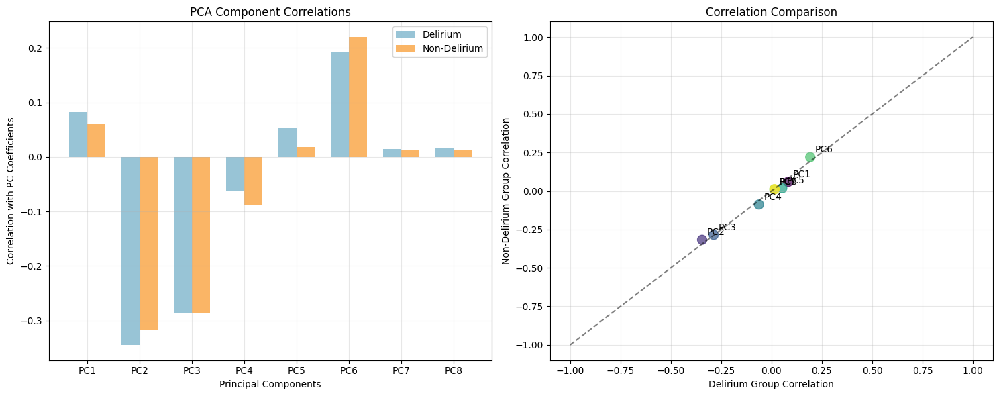

In [28]:
# Correlate PCA components with your brain measures
# Using the first few principal components that explain most variance

# Select the number of components to use (e.g., components explaining 80% of variance)
n_components_use = 8
ach_pca_selected = ach_pca_df.iloc[:, :n_components_use]

print(f"Using first {n_components_use} components for correlation analysis")

# Correlate with your connectivity measures
correlations_pca_del = []
pvalues_pca_del = []
correlations_pca_nondel = []
pvalues_pca_nondel = []

for i, pc_name in enumerate(ach_pca_selected.columns):
    pc_values = ach_pca_selected[pc_name].values
    
    # Correlate with delirium group
    rho_del, pval_del = stats.permtest_pearsonr(mean_pc_del, pc_values)
    correlations_pca_del.append(rho_del)
    pvalues_pca_del.append(pval_del)
    
    # Correlate with non-delirium group
    rho_nondel, pval_nondel = stats.permtest_pearsonr(mean_pc_nondel, pc_values)
    correlations_pca_nondel.append(rho_nondel)
    pvalues_pca_nondel.append(pval_nondel)

# Create results dataframe
pca_correlation_results = pd.DataFrame({
    'PC': ach_pca_selected.columns,
    'Delirium_Correlation': correlations_pca_del,
    'Delirium_P_Value': pvalues_pca_del,
    'NonDelirium_Correlation': correlations_pca_nondel,
    'NonDelirium_P_Value': pvalues_pca_nondel,
    'Explained_Variance': pca.explained_variance_ratio_[:n_components_use]
})

print("PCA Component Correlations with Brain Connectivity:")
print(pca_correlation_results.round(4))

# Visualization 3: PCA correlation results
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# Bar plot of correlations
x_pos = np.arange(len(ach_pca_selected.columns))
width = 0.35

axes[0].bar(x_pos - width/2, correlations_pca_del, width, 
           label='Delirium', alpha=0.8, color='#7fb6cc')
axes[0].bar(x_pos + width/2, correlations_pca_nondel, width, 
           label='Non-Delirium', alpha=0.8, color='#f9a340')
axes[0].set_xlabel('Principal Components')
axes[0].set_ylabel('Correlation with PC Coefficients')
axes[0].set_title('PCA Component Correlations')
axes[0].set_xticks(x_pos)
axes[0].set_xticklabels(ach_pca_selected.columns)
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Scatter plot comparing groups
axes[1].scatter(correlations_pca_del, correlations_pca_nondel, 
               s=100, alpha=0.7, c=range(len(correlations_pca_del)), cmap='viridis')
axes[1].set_xlabel('Delirium Group Correlation')
axes[1].set_ylabel('Non-Delirium Group Correlation')
axes[1].set_title('Correlation Comparison')
axes[1].plot([-1, 1], [-1, 1], 'k--', alpha=0.5)
axes[1].grid(True, alpha=0.3)

# Add PC labels
for i, pc in enumerate(ach_pca_selected.columns):
    axes[1].annotate(pc, (correlations_pca_del[i], correlations_pca_nondel[i]), 
                    xytext=(5, 5), textcoords='offset points')

plt.tight_layout()
plt.show()

In [61]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr
from netneurotools import stats

# Calculate the observed correlation
#observed_correlations = [pearsonr(analyse_data, receptor_data[:, i])[0] for i in range(receptor_data.shape[1])]

analyse_data = mean_pc_del  # Use the second column of lda_coeff as analyse_data
[corr,pvalue]=stats.permtest_pearsonr(analyse_data,ach_gene_data, n_perm=1000)

# Create a DataFrame for easier plotting
correlation_permuted = pd.DataFrame({
    'Gene': ach_gene_data.columns,
    'Correlation': corr,
    'P-Value Permuted': pvalue
})

# Define the significance threshold
significance_threshold = 0.05

# Filter the DataFrame for significant results
significant_results = correlation_permuted[correlation_permuted['P-Value Permuted'] < significance_threshold]

# Print the filtered DataFrame
print(correlation_permuted)
#print(significant_results)

       Gene  Correlation  P-Value Permuted
0      ACHE    -0.069760          0.153846
1      BCHE    -0.304792          0.000999
2      CHAT     0.043320          0.385614
3     CHRM1     0.058910          0.244755
4     CHRM2    -0.018380          0.715285
5     CHRM3    -0.078542          0.120879
6     CHRM4    -0.172153          0.000999
7     CHRM5    -0.002663          0.965035
8    CHRNA2     0.385026          0.000999
9    CHRNA3    -0.303180          0.000999
10   CHRNA4    -0.094917          0.065934
11   CHRNA6    -0.110889          0.022977
12   CHRNA7    -0.068223          0.175824
13   CHRNB1    -0.313542          0.000999
14   CHRNB2    -0.000992          0.980020
15  SLC44A1     0.004019          0.949051
16  SLC44A2    -0.282899          0.000999
17  SLC44A5     0.410007          0.000999


In [62]:
# FDR correction for multiple comparisons
from statsmodels.stats.multitest import multipletests

name_suffix = 'Combined Avg PC'

# Combine both datasets
# Concatenate the delirium and non-delirium data horizontally (add them together)
combined_pc_data = np.concatenate([avg_pc_del, avg_pc_nondel], axis=0)
 # Average of both groups
avg_combined_pc_data = np.mean(combined_pc_data, axis=0)
print(f"Combined dataset shape: {avg_combined_pc_data.shape}")
print(f"Original delirium data shape: {mean_pc_del.shape}")
print(f"Original non-delirium data shape: {mean_pc_nondel.shape}")

# Calculate the correlation between combined PC data and receptor_data
[correlations_combined, pvalue_combined] = stats.permtest_pearsonr(avg_combined_pc_data[0:400], ach_gene_data, n_perm=1000)

# Apply FDR correction to the combined analysis
rejected_combined, pvals_fdr_combined, _, _ = multipletests(
    pvalue_combined, 
    alpha=0.05, 
    method='fdr_bh'
)

# Create DataFrame for the combined results
correlation_df_combined_pc = pd.DataFrame({
    'Gene': ach_gene_data.columns,
    'Correlation': correlations_combined,
    'P-Value Permuted': pvalue_combined,
    'P-Value FDR Corrected': pvals_fdr_combined,
    'Significant After FDR': rejected_combined
})

# Print results for combined analysis
print("\nCOMBINED ANALYSIS RESULTS:")
print(f"Uncorrected significant genes: {np.sum(pvalue_combined < 0.05)}")
print(f"FDR-corrected significant genes: {np.sum(rejected_combined)}")

# Show significant results after FDR correction
significant_results_fdr_combined = correlation_df_combined_pc[correlation_df_combined_pc['Significant After FDR']]

print("\nCOMBINED - FDR Significant Results:")
print(significant_results_fdr_combined)

# Display the correlation dataframe sorted by correlation strength
print("\nAll correlations (sorted by absolute correlation strength):")
correlation_df_combined_sorted = correlation_df_combined_pc.copy()
correlation_df_combined_sorted['Abs_Correlation'] = np.abs(correlation_df_combined_sorted['Correlation'])
correlation_df_combined_sorted = correlation_df_combined_sorted.sort_values('Abs_Correlation', ascending=False)
print(correlation_df_combined_sorted.drop('Abs_Correlation', axis=1))

Combined dataset shape: (502,)
Original delirium data shape: (400,)
Original non-delirium data shape: (400,)

COMBINED ANALYSIS RESULTS:
Uncorrected significant genes: 8
FDR-corrected significant genes: 7

COMBINED - FDR Significant Results:
       Gene  Correlation  P-Value Permuted  P-Value FDR Corrected  \
1      BCHE    -0.295683          0.000999               0.002997   
6     CHRM4    -0.151765          0.001998               0.005138   
8    CHRNA2     0.403845          0.000999               0.002997   
9    CHRNA3    -0.318593          0.000999               0.002997   
13   CHRNB1    -0.310756          0.000999               0.002997   
16  SLC44A2    -0.251922          0.000999               0.002997   
17  SLC44A5     0.400644          0.000999               0.002997   

    Significant After FDR  
1                    True  
6                    True  
8                    True  
9                    True  
13                   True  
16                   True  
17       

Generating plots for FDR significant genes in COMBINED analysis...
Number of FDR significant genes in combined analysis: 7


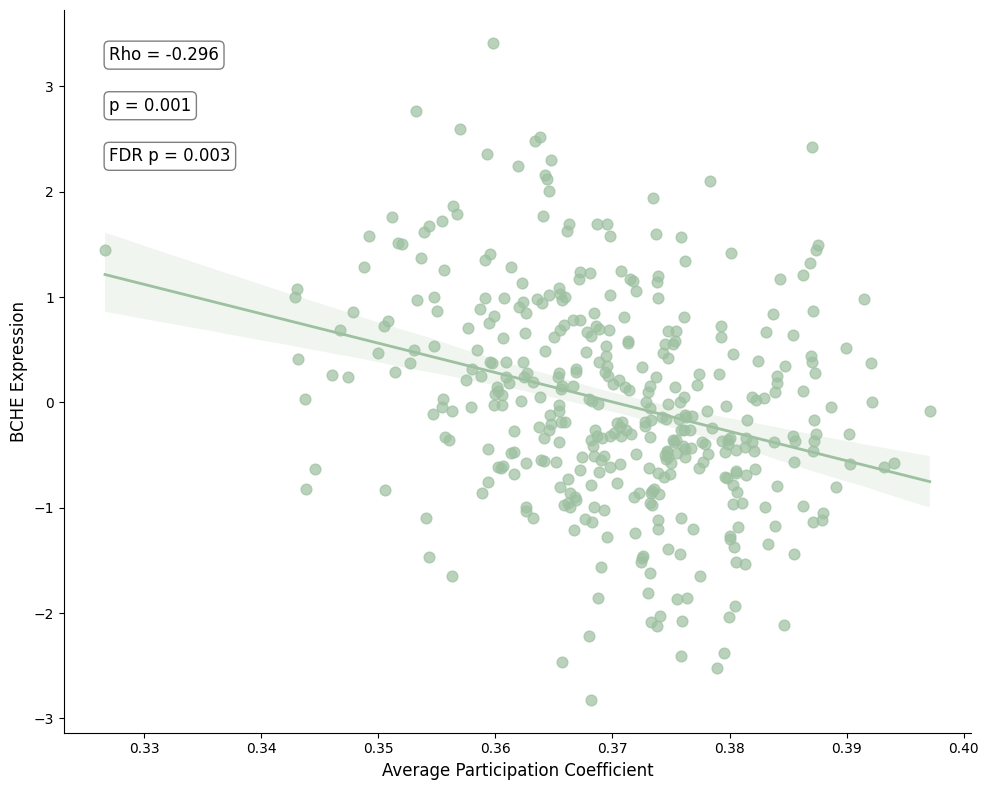

Generated plot for BCHE: Rho = -0.296, FDR p = 0.003


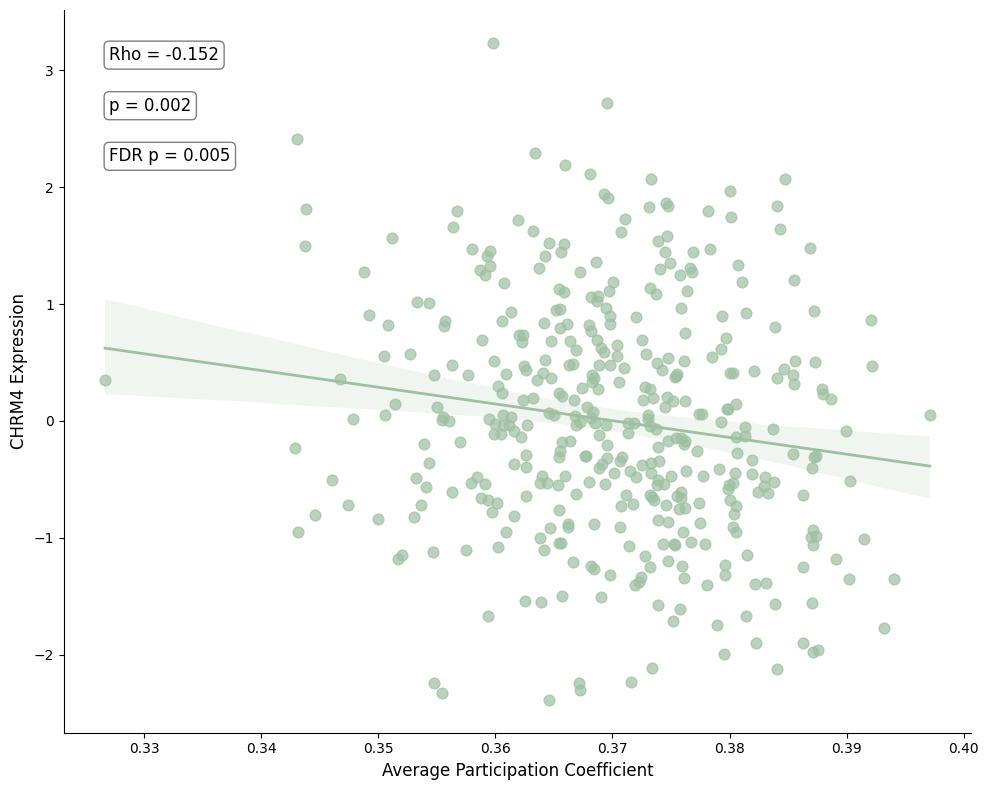

Generated plot for CHRM4: Rho = -0.152, FDR p = 0.005


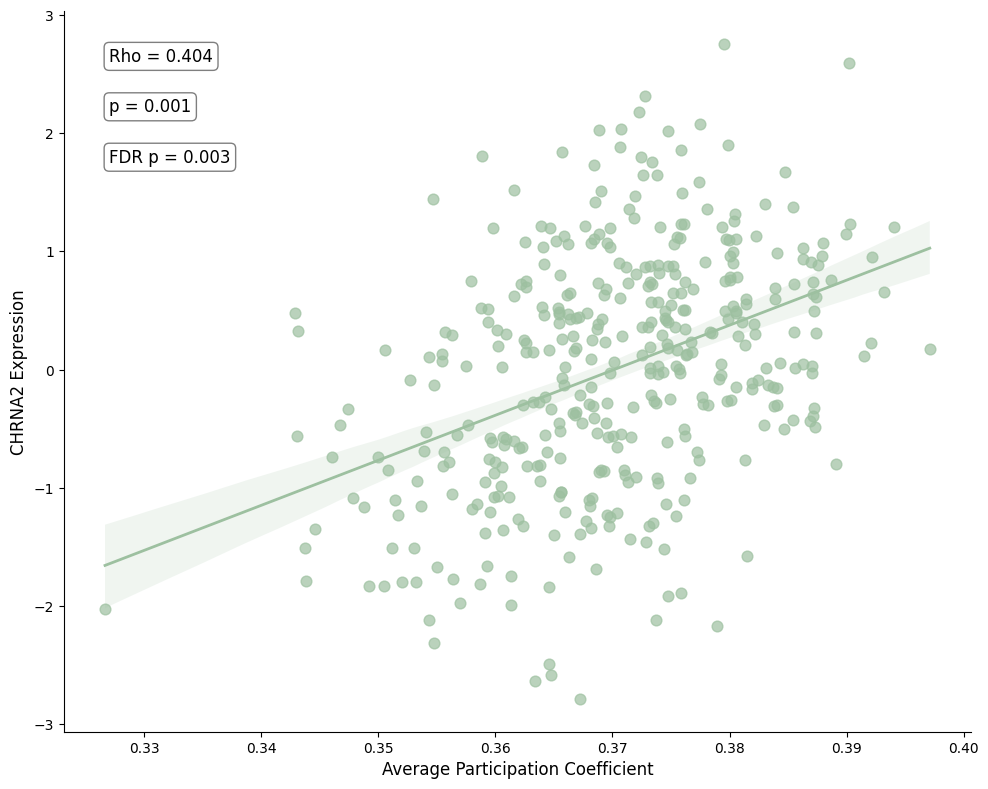

Generated plot for CHRNA2: Rho = 0.404, FDR p = 0.003


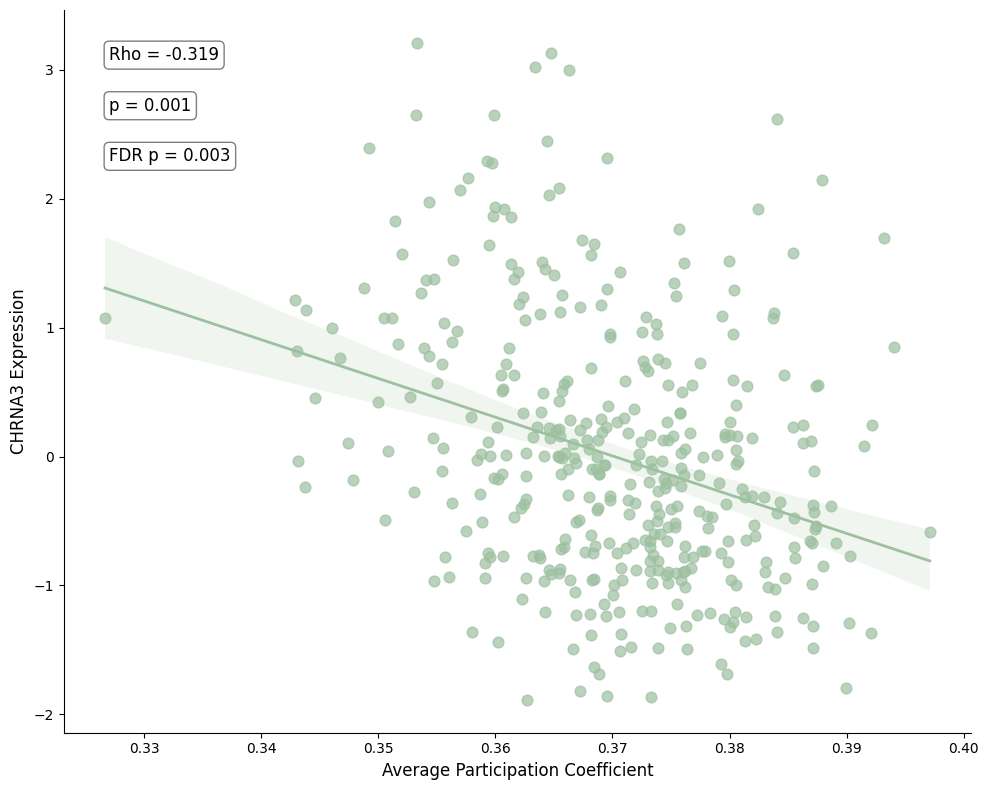

Generated plot for CHRNA3: Rho = -0.319, FDR p = 0.003


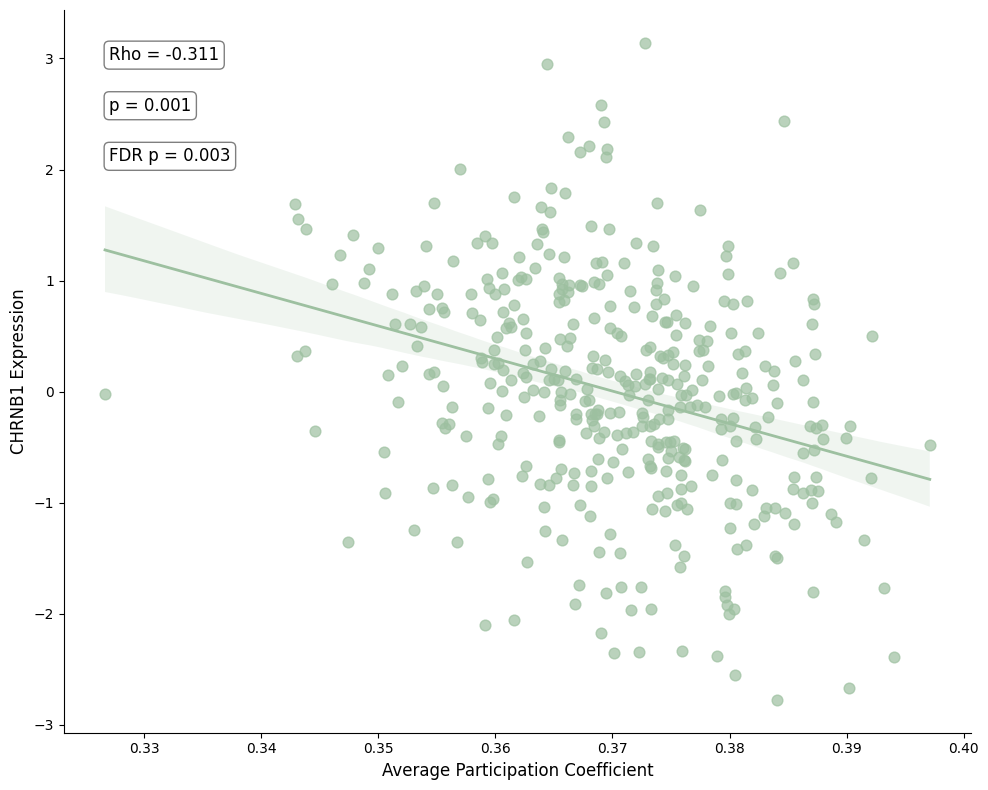

Generated plot for CHRNB1: Rho = -0.311, FDR p = 0.003


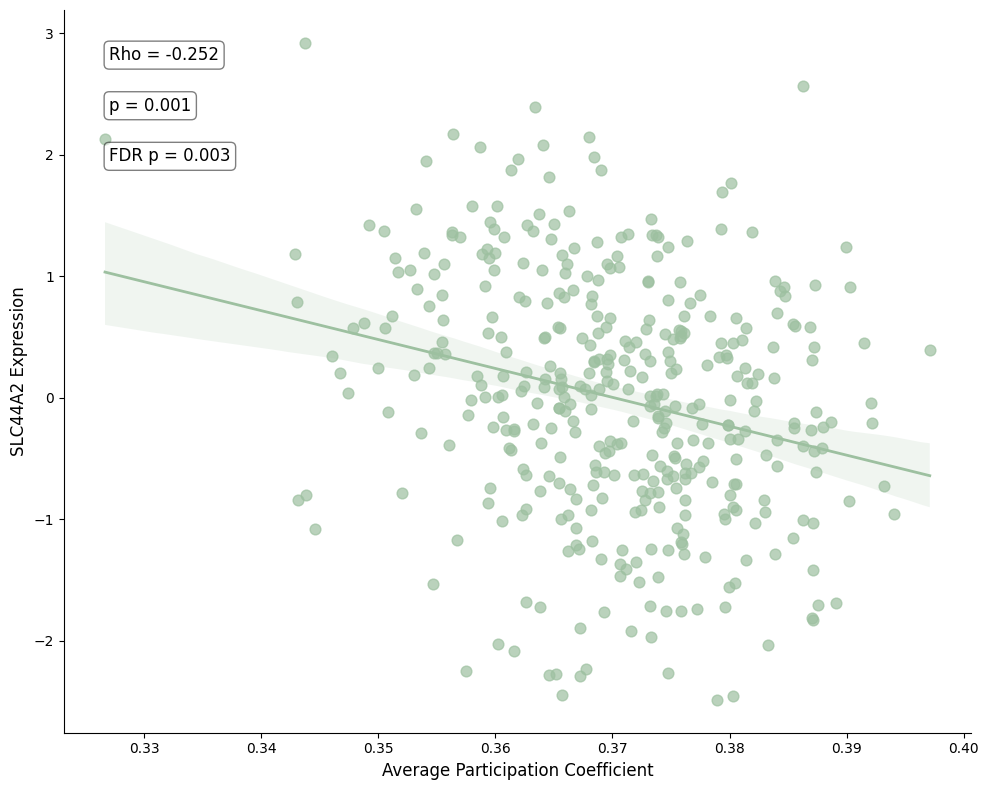

Generated plot for SLC44A2: Rho = -0.252, FDR p = 0.003


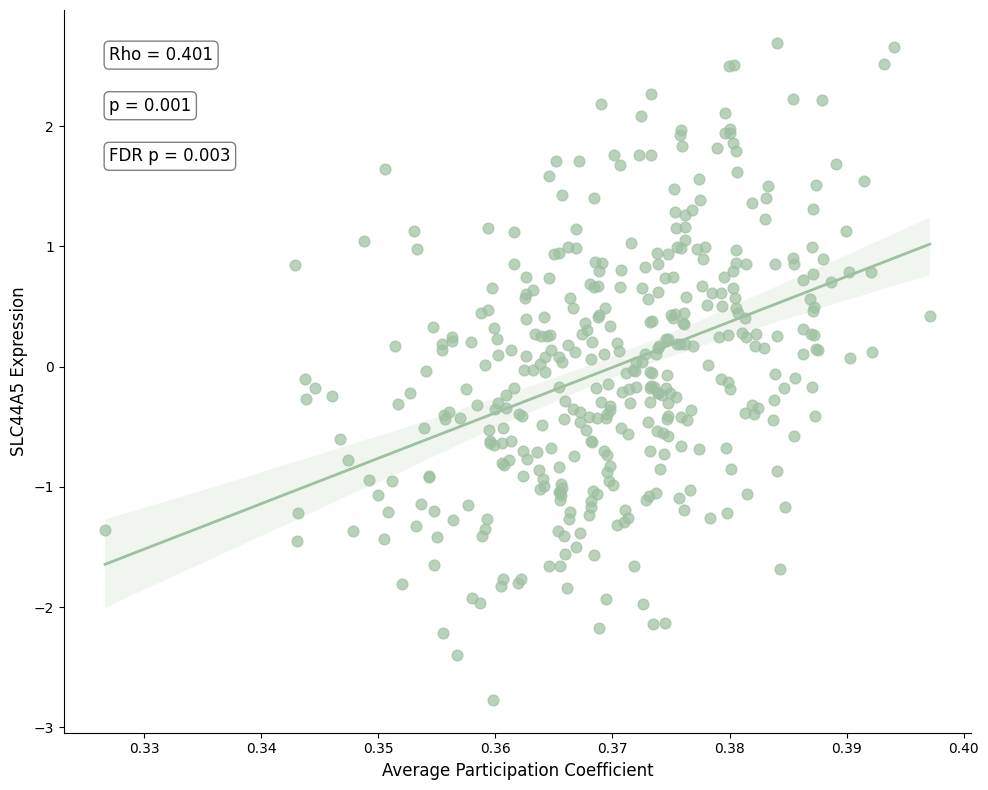

Generated plot for SLC44A5: Rho = 0.401, FDR p = 0.003
Generated plots for 7 FDR significant genes in combined analysis.

SUMMARY OF FDR SIGNIFICANT RELATIONSHIPS:
BCHE: Rho = -0.296, FDR p-value = 0.003
CHRM4: Rho = -0.152, FDR p-value = 0.005
CHRNA2: Rho = 0.404, FDR p-value = 0.003
CHRNA3: Rho = -0.319, FDR p-value = 0.003
CHRNB1: Rho = -0.311, FDR p-value = 0.003
SLC44A2: Rho = -0.252, FDR p-value = 0.003
SLC44A5: Rho = 0.401, FDR p-value = 0.003


In [64]:
# plot the combined scatter plots for all significant genes
# Plot ONLY FDR corrected significant relationships for combined data
print("Generating plots for FDR significant genes in COMBINED analysis...")

# Get only the FDR significant genes from the combined analysis
significant_genes_combined = significant_results_fdr_combined['Gene'].tolist()

print(f"Number of FDR significant genes in combined analysis: {len(significant_genes_combined)}")

if len(significant_genes_combined) == 0:
    print("No genes are FDR significant in the combined analysis.")
else:
    for gene in significant_genes_combined:
        # Create single plot for combined data
        fig, ax = plt.subplots(1, 1, figsize=(10, 8))
        
        # Plot for Combined Avg. PC Data
        sns.regplot(x=avg_combined_pc_data[0:400], y=ach_gene_data[gene], ax=ax, 
                    scatter_kws={'color': '#9dc0a0', 'alpha': 0.7, 's': 60}, 
                    line_kws={'color': '#9dc0a0', 'linewidth': 2})
        
        ax.set_xlabel('Average Participation Coefficient', fontsize=12)
        ax.set_ylabel(f'{gene} Expression', fontsize=12)
        #ax.set_title(f'FDR SIGNIFICANT: Combined Avg PC vs {gene}', fontsize=14, fontweight='bold')
        
        # Get correlation and p-value for this gene from the combined results
        gene_row = significant_results_fdr_combined[significant_results_fdr_combined['Gene'] == gene]
        rho_combined = gene_row['Correlation'].values[0]
        pval_combined = gene_row['P-Value Permuted'].values[0]
        pval_fdr_combined = gene_row['P-Value FDR Corrected'].values[0]
        
        # Add correlation and p-value text
        ax.text(0.05, 0.95, f'Rho = {rho_combined:.3f}', transform=ax.transAxes, 
                fontsize=12, verticalalignment='top', color='black', fontweight='regular',
                bbox=dict(boxstyle='round', facecolor ='white', alpha=0.5))
        ax.text(0.05, 0.88, f'p = {pval_combined:.3f}', transform=ax.transAxes, 
                fontsize=12, verticalalignment='top', color='black', fontweight='regular',
                bbox=dict(boxstyle='round',facecolor ='white', alpha=0.5))
        ax.text(0.05, 0.81, f'FDR p = {pval_fdr_combined:.3f}', transform=ax.transAxes, 
                fontsize=12, verticalalignment='top', color='black', fontweight='regular',
                bbox=dict(boxstyle='round',facecolor ='white', alpha=0.5))
          

        # Add grid for better readability
        ax.grid(False)
        
        # Improve aesthetics
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.tick_params(axis='both', which='major', labelsize=10)
        
        plt.tight_layout()
        
        # Save plot
        plt.savefig(f'/Users/ntaylor/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/Postdoc_Rob/Analysis/Graph_Theory/schaef_400/csf_regress_redo/Gene_Expression_Neuromaps/{gene}_combined_avg_pc_FDR_SIG.svg', 
                    format='svg', bbox_inches='tight', dpi=300)
        plt.show()
        
        print(f"Generated plot for {gene}: Rho = {rho_combined:.3f}, FDR p = {pval_fdr_combined:.3f}")
    
    print(f"Generated plots for {len(significant_genes_combined)} FDR significant genes in combined analysis.")

# Summary of significant relationships
if len(significant_genes_combined) > 0:
    print("\nSUMMARY OF FDR SIGNIFICANT RELATIONSHIPS:")
    print("=" * 60)
    for gene in significant_genes_combined:
        gene_row = significant_results_fdr_combined[significant_results_fdr_combined['Gene'] == gene]
        rho = gene_row['Correlation'].values[0]
        pval_fdr = gene_row['P-Value FDR Corrected'].values[0]
        print(f"{gene}: Rho = {rho:.3f}, FDR p-value = {pval_fdr:.3f}")

COMPARISON: SEPARATE vs COMBINED ANALYSIS

SEPARATE ANALYSIS:
  Delirium group - FDR significant genes: 7
  Non-delirium group - FDR significant genes: 7

COMBINED ANALYSIS:
  Combined dataset - FDR significant genes: 7

Genes significant in ANY analysis (sorted by combined FDR p-value):
       Gene  Correlation_Delirium  Correlation_NonDelirium  \
1      BCHE             -0.304792                -0.274108   
8    CHRNA2              0.385026                 0.387651   
9    CHRNA3             -0.303180                -0.306057   
13   CHRNB1             -0.313542                -0.290963   
16  SLC44A2             -0.282899                -0.223684   
17  SLC44A5              0.410007                 0.372676   
6     CHRM4             -0.172153                -0.134021   

    Correlation_Combined  P_FDR_Delirium  P_FDR_NonDelirium  P_FDR_Combined  \
1              -0.295683        0.002569           0.002997        0.002997   
8               0.403845        0.002569           0.002

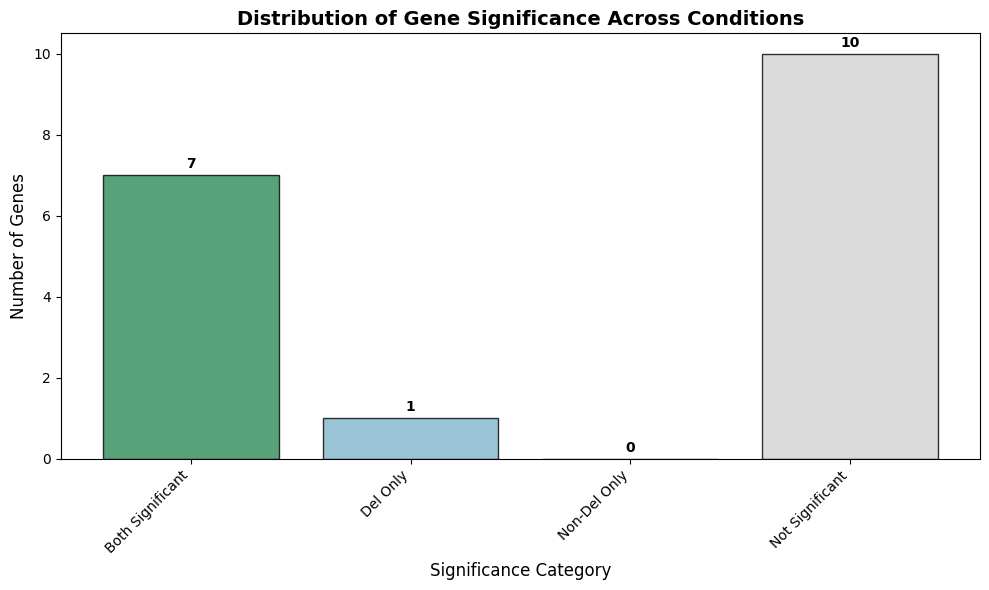

In [66]:
# Comparison between separate group analyses and combined analysis
print("=" * 80)
print("COMPARISON: SEPARATE vs COMBINED ANALYSIS")
print("=" * 80)

# Run the separate analyses again to ensure we have the results
[correlations_del,pvalue_del]=stats.permtest_pearsonr(mean_pc_del,ach_gene_data, n_perm=1000)
[correlations_nondel,pvalue_nondel]=stats.permtest_pearsonr(mean_pc_nondel,ach_gene_data, n_perm=1000)

# Apply FDR correction to both separate groups
rejected_del, pvals_fdr_del, _, _ = multipletests(pvalue_del, alpha=0.05, method='fdr_bh')
rejected_nondel, pvals_fdr_nondel, _, _ = multipletests(pvalue_nondel, alpha=0.05, method='fdr_bh')

print(f"\nSEPARATE ANALYSIS:")
print(f"  Delirium group - FDR significant genes: {np.sum(rejected_del)}")
print(f"  Non-delirium group - FDR significant genes: {np.sum(rejected_nondel)}")

print(f"\nCOMBINED ANALYSIS:")
print(f"  Combined dataset - FDR significant genes: {np.sum(rejected_combined)}")

# Create a comprehensive comparison table
comparison_df = pd.DataFrame({
    'Gene': ach_gene_data.columns,
    'Correlation_Delirium': correlations_del,
    'Correlation_NonDelirium': correlations_nondel,
    'Correlation_Combined': correlations_combined,
    'P_FDR_Delirium': pvals_fdr_del,
    'P_FDR_NonDelirium': pvals_fdr_nondel,
    'P_FDR_Combined': pvals_fdr_combined,
    'Sig_Delirium': rejected_del,
    'Sig_NonDelirium': rejected_nondel,
    'Sig_Combined': rejected_combined
})

# Show genes that are significant in any analysis
any_significant = comparison_df[
    (comparison_df['Sig_Delirium']) | 
    (comparison_df['Sig_NonDelirium']) | 
    (comparison_df['Sig_Combined'])
].sort_values('P_FDR_Combined')

print(f"\nGenes significant in ANY analysis (sorted by combined FDR p-value):")
print(any_significant)
#136/15:
# Summary analysis of gene significance patterns
all_genes = ach_gene_data.columns.tolist()
total_genes = len(all_genes)

# Count different significance categories
genes_sig_del = set(significant_results_del['Gene'].values)
genes_sig_nondel = set(significant_results_nondel['Gene'].values)
genes_sig_both = genes_sig_del.intersection(genes_sig_nondel)
genes_sig_del_only = genes_sig_del - genes_sig_nondel
genes_sig_nondel_only = genes_sig_nondel - genes_sig_del
genes_not_sig = set(all_genes) - genes_sig_del - genes_sig_nondel

print("=" * 60)
print("GENE SIGNIFICANCE SUMMARY")
print("=" * 60)
print(f"Total genes analyzed: {total_genes}")
print(f"Significant in BOTH conditions: {len(genes_sig_both)} ({len(genes_sig_both)/total_genes*100:.1f}%)")
print(f"Significant in DELIRIUM ONLY: {len(genes_sig_del_only)} ({len(genes_sig_del_only)/total_genes*100:.1f}%)")
print(f"Significant in NON-DELIRIUM ONLY: {len(genes_sig_nondel_only)} ({len(genes_sig_nondel_only)/total_genes*100:.1f}%)")
print(f"NOT SIGNIFICANT in either: {len(genes_not_sig)} ({len(genes_not_sig)/total_genes*100:.1f}%)")
print("=" * 60)

if genes_sig_both:
    print(f"Genes significant in BOTH: {sorted(list(genes_sig_both))}")
if genes_sig_del_only:
    print(f"Genes significant in DELIRIUM ONLY: {sorted(list(genes_sig_del_only))}")
if genes_sig_nondel_only:
    print(f"Genes significant in NON-DELIRIUM ONLY: {sorted(list(genes_sig_nondel_only))}")
if genes_not_sig:
    print(f"Non-significant genes: {sorted(list(genes_not_sig))}")

# Create a summary visualization
import matplotlib.pyplot as plt
import numpy as np

categories = ['Both Significant', 'Del Only', 'Non-Del Only', 'Not Significant']
counts = [len(genes_sig_both), len(genes_sig_del_only), len(genes_sig_nondel_only), len(genes_not_sig)]
colors = ['#2E8B57', '#7fb6cc', '#f9a340', '#D3D3D3']

plt.figure(figsize=(10, 6))
bars = plt.bar(categories, counts, color=colors, alpha=0.8, edgecolor='black')
plt.title('Distribution of Gene Significance Across Conditions', fontsize=14, fontweight='bold')
plt.ylabel('Number of Genes', fontsize=12)
plt.xlabel('Significance Category', fontsize=12)

# Add count labels on bars
for bar, count in zip(bars, counts):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.1, 
             str(count), ha='center', va='bottom', fontweight='bold')

plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

Using first 8 components for correlation analysis
PCA Component Correlations with Combined Brain Connectivity:
    PC  Combined_Correlation  Combined_P_Value  Explained_Variance  \
0  PC1                0.1421            0.0070              0.2435   
1  PC2               -0.4291            0.0010              0.1487   
2  PC3                0.1429            0.0050              0.1135   
3  PC4               -0.0529            0.2887              0.0950   
4  PC5                0.2395            0.0010              0.0768   
5  PC6                0.0279            0.5544              0.0675   
6  PC7               -0.0033            0.9441              0.0442   
7  PC8                0.1431            0.0070              0.0331   

   Combined_P_FDR  Combined_Significant_FDR  
0          0.0112                      True  
1          0.0040                      True  
2          0.0112                      True  
3          0.3849                     False  
4          0.0040           

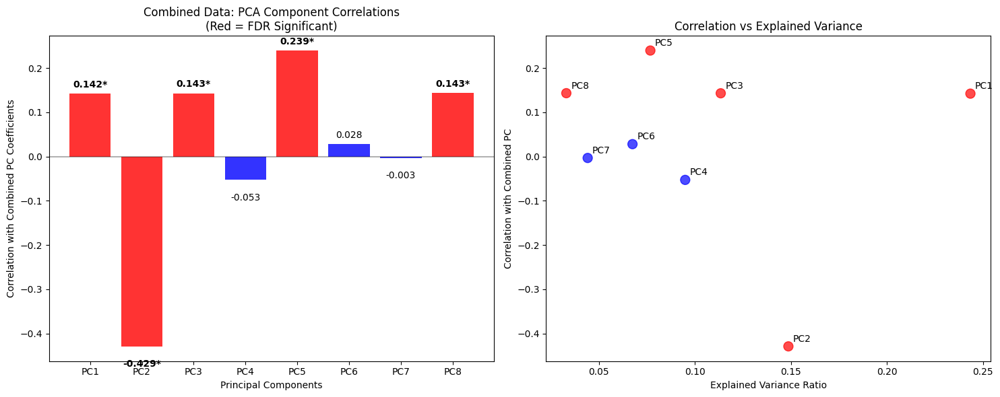


FDR Significant Principal Components (5 total):
PC1: Correlation = 0.142, FDR p-value = 0.011, Explained Variance = 24.3%
PC2: Correlation = -0.429, FDR p-value = 0.004, Explained Variance = 14.9%
PC3: Correlation = 0.143, FDR p-value = 0.011, Explained Variance = 11.3%
PC5: Correlation = 0.239, FDR p-value = 0.004, Explained Variance = 7.7%
PC8: Correlation = 0.143, FDR p-value = 0.011, Explained Variance = 3.3%
Generating plots for 5 FDR-significant principal components...


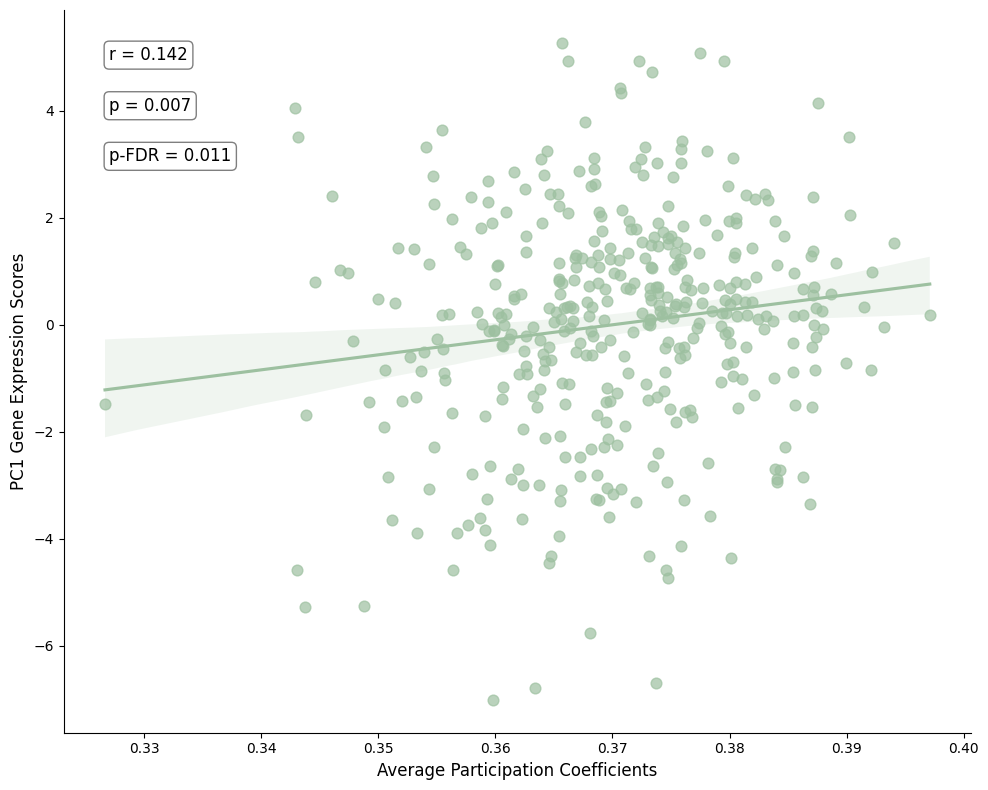

Generated plot for PC1: r = 0.142, FDR p = 0.011


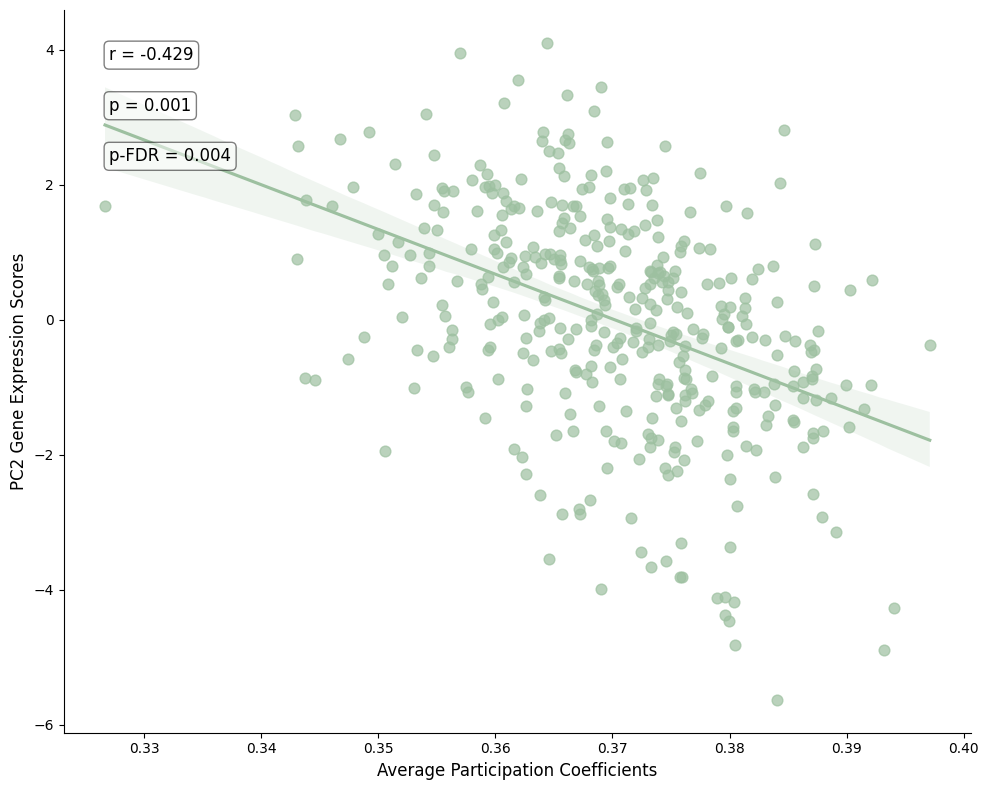

Generated plot for PC2: r = -0.429, FDR p = 0.004


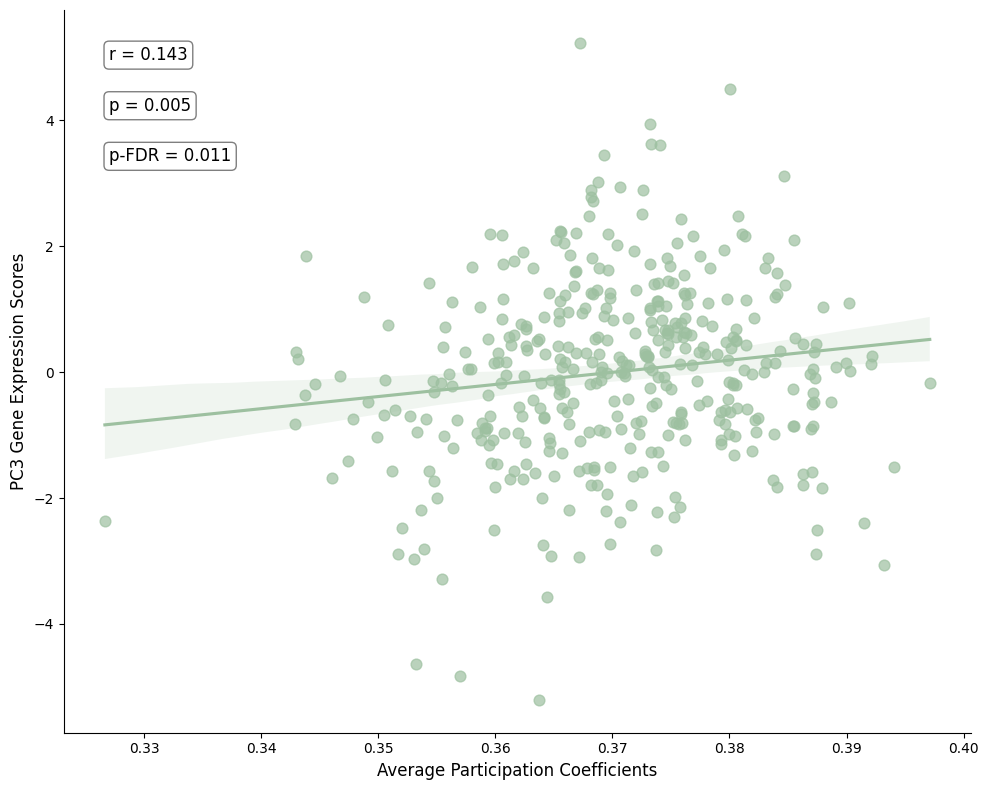

Generated plot for PC3: r = 0.143, FDR p = 0.011


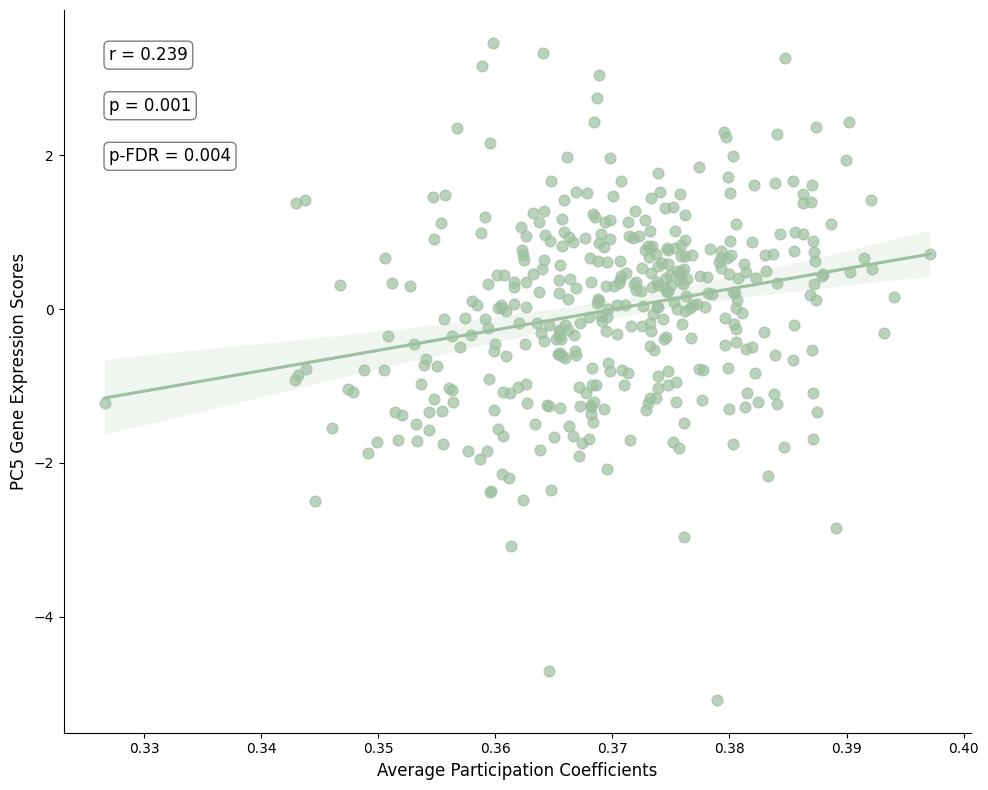

Generated plot for PC5: r = 0.239, FDR p = 0.004


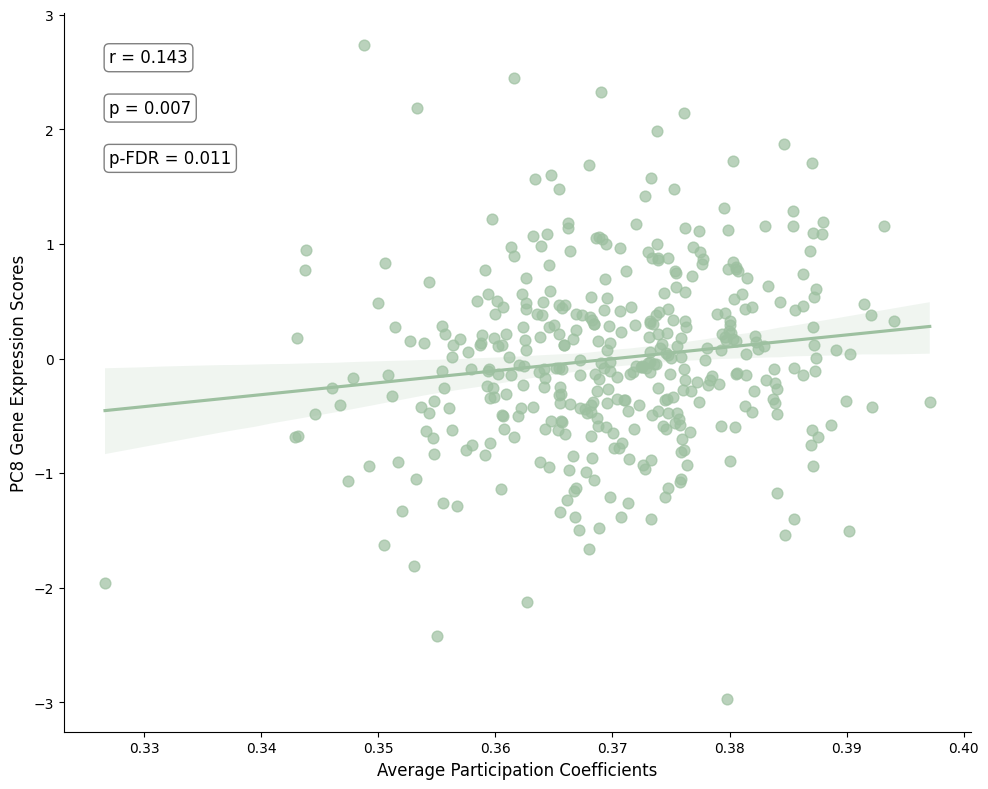

Generated plot for PC8: r = 0.143, FDR p = 0.011
Completed plotting for 5 FDR-significant principal components.


In [68]:
# Select the number of components to use (e.g., components explaining 80% of variance)
n_components_use = 8
ach_pca_selected = ach_pca_df.iloc[:, :n_components_use]

print(f"Using first {n_components_use} components for correlation analysis")

# Correlate with combined connectivity measures
correlations_pca_combined = []
pvalues_pca_combined = []

for i, pc_name in enumerate(ach_pca_selected.columns):
    pc_values = ach_pca_selected[pc_name].values
    
    # Correlate with combined data
    rho_combined, pval_combined = stats.permtest_pearsonr(avg_combined_pc_data[0:400], pc_values)
    correlations_pca_combined.append(rho_combined)
    pvalues_pca_combined.append(pval_combined)

# Create results dataframe
pca_correlation_results_combined = pd.DataFrame({
    'PC': ach_pca_selected.columns,
    'Combined_Correlation': correlations_pca_combined,
    'Combined_P_Value': pvalues_pca_combined,
    'Explained_Variance': pca.explained_variance_ratio_[:n_components_use]
})

# FDR correction for multiple comparisons
rejected_combined, pvals_fdr_combined, _, _ = multipletests(pvalues_pca_combined, alpha=0.05, method='fdr_bh')

# Add FDR results to dataframe
pca_correlation_results_combined['Combined_P_FDR'] = pvals_fdr_combined
pca_correlation_results_combined['Combined_Significant_FDR'] = rejected_combined

print("PCA Component Correlations with Combined Brain Connectivity:")
print(pca_correlation_results_combined.round(4))

# Visualization: PCA correlation results for combined data
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# Bar plot of correlations
x_pos = np.arange(len(ach_pca_selected.columns))
colors = ['red' if sig else 'blue' for sig in rejected_combined]

bars = axes[0].bar(x_pos, correlations_pca_combined, 
                  alpha=0.8, color=colors)
axes[0].set_xlabel('Principal Components')
axes[0].set_ylabel('Correlation with Combined PC Coefficients')
axes[0].set_title('Combined Data: PCA Component Correlations\n(Red = FDR Significant)')
axes[0].set_xticks(x_pos)
axes[0].set_xticklabels(ach_pca_selected.columns)
axes[0].axhline(y=0, color='black', linestyle='-', alpha=0.3)

# Add correlation values on top of bars
for i, (bar, corr, sig) in enumerate(zip(bars, correlations_pca_combined, rejected_combined)):
    height = bar.get_height()
    axes[0].text(bar.get_x() + bar.get_width()/2., height + 0.01 if height > 0 else height - 0.03,
                f'{corr:.3f}{"*" if sig else ""}',
                ha='center', va='bottom' if height > 0 else 'top',
                fontsize=10, fontweight='bold' if sig else 'normal')

# Correlation vs Explained Variance
axes[1].scatter(pca.explained_variance_ratio_[:n_components_use], correlations_pca_combined, 
               s=100, alpha=0.7, c=colors)
axes[1].set_xlabel('Explained Variance Ratio')
axes[1].set_ylabel('Correlation with Combined PC')
axes[1].set_title('Correlation vs Explained Variance')

# Add PC labels
for i, pc in enumerate(ach_pca_selected.columns):
    axes[1].annotate(pc, (pca.explained_variance_ratio_[i], correlations_pca_combined[i]), 
                    xytext=(5, 5), textcoords='offset points')

plt.tight_layout()
plt.savefig('/Users/ntaylor/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/Postdoc_Rob/Analysis/Graph_Theory/schaef_400/csf_regress_redo/Gene_Expression_Neuromaps/corr_8pcs_ach_gene_vs_combined_avg_pc.svg', 
                format='svg', bbox_inches='tight') 
plt.show()

# Print summary of significant components
significant_pcs = pca_correlation_results_combined[pca_correlation_results_combined['Combined_Significant_FDR']]
if len(significant_pcs) > 0:
    print(f"\nFDR Significant Principal Components ({len(significant_pcs)} total):")
    print("=" * 60)
    for _, row in significant_pcs.iterrows():
        print(f"{row['PC']}: Correlation = {row['Combined_Correlation']:.3f}, "
              f"FDR p-value = {row['Combined_P_FDR']:.3f}, "
              f"Explained Variance = {row['Explained_Variance']:.1%}")
else:
    print("\nNo principal components are FDR significant with combined data.")
#136/20:
# Generate correlation plots for each FDR-significant principal component (Combined Analysis)
significant_pcs_combined = pca_correlation_results_combined[pca_correlation_results_combined['Combined_Significant_FDR']]['PC'].tolist()

if len(significant_pcs_combined) == 0:
    print("No FDR-significant principal components found in combined analysis.")
else:
    print(f"Generating plots for {len(significant_pcs_combined)} FDR-significant principal components...")
    
    for current_pc in significant_pcs_combined:
        # Extract principal component data and metadata
        pc_component_index = list(ach_pca_selected.columns).index(current_pc)
        gene_expression_pc_scores = ach_pca_selected[current_pc].values
        
        # Retrieve statistical results for this principal component
        pc_statistics = pca_correlation_results_combined[pca_correlation_results_combined['PC'] == current_pc].iloc[0]
        
        # Extract correlation statistics for combined data
        correlation_combined = pc_statistics['Combined_Correlation']
        pvalue_combined = pc_statistics['Combined_P_Value']
        pvalue_fdr_combined = pc_statistics['Combined_P_FDR']
        explained_variance = pc_statistics['Explained_Variance']
        
        # Create single correlation plot for combined data
        fig, ax = plt.subplots(1, 1, figsize=(10, 8))

        # Plot correlation for combined data
        plot_color_combined = '#9dc0a0'  # Sea green for significant combined results
        sns.regplot(x=avg_combined_pc_data[0:400], y=gene_expression_pc_scores, ax=ax, 
                    color=plot_color_combined, scatter_kws={'alpha': 0.7, 's': 60})

        # Set labels and title
        ax.set_xlabel('Average Participation Coefficients', fontsize=12)
        ax.set_ylabel(f'{current_pc} Gene Expression Scores', fontsize=12)
        #ax.set_title(f'Combined Data: {current_pc} vs Average PC\n(FDR Significant, Explained Variance: {explained_variance:.1%})', 
                     #fontsize=14, fontweight='bold')
        ax.grid(False)
        
        # Add statistical annotations
        ax.text(0.05, 0.95, f'r = {correlation_combined:.3f}', transform=ax.transAxes, 
                 fontsize=12, verticalalignment='top', fontweight='regular',
                 bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
        ax.text(0.05, 0.88, f'p = {pvalue_combined:.3f}', transform=ax.transAxes, 
                 fontsize=12, verticalalignment='top', fontweight='regular',
                 bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
        ax.text(0.05, 0.81, f'p-FDR = {pvalue_fdr_combined:.3f}', transform=ax.transAxes, 
                 fontsize=12, verticalalignment='top', fontweight='regular',
                 bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
        
        # Improve aesthetics
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.tick_params(axis='both', which='major', labelsize=10)

        # Save plot
        plt.tight_layout()
        plt.savefig(f'/Users/ntaylor/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/Postdoc_Rob/Analysis/Graph_Theory/schaef_400/csf_regress_redo/Gene_Expression_Neuromaps/{current_pc}_Combined_GeneExpression_vs_AvgPC_FDR.svg', 
                    format='svg', bbox_inches='tight', dpi=300)
        plt.show()
        
        print(f"Generated plot for {current_pc}: r = {correlation_combined:.3f}, FDR p = {pvalue_fdr_combined:.3f}")

print(f"Completed plotting for {len(significant_pcs_combined)} FDR-significant principal components.")

COMPARISON OF PRINCIPAL COMPONENT CORRELATIONS - COMBINED DATA
Principal Components ranked by correlation strength:
------------------------------------------------------------
PC2: r = -0.4291 ***
    p-value = 0.0010, FDR p-value = 0.0040
    Explained Variance = 0.149 (14.9%)

PC5: r = +0.2395 ***
    p-value = 0.0010, FDR p-value = 0.0040
    Explained Variance = 0.077 (7.7%)

PC8: r = +0.1431 ***
    p-value = 0.0070, FDR p-value = 0.0112
    Explained Variance = 0.033 (3.3%)

PC3: r = +0.1429 ***
    p-value = 0.0050, FDR p-value = 0.0112
    Explained Variance = 0.113 (11.3%)

PC1: r = +0.1421 ***
    p-value = 0.0070, FDR p-value = 0.0112
    Explained Variance = 0.243 (24.3%)

PC4: r = -0.0529 
    p-value = 0.2887, FDR p-value = 0.3849
    Explained Variance = 0.095 (9.5%)

PC6: r = +0.0279 
    p-value = 0.5544, FDR p-value = 0.6337
    Explained Variance = 0.068 (6.8%)

PC7: r = -0.0033 
    p-value = 0.9441, FDR p-value = 0.9441
    Explained Variance = 0.044 (4.4%)

MOST 

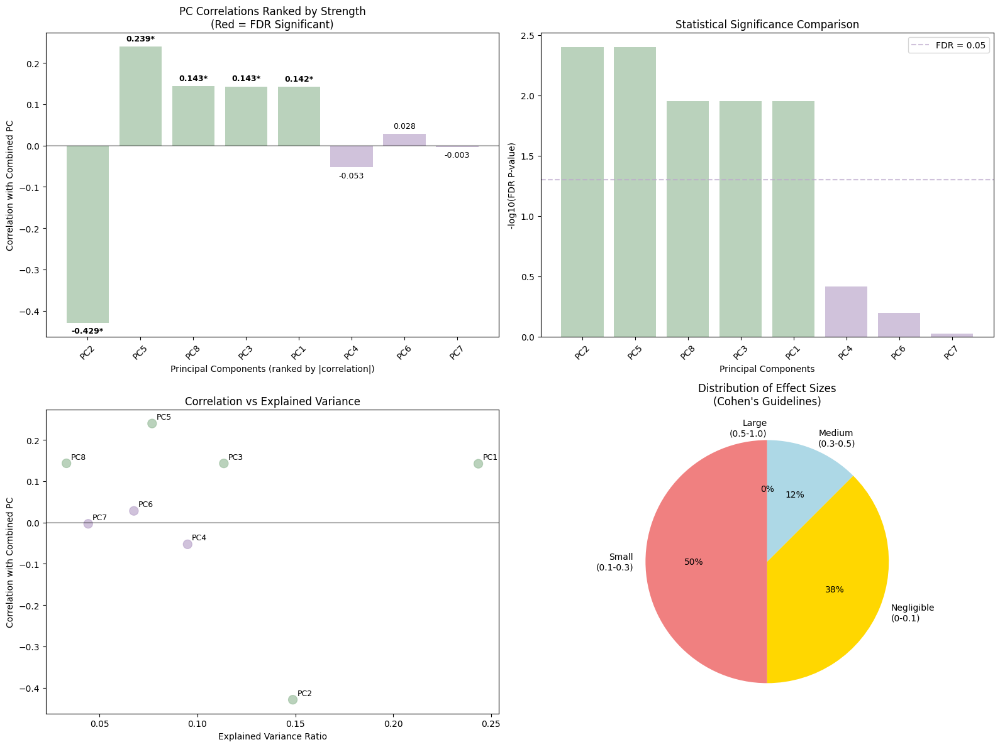


SUMMARY TABLE - ALL PRINCIPAL COMPONENTS:
 PC  Combined_Correlation  Combined_P_Value  Combined_P_FDR  Combined_Significant_FDR  Explained_Variance         Effect_Size  Rank_by_Correlation
PC2               -0.4291            0.0010          0.0040                      True              0.1487   Medium\n(0.3-0.5)                    1
PC5                0.2395            0.0010          0.0040                      True              0.0768    Small\n(0.1-0.3)                    2
PC8                0.1431            0.0070          0.0112                      True              0.0331    Small\n(0.1-0.3)                    3
PC3                0.1429            0.0050          0.0112                      True              0.1135    Small\n(0.1-0.3)                    4
PC1                0.1421            0.0070          0.0112                      True              0.2435    Small\n(0.1-0.3)                    5
PC4               -0.0529            0.2887          0.3849                

In [70]:
# Compare rho values across principal components for combined data
print("COMPARISON OF PRINCIPAL COMPONENT CORRELATIONS - COMBINED DATA")
print("=" * 80)

# Sort results by absolute correlation strength
pca_results_sorted = pca_correlation_results_combined.copy()
pca_results_sorted['Abs_Correlation'] = np.abs(pca_results_sorted['Combined_Correlation'])
pca_results_sorted = pca_results_sorted.sort_values('Abs_Correlation', ascending=False)

print("Principal Components ranked by correlation strength:")
print("-" * 60)
for idx, row in pca_results_sorted.iterrows():
    significance_marker = "***" if row['Combined_Significant_FDR'] else ""
    print(f"{row['PC']}: r = {row['Combined_Correlation']:+.4f} {significance_marker}")
    print(f"    p-value = {row['Combined_P_Value']:.4f}, FDR p-value = {row['Combined_P_FDR']:.4f}")
    print(f"    Explained Variance = {row['Explained_Variance']:.3f} ({row['Explained_Variance']*100:.1f}%)")
    print()

# Identify most significant correlation
most_significant_idx = pca_results_sorted['Combined_P_FDR'].idxmin()
most_significant_pc = pca_results_sorted.loc[most_significant_idx]

print("MOST STATISTICALLY SIGNIFICANT CORRELATION:")
print("=" * 50)
print(f"Principal Component: {most_significant_pc['PC']}")
print(f"Correlation (r): {most_significant_pc['Combined_Correlation']:+.4f}")
print(f"P-value: {most_significant_pc['Combined_P_Value']:.6f}")
print(f"FDR P-value: {most_significant_pc['Combined_P_FDR']:.6f}")
print(f"Explained Variance: {most_significant_pc['Explained_Variance']:.3f} ({most_significant_pc['Explained_Variance']*100:.1f}%)")
print(f"FDR Significant: {'Yes' if most_significant_pc['Combined_Significant_FDR'] else 'No'}")

# Identify strongest correlation (by absolute value)
strongest_correlation_idx = pca_results_sorted['Abs_Correlation'].idxmax()
strongest_correlation_pc = pca_results_sorted.loc[strongest_correlation_idx]

print("\nSTRONGEST CORRELATION (by absolute value):")
print("=" * 45)
print(f"Principal Component: {strongest_correlation_pc['PC']}")
print(f"Correlation (r): {strongest_correlation_pc['Combined_Correlation']:+.4f}")
print(f"P-value: {strongest_correlation_pc['Combined_P_Value']:.6f}")
print(f"FDR P-value: {strongest_correlation_pc['Combined_P_FDR']:.6f}")
print(f"Explained Variance: {strongest_correlation_pc['Explained_Variance']:.3f} ({strongest_correlation_pc['Explained_Variance']*100:.1f}%)")
print(f"FDR Significant: {'Yes' if strongest_correlation_pc['Combined_Significant_FDR'] else 'No'}")

# Statistical comparison visualization
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# 1. Bar plot of correlations ranked by strength
x_pos = np.arange(len(pca_results_sorted))
colors = ['#9dc0a0' if sig else '#bca8cd' for sig in pca_results_sorted['Combined_Significant_FDR']]

bars = axes[0,0].bar(x_pos, pca_results_sorted['Combined_Correlation'], 
                     color=colors, alpha=0.7)
axes[0,0].set_xlabel('Principal Components (ranked by |correlation|)')
axes[0,0].set_ylabel('Correlation with Combined PC')
axes[0,0].set_title('PC Correlations Ranked by Strength\n(Red = FDR Significant)')
axes[0,0].set_xticks(x_pos)
axes[0,0].set_xticklabels(pca_results_sorted['PC'], rotation=45)
axes[0,0].axhline(y=0, color='black', linestyle='-', alpha=0.3)

# Add correlation values on bars
for i, (bar, corr, sig) in enumerate(zip(bars, pca_results_sorted['Combined_Correlation'], 
                                        pca_results_sorted['Combined_Significant_FDR'])):
    height = bar.get_height()
    axes[0,0].text(bar.get_x() + bar.get_width()/2., 
                   height + 0.01 if height > 0 else height - 0.01,
                   f'{corr:.3f}{"*" if sig else ""}',
                   ha='center', va='bottom' if height > 0 else 'top',
                   fontsize=9, fontweight='bold' if sig else 'normal')

# 2. P-values comparison (log scale)
axes[0,1].bar(x_pos, -np.log10(pca_results_sorted['Combined_P_FDR']), 
              color=colors, alpha=0.7)
axes[0,1].axhline(y=-np.log10(0.05), color='#bca8cd', linestyle='--', 
                  label='FDR = 0.05', alpha=0.7)
axes[0,1].set_xlabel('Principal Components')
axes[0,1].set_ylabel('-log10(FDR P-value)')
axes[0,1].set_title('Statistical Significance Comparison')
axes[0,1].set_xticks(x_pos)
axes[0,1].set_xticklabels(pca_results_sorted['PC'], rotation=45)
axes[0,1].legend()

# 3. Correlation vs Explained Variance
scatter = axes[1,0].scatter(pca_results_sorted['Explained_Variance'], 
                           pca_results_sorted['Combined_Correlation'],
                           c=colors, s=100, alpha=0.7)
axes[1,0].set_xlabel('Explained Variance Ratio')
axes[1,0].set_ylabel('Correlation with Combined PC')
axes[1,0].set_title('Correlation vs Explained Variance')
axes[1,0].axhline(y=0, color='black', linestyle='-', alpha=0.3)

# Add PC labels
for _, row in pca_results_sorted.iterrows():
    axes[1,0].annotate(row['PC'], 
                       (row['Explained_Variance'], row['Combined_Correlation']),
                       xytext=(5, 5), textcoords='offset points', fontsize=9)

# 4. Effect size categorization
effect_sizes = np.abs(pca_results_sorted['Combined_Correlation'])
effect_categories = pd.cut(effect_sizes, 
                          bins=[0, 0.1, 0.3, 0.5, 1.0], 
                          labels=['Negligible\n(0-0.1)', 'Small\n(0.1-0.3)', 
                                 'Medium\n(0.3-0.5)', 'Large\n(0.5-1.0)'])

effect_counts = effect_categories.value_counts()
axes[1,1].pie(effect_counts.values, labels=effect_counts.index, autopct='%1.0f%%',
              startangle=90, colors=['lightcoral', 'gold', 'lightblue', 'lightgreen'])
axes[1,1].set_title('Distribution of Effect Sizes\n(Cohen\'s Guidelines)')

plt.tight_layout()
plt.savefig('/Users/ntaylor/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/Postdoc_Rob/Analysis/Graph_Theory/schaef_400/csf_regress_redo/Gene_Expression_Neuromaps/PC_correlation_comparison_combined.svg', 
            format='svg', bbox_inches='tight', dpi=300)
plt.show()

# Create summary table
print("\nSUMMARY TABLE - ALL PRINCIPAL COMPONENTS:")
print("=" * 80)
summary_table = pca_results_sorted[['PC', 'Combined_Correlation', 'Combined_P_Value', 
                                   'Combined_P_FDR', 'Combined_Significant_FDR', 
                                   'Explained_Variance']].copy()
summary_table['Effect_Size'] = effect_categories.values
summary_table['Rank_by_Correlation'] = range(1, len(summary_table) + 1)

print(summary_table.to_string(index=False, float_format='%.4f'))

# Count significant vs non-significant
n_significant = pca_results_sorted['Combined_Significant_FDR'].sum()
n_total = len(pca_results_sorted)

print(f"\nSTATISTICAL SUMMARY:")
print(f"Total Principal Components: {n_total}")
print(f"FDR Significant: {n_significant}")
print(f"Non-significant: {n_total - n_significant}")
print(f"Percentage Significant: {(n_significant/n_total)*100:.1f}%")

## FC comparison with the PC

In [ ]:
# Select the number of components to use (e.g., components explaining 80% of variance)
n_components_use = 8
ach_pca_selected = ach_pca_df.iloc[:, :n_components_use]

# load in avg_fc_nbm_del avg_fc_nbm_nondel


print(f"Using first {n_components_use} components for correlation analysis")

name_suffix ='Avg FC nbM'
# Calculate the correlation between avg_pc_del and receptor_data
mean_nbm_fc_del = np.mean(avg_fc_nbm_del, axis=0)
mean_nbm_fc_nondel = np.mean(avg_fc_nbm_nondel, axis=0)

# Correlate with your connectivity measures
correlations_pca_del = []
pvalues_pca_del = []
correlations_pca_nondel = []
pvalues_pca_nondel = []

for i, pc_name in enumerate(ach_pca_selected.columns):
    pc_values = ach_pca_selected[pc_name].values
    
    # Correlate with delirium group
    rho_del, pval_del = stats.permtest_pearsonr(mean_nbm_fc_del, pc_values)
    correlations_pca_del.append(rho_del)
    pvalues_pca_del.append(pval_del)
    
    # Correlate with non-delirium group
    rho_nondel, pval_nondel = stats.permtest_pearsonr(mean_nbm_fc_nondel, pc_values)
    correlations_pca_nondel.append(rho_nondel)
    pvalues_pca_nondel.append(pval_nondel)

# Create results dataframe
pca_correlation_results = pd.DataFrame({
    'PC': ach_pca_selected.columns,
    'Delirium_Correlation': correlations_pca_del,
    'Delirium_P_Value': pvalues_pca_del,
    'NonDelirium_Correlation': correlations_pca_nondel,
    'NonDelirium_P_Value': pvalues_pca_nondel,
    'Explained_Variance': pca.explained_variance_ratio_[:n_components_use]
})

print("PCA Component Correlations with Brain Connectivity:")
print(pca_correlation_results.round(4))

# Visualization 3: PCA correlation results
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# Bar plot of correlations
x_pos = np.arange(len(ach_pca_selected.columns))
width = 0.35

axes[0].bar(x_pos - width/2, correlations_pca_del, width, 
           label='Delirium', alpha=0.8, color='#7fb6cc')
axes[0].bar(x_pos + width/2, correlations_pca_nondel, width, 
           label='Non-Delirium', alpha=0.8, color='#f9a340')
axes[0].set_xlabel('Principal Components')
axes[0].set_ylabel('Correlation with Avg. FC')
axes[0].set_title('PCA Component Correlations')
axes[0].set_xticks(x_pos)
axes[0].set_xticklabels(ach_pca_selected.columns)
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Scatter plot comparing groups
axes[1].scatter(correlations_pca_del, correlations_pca_nondel, 
               s=100, alpha=0.7, c=range(len(correlations_pca_del)), cmap='viridis')
axes[1].set_xlabel('Delirium Group Correlation')
axes[1].set_ylabel('Non-Delirium Group Correlation')
axes[1].set_title('Correlation Comparison')
axes[1].plot([-1, 1], [-1, 1], 'k--', alpha=0.5)
axes[1].grid(True, alpha=0.3)

# Add PC labels
for i, pc in enumerate(ach_pca_selected.columns):
    axes[1].annotate(pc, (correlations_pca_del[i], correlations_pca_nondel[i]), 
                    xytext=(5, 5), textcoords='offset points')

plt.tight_layout()
plt.savefig('/Users/ntaylor/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/Postdoc_Rob/Analysis/Graph_Theory/schaef_400/csf_regress_redo/Gene_Expression_Neuromaps/corr_8pcs_ach_gene_vs_avg_fc_nbm.svg', 
                format='svg', bbox_inches='tight') 
plt.show()

Using first 8 components for correlation analysis


NameError: name 'avg_fc_nbm_del' is not defined

In [ ]:
#find significant results based on FDR correction
from statsmodels.stats.multitest import multipletests
# FDR correction for multiple comparisons
name_suffix ='Avg PC'

# Apply FDR correction to delirium p-values
rejected_del, pvals_fdr_del, _, _ = multipletests(
    pca_correlation_results['Delirium_P_Value'], 
    alpha=0.05, 
    method='fdr_bh'
)

# Apply FDR correction to non-delirium p-values
rejected_nondel, pvals_fdr_nondel, _, _ = multipletests(
    pca_correlation_results['NonDelirium_P_Value'], 
    alpha=0.05, 
    method='fdr_bh'
)

# Add FDR-corrected results to the DataFrame
pca_correlation_results['Delirium_P_FDR'] = pvals_fdr_del
pca_correlation_results['Delirium_Significant_FDR'] = rejected_del
pca_correlation_results['NonDelirium_P_FDR'] = pvals_fdr_nondel
pca_correlation_results['NonDelirium_Significant_FDR'] = rejected_nondel

# Show only FDR-significant results
fdr_significant_del = pca_correlation_results[pca_correlation_results['Delirium_Significant_FDR']]
fdr_significant_nondel = pca_correlation_results[pca_correlation_results['NonDelirium_Significant_FDR']]

if len(fdr_significant_del) > 0:
    print(f"\nFDR-Significant PCs in Delirium Group:")
    print(fdr_significant_del[['PC', 'Delirium_Correlation', 'Delirium_P_Value', 'Delirium_P_FDR']].round(4))

if len(fdr_significant_nondel) > 0:
    print(f"\nFDR-Significant PCs in Non-Delirium Group:")
    print(fdr_significant_nondel[['PC', 'NonDelirium_Correlation', 'NonDelirium_P_Value', 'NonDelirium_P_FDR']].round(4))

# Create scatter plots only for FDR-significant principal components
significant_pcs = set()

# Collect all FDR-significant PCs from both groups
if len(fdr_significant_del) > 0:
    significant_pcs.update(fdr_significant_del['PC'].values)
if len(fdr_significant_nondel) > 0:
    significant_pcs.update(fdr_significant_nondel['PC'].values)

print(f"Creating plots for {len(significant_pcs)} FDR-significant PCs: {list(significant_pcs)}")

# Create side-by-side scatter plots for FDR-significant principal components
for pc_name in significant_pcs:
    pc_index = list(ach_pca_selected.columns).index(pc_name)
    pc_values = ach_pca_selected[pc_name].values
    
    # Get correlation values and FDR results for this PC
    pc_row = pca_correlation_results[pca_correlation_results['PC'] == pc_name].iloc[0]
    
    rho_del = pc_row['Delirium_Correlation']
    pval_del = pc_row['Delirium_P_Value']
    pval_fdr_del = pc_row['Delirium_P_FDR']
    sig_fdr_del = pc_row['Delirium_Significant_FDR']
    
    rho_nondel = pc_row['NonDelirium_Correlation']
    pval_nondel = pc_row['NonDelirium_P_Value']
    pval_fdr_nondel = pc_row['NonDelirium_P_FDR']
    sig_fdr_nondel = pc_row['NonDelirium_Significant_FDR']
    
    # Create side-by-side plots
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    
    # Plot for Delirium group
    color_del = '#7fb6cc' if sig_fdr_del else '#cccccc'  # Gray if not FDR significant
    axes[0].scatter(mean_pc_del, pc_values, color=color_del, alpha=0.7, s=50)
    
    # Add regression line
    z = np.polyfit(mean_pc_del, pc_values, 1)
    p = np.poly1d(z)
    axes[0].plot(mean_pc_del, p(mean_pc_del), color=color_del, linewidth=2)
    
    title_del = f'Delirium Group: FC vs {pc_name}'
    if sig_fdr_del:
        title_del += ' (FDR Significant)'
    
    axes[0].set_xlabel('Average FC nbM - Delirium')
    axes[0].set_ylabel(f'{pc_name} (Explained Var: {pca.explained_variance_ratio_[pc_index]:.3f})')
    axes[0].set_title(title_del)
    axes[0].grid(True, alpha=0.3)
    
    # Add correlation stats for delirium
    axes[0].text(0.05, 0.95, f'r = {rho_del:.3f}', transform=axes[0].transAxes, 
                 fontsize=12, verticalalignment='top', 
                 bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    axes[0].text(0.05, 0.88, f'p = {pval_del:.3f}', transform=axes[0].transAxes, 
                 fontsize=12, verticalalignment='top', 
                 bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    axes[0].text(0.05, 0.81, f'p-FDR = {pval_fdr_del:.3f}', transform=axes[0].transAxes, 
                 fontsize=12, verticalalignment='top', 
                 bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    # Plot for Non-Delirium group
    color_nondel = '#f9a340' if sig_fdr_nondel else '#cccccc'  # Gray if not FDR significant
    axes[1].scatter(mean_pc_nondel, pc_values, color=color_nondel, alpha=0.7, s=50)
    
    # Add regression line
    z = np.polyfit(mean_pc_nondel, pc_values, 1)
    p = np.poly1d(z)
    axes[1].plot(mean_pc_nondel, p(mean_pc_nondel), color=color_nondel, linewidth=2)
    
    title_nondel = f'Non-Delirium Group:FC vs {pc_name}'
    if sig_fdr_nondel:
        title_nondel += ' (FDR Significant)'
    
    axes[1].set_xlabel('Average FC nbM - Non-Delirium')
    axes[1].set_ylabel(f'{pc_name} (Explained Var: {pca.explained_variance_ratio_[pc_index]:.3f})')
    axes[1].set_title(title_nondel)
    axes[1].grid(True, alpha=0.3)
    
    # Add correlation stats for non-delirium
    axes[1].text(0.05, 0.95, f'r = {rho_nondel:.3f}', transform=axes[1].transAxes, 
                 fontsize=12, verticalalignment='top', 
                 bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    axes[1].text(0.05, 0.88, f'p = {pval_nondel:.3f}', transform=axes[1].transAxes, 
                 fontsize=12, verticalalignment='top', 
                 bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    axes[1].text(0.05, 0.81, f'p-FDR = {pval_fdr_nondel:.3f}', transform=axes[1].transAxes, 
                 fontsize=12, verticalalignment='top', 
                 bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    # Add overall title
    fig.suptitle(f'{pc_name} vs Average PC Coefficients (FDR Corrected)', fontsize=16, fontweight='bold')
    
    plt.tight_layout()
    
    # Save the figure
    plt.savefig(f'/Users/ntaylor/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/Postdoc_Rob/Analysis/Graph_Theory/schaef_400/csf_regress_redo/Gene_Expression_Neuromaps/{pc_name}_PCA_vs_avg_fc_nbm_grouped_FDR.svg', 
                format='svg', bbox_inches='tight')
    plt.show()

WILLIAMS TEST FOR COMPARING PRINCIPAL COMPONENT CORRELATIONS
Comparing 8 principal components pairwise...
Note: Testing if correlation(combined_avg_pc, PC_i) ≠ correlation(combined_avg_pc, PC_j)

PC1 vs PC2:
  r(combined_avg_pc, PC1) = +0.1421
  r(combined_avg_pc, PC2) = -0.4291
  r(PC1, PC2) = -0.0000
  |Difference| = 0.5712
  Williams t = +8.9642, p = 0.0000 ***

PC1 vs PC3:
  r(combined_avg_pc, PC1) = +0.1421
  r(combined_avg_pc, PC3) = +0.1429
  r(PC1, PC3) = -0.0000
  |Difference| = 0.0008
  Williams t = -0.0115, p = 0.9908 ns

PC1 vs PC4:
  r(combined_avg_pc, PC1) = +0.1421
  r(combined_avg_pc, PC4) = -0.0529
  r(PC1, PC4) = +0.0000
  |Difference| = 0.1950
  Williams t = +2.7776, p = 0.0057 **

PC1 vs PC5:
  r(combined_avg_pc, PC1) = +0.1421
  r(combined_avg_pc, PC5) = +0.2395
  r(PC1, PC5) = +0.0000
  |Difference| = 0.0974
  Williams t = -1.4150, p = 0.1578 ns

PC1 vs PC6:
  r(combined_avg_pc, PC1) = +0.1421
  r(combined_avg_pc, PC6) = +0.0279
  r(PC1, PC6) = +0.0000
  |Differen

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


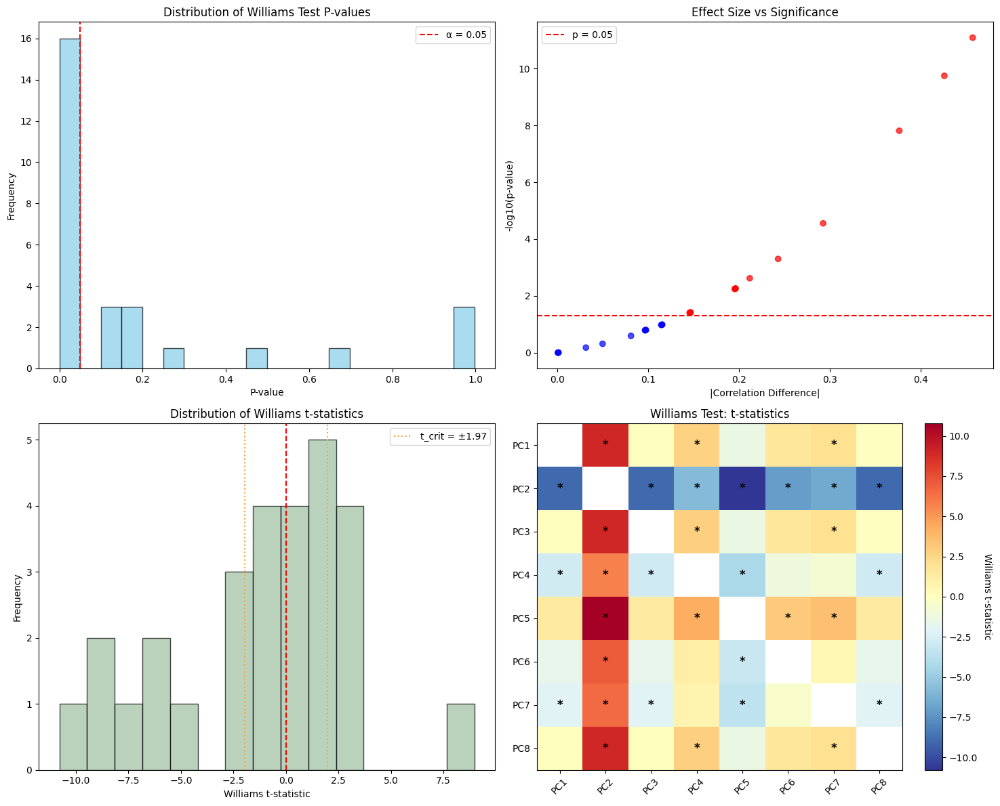


Results saved to: williams_test_PC_correlations_python.csv
Visualization saved to: Williams_test_PC_correlations_python.svg


In [77]:
import numpy as np
import pandas as pd
from scipy import stats
from statsmodels.stats.multitest import multipletests
import matplotlib.pyplot as plt
import seaborn as sns

def williams_test(r_xy, r_xz, r_yz, n):
    """
    Perform Williams test to compare two correlations from the same sample.
    Based on Williams (1959) and Steiger (1980) formulations.
    
    Parameters:
    r_xy: correlation between variable X and Y (combined_pc and PC_i)
    r_xz: correlation between variable X and Z (combined_pc and PC_j)
    r_yz: correlation between variable Y and Z (PC_i and PC_j)
    n: sample size
    
    Returns:
    t_statistic: Williams t-statistic
    p_value: two-tailed p-value
    """
    # Check for valid correlations
    if abs(r_xy) >= 1 or abs(r_xz) >= 1 or abs(r_yz) >= 1:
        return np.nan, np.nan
    
    # Calculate the determinant of the correlation matrix
    # R = |1   r_xy  r_xz|
    #     |r_xy  1   r_yz|
    #     |r_xz r_yz   1 |
    R = 1 - r_xy**2 - r_xz**2 - r_yz**2 + 2*r_xy*r_xz*r_yz
    
    # Check if determinant is positive (matrix is positive definite)
    if R <= 0:
        return np.nan, np.nan
    
    # Williams-Hotelling t-test statistic
    # Numerator: difference in correlations times adjustment factor
    numerator = (r_xy - r_xz) * np.sqrt((n - 1) * (1 + r_yz))
    
    # Denominator: square root of variance estimate
    variance_term = 2 * R * (n - 1) / (n - 3)
    bias_correction = ((r_xy + r_xz)**2 / 4) * (1 - r_yz)**3
    denominator = np.sqrt(variance_term + bias_correction)
    
    if denominator == 0:
        return np.nan, np.nan
        
    t_stat = numerator / denominator
    
    # Calculate p-value (two-tailed test)
    df = n - 3
    p_value = 2 * (1 - stats.t.cdf(abs(t_stat), df))
    
    return t_stat, p_value

# Apply Williams test to compare correlations between different principal components
print("WILLIAMS TEST FOR COMPARING PRINCIPAL COMPONENT CORRELATIONS")
print("=" * 70)

# Get the correlation data from your results
pc_correlations = pca_correlation_results_combined.copy()
pc_names = pc_correlations['PC'].values
correlations = pc_correlations['Combined_Correlation'].values
n_components = len(pc_names)

# Calculate correlations between different PCs using the gene expression data
pc_intercorrelations = np.corrcoef(ach_pca_selected.values.T)

print(f"Comparing {n_components} principal components pairwise...")
print("Note: Testing if correlation(combined_avg_pc, PC_i) ≠ correlation(combined_avg_pc, PC_j)")
print()

# Store results
williams_results = []

# Perform pairwise Williams tests
for i in range(n_components):
    for j in range(i + 1, n_components):
        pc_i = pc_names[i]
        pc_j = pc_names[j]
        
        # r_xy: correlation between combined_avg_pc and PC_i
        r_xy = correlations[i]
        
        # r_xz: correlation between combined_avg_pc and PC_j  
        r_xz = correlations[j]
        
        # r_yz: correlation between PC_i and PC_j
        r_yz = pc_intercorrelations[i, j]
        
        # Sample size (number of brain regions)
        n = 400
        
        # Perform Williams test
        t_stat, p_value = williams_test(r_xy, r_xz, r_yz, n)
        
        # Store results
        williams_results.append({
            'PC_i': pc_i,
            'PC_j': pc_j,
            'r_combined_PC_i': r_xy,
            'r_combined_PC_j': r_xz,
            'r_PC_i_PC_j': r_yz,
            'correlation_difference': abs(r_xy - r_xz),
            'Williams_t': t_stat,
            'p_value': p_value,
            'significant_05': p_value < 0.05 if not np.isnan(p_value) else False,
            'significant_01': p_value < 0.01 if not np.isnan(p_value) else False,
            'significant_001': p_value < 0.001 if not np.isnan(p_value) else False
        })
        
        # Print individual comparison
        if not np.isnan(t_stat):
            sig_marker = "***" if p_value < 0.001 else "**" if p_value < 0.01 else "*" if p_value < 0.05 else "ns"
            print(f"{pc_i} vs {pc_j}:")
            print(f"  r(combined_avg_pc, {pc_i}) = {r_xy:+.4f}")
            print(f"  r(combined_avg_pc, {pc_j}) = {r_xz:+.4f}")
            print(f"  r({pc_i}, {pc_j}) = {r_yz:+.4f}")
            print(f"  |Difference| = {abs(r_xy - r_xz):.4f}")
            print(f"  Williams t = {t_stat:+.4f}, p = {p_value:.4f} {sig_marker}")
            print()
        else:
            print(f"{pc_i} vs {pc_j}: Unable to compute (invalid correlation matrix)")
            print()

# Convert results to DataFrame
williams_df = pd.DataFrame(williams_results)

# Apply FDR correction for multiple comparisons
valid_pvalues = williams_df['p_value'][~williams_df['p_value'].isna()]
if len(valid_pvalues) > 0:
    rejected_fdr, pvals_fdr, _, _ = multipletests(valid_pvalues, alpha=0.05, method='fdr_bh')
    williams_df.loc[~williams_df['p_value'].isna(), 'p_value_fdr'] = pvals_fdr
    williams_df.loc[~williams_df['p_value'].isna(), 'significant_fdr'] = rejected_fdr

# Summary results
print("SUMMARY OF WILLIAMS TEST RESULTS:")
print("=" * 40)

significant_uncorrected = williams_df[williams_df['significant_05']].copy()
significant_fdr = williams_df[williams_df.get('significant_fdr', False)].copy()

print(f"Total comparisons: {len(williams_df)}")
print(f"Significant (p < 0.05): {len(significant_uncorrected)}")
print(f"Significant (FDR corrected): {len(significant_fdr)}")

if len(significant_uncorrected) > 0:
    print(f"\nSignificant differences (uncorrected p < 0.05):")
    for _, row in significant_uncorrected.iterrows():
        print(f"  {row['PC_i']} vs {row['PC_j']}: Δr = {row['correlation_difference']:.4f}, p = {row['p_value']:.4f}")

if len(significant_fdr) > 0:
    print(f"\nSignificant differences (FDR corrected):")
    for _, row in significant_fdr.iterrows():
        print(f"  {row['PC_i']} vs {row['PC_j']}: Δr = {row['correlation_difference']:.4f}, p_FDR = {row['p_value_fdr']:.4f}")

# Sort by p-value and display top results
williams_sorted = williams_df[~williams_df['p_value'].isna()].sort_values('p_value').head(10)
print(f"\nTop 10 most significant comparisons:")
print("-" * 85)
print(f"{'PC_i':<6} {'PC_j':<6} {'r_i':<8} {'r_j':<8} {'|Δr|':<8} {'t':<8} {'p-value':<10} {'Sig':<4}")
print("-" * 85)
for _, row in williams_sorted.iterrows():
    sig_marker = "***" if row['p_value'] < 0.001 else "**" if row['p_value'] < 0.01 else "*" if row['p_value'] < 0.05 else "ns"
    print(f"{row['PC_i']:<6} {row['PC_j']:<6} {row['r_combined_PC_i']:+6.3f}  "
          f"{row['r_combined_PC_j']:+6.3f}  {row['correlation_difference']:6.3f}  "
          f"{row['Williams_t']:+6.3f}  {row['p_value']:8.4f}  {sig_marker:<4}")

# Create visualization
fig, axes = plt.subplots(2, 2, figsize=(15, 12))

# 1. P-value distribution
valid_p_values = williams_df['p_value'][~williams_df['p_value'].isna()]
axes[0,0].hist(valid_p_values, bins=20, alpha=0.7, color='skyblue', edgecolor='black')
axes[0,0].axvline(x=0.05, color='red', linestyle='--', label='α = 0.05')
axes[0,0].set_xlabel('P-value')
axes[0,0].set_ylabel('Frequency')
axes[0,0].set_title('Distribution of Williams Test P-values')
axes[0,0].legend()

# 2. Correlation differences vs significance
correlation_diffs = williams_df['correlation_difference'][~williams_df['p_value'].isna()]
p_vals_plot = williams_df['p_value'][~williams_df['p_value'].isna()]
colors = ['red' if p < 0.05 else 'blue' for p in p_vals_plot]

axes[0,1].scatter(correlation_diffs, -np.log10(p_vals_plot), c=colors, alpha=0.7)
axes[0,1].axhline(y=-np.log10(0.05), color='red', linestyle='--', label='p = 0.05')
axes[0,1].set_xlabel('|Correlation Difference|')
axes[0,1].set_ylabel('-log10(p-value)')
axes[0,1].set_title('Effect Size vs Significance')
axes[0,1].legend()

# 3. Williams t-statistics distribution
valid_t_stats = williams_df['Williams_t'][~williams_df['Williams_t'].isna()]
axes[1,0].hist(valid_t_stats, bins=15, alpha=0.7, color='#9dc0a0', edgecolor='black')
axes[1,0].axvline(x=0, color='red', linestyle='--')
# Add critical values
t_critical = stats.t.ppf(0.975, df=397)  # df = n - 3
axes[1,0].axvline(x=t_critical, color='#faa441', linestyle=':', label=f't_crit = ±{t_critical:.2f}')
axes[1,0].axvline(x=-t_critical, color='#faa441', linestyle=':')
axes[1,0].set_xlabel('Williams t-statistic')
axes[1,0].set_ylabel('Frequency')
axes[1,0].set_title('Distribution of Williams t-statistics')
axes[1,0].legend()

# 4. Correlation matrix heatmap of p-values
#if len(williams_df) > 0:
    # Create matrix for heatmap
    #n_pcs = len(pc_names)
    #p_matrix = np.ones((n_pcs, n_pcs))
    
    #for _, row in williams_df.iterrows():
        #if not np.isnan(row['p_value']):
         #   i = list(pc_names).index(row['PC_i'])
          #  j = list(pc_names).index(row['PC_j'])
           ## p_matrix[i, j] = row['p_value']
           # p_matrix[j, i] = row['p_value']
    
    # Mask diagonal
   # mask = np.eye(n_pcs, dtype=bool)
   # p_matrix_masked = np.ma.masked_array(p_matrix, mask)
    
    #im = axes[1,1].imshow(-np.log10(p_matrix_masked), cmap='Purples', aspect='auto')
    #axes[1,1].set_title('Williams Test: -log10(p-values)')
    #axes[1,1].set_xticks(range(len(pc_names)))
   # axes[1,1].set_yticks(range(len(pc_names)))
    #axes[1,1].set_xticklabels(pc_names, rotation=45)
   # axes[1,1].set_yticklabels(pc_names)
    #plt.colorbar(im, ax=axes[1,1])

#plt.tight_layout()
#plt.savefig('Williams_test_PC_correlations_python.svg', format='svg', bbox_inches='tight', dpi=300)
#plt.show()
#5. T-test results summary
if len(williams_df) > 0:
    # Create matrix for heatmap of t-values
    n_pcs = len(pc_names)
    t_matrix = np.zeros((n_pcs, n_pcs))
    
    for _, row in williams_df.iterrows():
        if not np.isnan(row['Williams_t']):
            i = list(pc_names).index(row['PC_i'])
            j = list(pc_names).index(row['PC_j'])
            t_matrix[i, j] = row['Williams_t']
            t_matrix[j, i] = -row['Williams_t']  # Mirror with opposite sign
    
    # Mask diagonal (set to NaN for visualization)
    mask = np.eye(n_pcs, dtype=bool)
    t_matrix_masked = np.ma.masked_array(t_matrix, mask)
    
    # Use a diverging colormap centered at 0
    im = axes[1,1].imshow(t_matrix_masked, cmap='RdYlBu_r', aspect='auto', 
                          vmin=-np.nanmax(np.abs(t_matrix_masked)), 
                          vmax=np.nanmax(np.abs(t_matrix_masked)))
    axes[1,1].set_title('Williams Test: t-statistics')
    axes[1,1].set_xticks(range(len(pc_names)))
    axes[1,1].set_yticks(range(len(pc_names)))
    axes[1,1].set_xticklabels(pc_names, rotation=45)
    axes[1,1].set_yticklabels(pc_names)
    
    # Add colorbar with better formatting
    cbar = plt.colorbar(im, ax=axes[1,1])
    cbar.set_label('Williams t-statistic', rotation=270, labelpad=15)
    
    # Add significance contours or markers
    # Mark cells that are significant (|t| > critical value)
    t_critical = stats.t.ppf(0.975, df=397)  # df = n - 3
    for i in range(n_pcs):
        for j in range(n_pcs):
            if i != j and abs(t_matrix[i, j]) > t_critical:
                # Add asterisk for significant comparisons
                axes[1,1].text(j, i, '*', ha='center', va='center', 
                              color='black', fontsize=12, fontweight='bold')
plt.tight_layout()
plt.savefig('/Users/ntaylor/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/Postdoc_Rob/Analysis/Graph_Theory/schaef_400/csf_regress_redo/Gene_Expression_Neuromaps/Williams_test_PC_correlation_ttest.svg', format='svg', bbox_inches='tight', dpi=300)
plt.show()               


# Save results
williams_df.to_csv('williams_test_PC_correlations_python.csv', index=False)
print(f"\nResults saved to: williams_test_PC_correlations_python.csv")
print(f"Visualization saved to: Williams_test_PC_correlations_python.svg")


In [80]:
# Final interpretation
print(f"\nINTERPRETATION:")
print("=" * 20)
print("The Williams test determines if principal components have significantly")
print("different correlations with the combined_avg_pc variable.")
print(f"Out of {len(williams_df)} pairwise comparisons:")
print(f"- {len(significant_uncorrected)} showed significant differences (p < 0.05)")
print(f"- {len(significant_fdr)} remained significant after FDR correction")

if len(significant_fdr) > 0:
    print(f"\nThis indicates that some PCs have genuinely different associations")
    print(f"with the combined participation coefficient measure.")
else:
    print(f"\nThis suggests that the PCs have similar strength of association")
    print(f"with the combined participation coefficient measure.")


INTERPRETATION:
The Williams test determines if principal components have significantly
different correlations with the combined_avg_pc variable.
Out of 28 pairwise comparisons:
- 16 showed significant differences (p < 0.05)
- 13 remained significant after FDR correction

This indicates that some PCs have genuinely different associations
with the combined participation coefficient measure.


In [ ]:
# Select the number of components to use (e.g., components explaining 80% of variance)
n_components_use = 8
ach_pca_selected = ach_pca_df.iloc[:, :n_components_use]

print(f"Using first {n_components_use} components for correlation analysis")

# load in the relevant data
path = '/Users/ntaylor/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/Postdoc_Rob/Analysis/Graph_Theory/schaef_400'
#path2 = '/Users/ntaylor/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/Postdoc_Rob/Analysis/Graph_Theory/schaef_400/PCA_LDA/Python'
# load the receptor LDA coefficients
#LDA_coeffs_weights_select_time_delirium_avg_dFC_mtd_nbm.csv
#lda_coefficient_weights_overtime_mtd_ppn.csv
lda_coeff = np.genfromtxt(path + '/LDA_coeffs_weights_select_time_delta_avg_dFC_mtd_nbm.csv', delimiter=',', skip_header=1)
#lda_coeff = np.genfromtxt(path + '/lda_coefficient_weights_overtime_mtd_ppn.csv', delimiter=',', skip_header=1)
# name suffix
name_suffix='nbM avg delta dFC LDA'

# Correlate with your connectivity measures
correlations_pca = []
pvalues_pca = []

for i, pc_name in enumerate(ach_pca_selected.columns):
    pc_values = ach_pca_selected[pc_name].values
    
    # Correlate with delirium group
    rho, pval = stats.permtest_pearsonr(lda_coeff[1:400], pc_values)
    correlations_pca.append(rho)
    pvalues_pca.append(pval)
    

# Create results dataframe
pca_correlation_results = pd.DataFrame({
    'PC': ach_pca_selected.columns,
    'Correlation': correlations_pca,
    'P_Value': pvalues_pca,
    'Explained_Variance': pca.explained_variance_ratio_[:n_components_use]
})

print("PCA Component Correlations with Brain Connectivity:")
print(pca_correlation_results.round(4))

# Visualization 3: PCA correlation results
fig, ax = plt.subplots(figsize=(8, 6))

# Bar plot of correlations for a single group (LDA coefficients vs PCs)
x_pos = np.arange(len(ach_pca_selected.columns))
ax.bar(x_pos, correlations_pca, width=0.6, color='#7fb6cc', alpha=0.8)
ax.set_xlabel('Principal Components')
ax.set_ylabel('Correlation with LDA Coefficients')
ax.set_title('PCA Component Correlations with LDA Coefficients')
ax.set_xticks(x_pos)
ax.set_xticklabels(ach_pca_selected.columns)
ax.grid(True, alpha=0.3)

# Add correlation value labels on bars
for i, v in enumerate(correlations_pca):
    ax.text(i, v + 0.02 * np.sign(v), f"{v:.2f}", ha='center', va='bottom' if v >= 0 else 'top', fontsize=10)

plt.tight_layout()
#plt.savefig('/Users/ntaylor/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/Postdoc_Rob/Analysis/Gene_Expression_Neuromaps/corr_8pcs_ach_gene_vs_lda_nbm_coeffs.svg', 
            #format='svg', bbox_inches='tight')
plt.show()


FDR-Significant PCs in Delirium Group:
    PC  Delirium_Correlation  Delirium_P_Value  Delirium_P_FDR
1  PC2               -0.3445             0.001          0.0027
2  PC3               -0.2871             0.001          0.0027
5  PC6                0.1926             0.001          0.0027

FDR-Significant PCs in Non-Delirium Group:
    PC  NonDelirium_Correlation  NonDelirium_P_Value  NonDelirium_P_FDR
1  PC2                  -0.3168                0.001             0.0027
2  PC3                  -0.2851                0.001             0.0027
5  PC6                   0.2197                0.001             0.0027
Creating plots for 3 FDR-significant PCs: ['PC3', 'PC2', 'PC6']


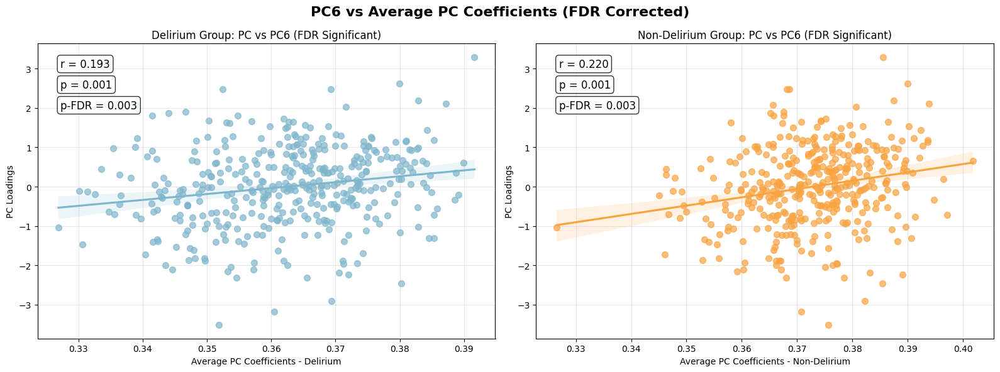

In [64]:
#find significant results based on FDR correction
from statsmodels.stats.multitest import multipletests
# FDR correction for multiple comparisons
name_suffix ='Avg PC'

# Apply FDR correction to delirium p-values
rejected_del, pvals_fdr_del, _, _ = multipletests(
    pca_correlation_results['Delirium_P_Value'], 
    alpha=0.05, 
    method='fdr_bh'
)

# Apply FDR correction to non-delirium p-values
rejected_nondel, pvals_fdr_nondel, _, _ = multipletests(
    pca_correlation_results['NonDelirium_P_Value'], 
    alpha=0.05, 
    method='fdr_bh'
)

# Add FDR-corrected results to the DataFrame
pca_correlation_results['Delirium_P_FDR'] = pvals_fdr_del
pca_correlation_results['Delirium_Significant_FDR'] = rejected_del
pca_correlation_results['NonDelirium_P_FDR'] = pvals_fdr_nondel
pca_correlation_results['NonDelirium_Significant_FDR'] = rejected_nondel

# Show only FDR-significant results
fdr_significant_del = pca_correlation_results[pca_correlation_results['Delirium_Significant_FDR']]
fdr_significant_nondel = pca_correlation_results[pca_correlation_results['NonDelirium_Significant_FDR']]

if len(fdr_significant_del) > 0:
    print(f"\nFDR-Significant PCs in Delirium Group:")
    print(fdr_significant_del[['PC', 'Delirium_Correlation', 'Delirium_P_Value', 'Delirium_P_FDR']].round(4))

if len(fdr_significant_nondel) > 0:
    print(f"\nFDR-Significant PCs in Non-Delirium Group:")
    print(fdr_significant_nondel[['PC', 'NonDelirium_Correlation', 'NonDelirium_P_Value', 'NonDelirium_P_FDR']].round(4))

# Create scatter plots only for FDR-significant principal components
significant_pcs = set()

# Collect all FDR-significant PCs from both groups
if len(fdr_significant_del) > 0:
    significant_pcs.update(fdr_significant_del['PC'].values)
if len(fdr_significant_nondel) > 0:
    significant_pcs.update(fdr_significant_nondel['PC'].values)

print(f"Creating plots for {len(significant_pcs)} FDR-significant PCs: {list(significant_pcs)}")

# Create side-by-side scatter plots for FDR-significant principal components
for pc_name in significant_pcs:
    pc_index = list(ach_pca_selected.columns).index(pc_name)
    pc_values = ach_pca_selected[pc_name].values
    
    # Get correlation values and FDR results for this PC
    pc_row = pca_correlation_results[pca_correlation_results['PC'] == pc_name].iloc[0]
    
    rho_del = pc_row['Delirium_Correlation']
    pval_del = pc_row['Delirium_P_Value']
    pval_fdr_del = pc_row['Delirium_P_FDR']
    sig_fdr_del = pc_row['Delirium_Significant_FDR']
    
    rho_nondel = pc_row['NonDelirium_Correlation']
    pval_nondel = pc_row['NonDelirium_P_Value']
    pval_fdr_nondel = pc_row['NonDelirium_P_FDR']
    sig_fdr_nondel = pc_row['NonDelirium_Significant_FDR']
    
 # Create side-by-side plots
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Plot for Delirium group using seaborn regplot
color_del = '#7fb6cc' if sig_fdr_del else '#cccccc'  # Gray if not FDR significant
sns.regplot(x=mean_pc_del, y=pc_values, ax=axes[0], 
            color=color_del, scatter_kws={'alpha': 0.7, 's': 50})

title_del = f'Delirium Group: PC vs {pc_name}'
if sig_fdr_del:
    title_del += ' (FDR Significant)'

axes[0].set_xlabel('Average PC Coefficients - Delirium')
axes[0].set_ylabel('PC Loadings')
axes[0].set_title(title_del)
axes[0].grid(True, alpha=0.3)

# Add correlation stats for delirium
axes[0].text(0.05, 0.95, f'r = {rho_del:.3f}', transform=axes[0].transAxes, 
             fontsize=12, verticalalignment='top', 
             bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
axes[0].text(0.05, 0.88, f'p = {pval_del:.3f}', transform=axes[0].transAxes, 
             fontsize=12, verticalalignment='top', 
             bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
axes[0].text(0.05, 0.81, f'p-FDR = {pval_fdr_del:.3f}', transform=axes[0].transAxes, 
             fontsize=12, verticalalignment='top', 
             bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

# Plot for Non-Delirium group using seaborn regplot
color_nondel = '#f9a340' if sig_fdr_nondel else '#cccccc'  # Gray if not FDR significant
sns.regplot(x=mean_pc_nondel, y=pc_values, ax=axes[1], 
            color=color_nondel, scatter_kws={'alpha': 0.7, 's': 50})

title_nondel = f'Non-Delirium Group: PC vs {pc_name}'
if sig_fdr_nondel:
    title_nondel += ' (FDR Significant)'

axes[1].set_xlabel('Average PC Coefficients - Non-Delirium')
axes[1].set_ylabel('PC Loadings')
axes[1].set_title(title_nondel)
axes[1].grid(True, alpha=0.3)

# Add correlation stats for non-delirium
axes[1].text(0.05, 0.95, f'r = {rho_nondel:.3f}', transform=axes[1].transAxes, 
             fontsize=12, verticalalignment='top', 
             bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
axes[1].text(0.05, 0.88, f'p = {pval_nondel:.3f}', transform=axes[1].transAxes, 
             fontsize=12, verticalalignment='top', 
             bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
axes[1].text(0.05, 0.81, f'p-FDR = {pval_fdr_nondel:.3f}', transform=axes[1].transAxes, 
             fontsize=12, verticalalignment='top', 
             bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

# Add overall title
fig.suptitle(f'{pc_name} vs Average PC Coefficients (FDR Corrected)', fontsize=16, fontweight='bold')

plt.tight_layout()

# Save the figure
plt.savefig(f'/Users/ntaylor/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/Postdoc_Rob/Analysis/Graph_Theory/schaef_400/csf_regress_redo/Gene_Expression_Neuromaps/{pc_name}_PCA_vs_avg_pc_grouped_FDR.svg', 
            format='svg', bbox_inches='tight')
plt.show()